In [1]:
import os
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import sklearn.metrics
from matplotlib import pyplot as plt
import seaborn as sns
#%matplotlib inline
from sklearn.metrics.pairwise import cosine_similarity
from scipy import stats

sys.path.insert(1, '../mhCompTiss/')
import scanpyHelpers as scH

In [2]:
#hdata = sc.read_h5ad('../mhCompTiss/write/pdacMouseuntreated.h5ad')
#hdata.write('write/mouse_Pancreas_TT.h5ad')

In [3]:
#adata=sc.read(results_file_post)
#adata.uns['log1p'] = {"base":None}

In [4]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 python-igraph==0.10.4 pynndescent==0.5.12


In [5]:
#plt.__version__

In [6]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
#sc.settings.figdir = "figures/" + fileName + "/"
#figName = fileName

In [7]:
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["font.family"] = "Arial"

In [8]:
homology = pd.read_table("../mhCompTiss/data/hgncHM_121.csv", sep=",")
mouseGenes = np.array(homology["mouse"])
humanGenes = np.array(homology["human"])
m2h = dict(zip(mouseGenes,humanGenes))
h2m = dict(zip(humanGenes,mouseGenes))
#[m2h[g] for g in adiGenes if g in m2h.keys()]
homology

,mouse,human
0,A1bg,A1BG
1,A1cf,A1CF
2,A2m,A2M
3,A3galt2,A3GALT2
4,A4galt,A4GALT
...,...,...
17271,Zyg11a,ZYG11A
17272,Zyg11b,ZYG11B
17273,Zyx,ZYX
17274,Zzef1,ZZEF1


In [9]:
def convertDf(inDf, convDict):
    newGs = []
    for gs in inDf:
        newGs.append([convDict[g] for g in inDf[gs] if g in convDict.keys()])
    return(pd.DataFrame(newGs, index=inDf.columns).T)


In [10]:
sigFile = "data/geneSigs/EMT.csv"
hEMT = pd.read_csv(sigFile)
mEMT = convertDf(hEMT, h2m)

In [11]:
sigFile = "../mhCompTiss/data/LUAD/geneSigs/KAC.csv"
hKac = pd.DataFrame(pd.read_csv(sigFile, skiprows=1)["gene"][:500].values, columns=["KAC"])
mKac = convertDf(hKac, h2m)

In [12]:
sigFile = "data/geneSigs/skinLowerSpike.csv"
mSkinGS = pd.read_csv(sigFile)[:500]
hSkinGS = convertDf(mSkinGS, m2h)

In [13]:
sigFile = "data/geneSigs/colonHRC.xlsx"
hColonGS = pd.read_excel(sigFile,sheet_name=0,skiprows=1)[:500]
mColonGS = convertDf(hColonGS[['coreHRC']], h2m)
hColonGS = hColonGS[['coreHRC']]#[['All-HR', 'TME-HR', 'EpiHR', 'Lgr5 signature', 'coreHRC']]

In [14]:
sigFile = "data/geneSigs/prostateL1geneSig.xlsx"
geneSignName = ["L1","L2","B","ADENO","NEPC"]
geneLists = []
for i,sheet in enumerate([0,2,4,6,8]):
    sigGenes = pd.read_excel(sigFile,sheet_name=sheet)
    geneLists.append(sigGenes["Gene"][:500])
hProstGS = pd.DataFrame(geneLists, index=geneSignName).T
hProstGS = hProstGS[['ADENO']]
mProstGS = convertDf(hProstGS, h2m)

In [19]:
plast = pd.read_table("data/geneSigs/plasticityJoeC.txt",sep=",")
plast = plast["gene"][plast["correlation"]>0.3]
hProstGS = pd.DataFrame(plast)
hProstGS = hProstGS.rename(columns = {"gene":"plast"})
mProstGS = convertDf(hProstGS, h2m)

In [20]:
sigFile = "data/geneSigs/rengenGeneLists/PancreasPlasticBurdziak.csv"
sigGenes = pd.read_csv(sigFile, skiprows=1)
Fplas = sigGenes["gene"].values[:200]
hPancrBGS = pd.DataFrame(Fplas, columns=["Burdziak_Plasticity"])
mPancrBGS = convertDf(hPancrBGS, h2m)

In [21]:
hPancrGS = pd.read_csv("../mhCompTiss/data/PDAC/basClaSigGenes.csv")
hPancrGS = hPancrGS[["scBasal"]]
mPancrGS = convertDf(hPancrGS, h2m)

In [22]:
sigFile = "data/geneSigs/multiGeneSig.xlsx"
hMultiGS = pd.read_excel(sigFile,sheet_name=2,skiprows=2)
mMultiGS = convertDf(hMultiGS, h2m)

In [23]:
mLungGS = mMultiGS[["Stress"]]
hLungGS = convertDf(mLungGS, m2h)
mStressGS = mMultiGS[["Stress"]]
stress = mStressGS.dropna().values.flatten()
hStressGS = convertDf(mLungGS, m2h)

In [24]:
sigFile = "data/geneSigs/tiroshGS.csv"
hTiroshGS = pd.read_csv(sigFile)
mTiroshGS = convertDf(hTiroshGS, h2m)

In [25]:
sigFile = "../mhCompTiss/data/LUAD/humanLUADgeneSig.csv"
sigGenes = pd.read_csv(sigFile)
hhpcs = sigGenes["hpcs"].values

In [26]:
sigFile = "../mhCompTiss/data/LUAD/simpLUADbig.csv"
sigGenes = pd.read_csv(sigFile)
mhpcs = sigGenes["HPCS"].values[:250]
hpcs = sigGenes["HPCS"].values[:250]

In [27]:
sigFile = "data/geneSigs/rengenGeneLists/RengenIntestMorralCl14.csv"
sigGenes = pd.read_csv(sigFile, skiprows=1)
revSC = sigGenes["genes"]
sigFile = "data/geneSigs/rengenGeneLists/RegenIntesAyyaz.csv"
sigGenes = pd.read_csv(sigFile, skiprows=1)
ssc2 = sigGenes["Revival Signature_Gene "].values
mIntestGS = pd.DataFrame([revSC,ssc2], index=["revSC","ssc2"]).T
hIntestGS = convertDf(mIntestGS, m2h)

In [28]:
sigFile = "data/geneSigs/rengenGeneLists/PancreasPlasticBurdziak.csv"
sigGenes = pd.read_csv(sigFile, skiprows=1)
plas = sigGenes["gene"].values[-200:]
hPlasGS = pd.DataFrame([plas], index=["BurdziakPlastic"]).T
mPlasGS = convertDf(hPlasGS, h2m)

In [29]:
mouseGenes = ["Plaur",  "Slc4a11"]
humanGenes = ["PLAUR",  "SLC4A11"]

In [30]:
#hhpcs = set(hhpcs).difference(set(humanGenes))
#humanGS["HPCS"] = list(hhpcs)+[np.nan]*(500-len(list(hhpcs)))

#mhpcs = set(mhpcs).difference(set(mouseGenes))
#mouseGS["HPCS"] = list(mhpcs)+[np.nan]*(462-len(list(mhpcs)))

In [31]:
#humanGS.to_csv("data/geneSigs/humanGeneSets.csv")
#mouseGS =pd.read_csv("data/geneSigs/mouseGeneSets.csv")

In [32]:
sigGenes

,gene
0,SLCO2B1
1,BEND5
2,SLCO5A1
3,SLC24A2
4,AGBL4
...,...
14274,ZFP36L1
14275,FBXO31
14276,HES1
14277,PCX


In [33]:
mouseGS = mProstGS.join(mColonGS).join(mSkinGS).join(mPancrGS).join(mPancrBGS).join(mEMT).join(mLungGS).join(mKac).join(mIntestGS).join(pd.DataFrame(mhpcs, columns=['HPCS'])
)#.join(convertDf(hColonGS, h2m))
mouseGS.to_csv("figures/cellSigs.csv")
mouseGS

,plast,coreHRC,lowerSpike,scBasal,Burdziak_Plasticity,EMT,Stress,KAC,revSC,ssc2,HPCS
0,Csrp1,Lamb3,Klk12,Krt13,Slco2b1,Abi3bp,Abhd3,Gapdh,Anxa8,Malat1,Slc4a11
1,Ifitm3,Sdcbp2,Cnfn,Krt17,Bend5,Acta2,Adamts1,Igfbp3,Atg9b,Ly6d,Il23a
2,Bst2,Emp1,Sprr2j-ps,Ly6d,Slco5a1,Adam12,Ankrd28,Agr2,Slc4a11,Clu,Rrad
3,Arpc1b,Eps8l1,Gm3776,Krt7,Slc24a2,Anpep,Ankrd37,Timp1,Mdfi,Cldn4,Tnf
4,Txndc5,Jup,Alox12b,Krt5,Agbl4,Aplp1,Arc,Mdk,Anxa1,Sprr1a,Abtb2
...,...,...,...,...,...,...,...,...,...,...,...
4017,E2f2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4018,Lnx1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4019,Lrrc47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4020,Upb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
#for mgs in mouseGS: 
#    print(mgs)
#    gsNum, overNum, hpcsNum = len(mouseGS[mgs].dropna()), len(hpcs), len(set(mouseGS[mgs]).intersection(set(hpcs)))

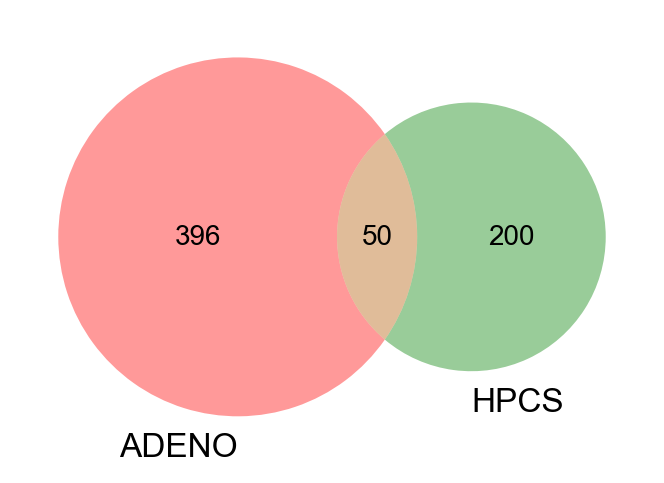

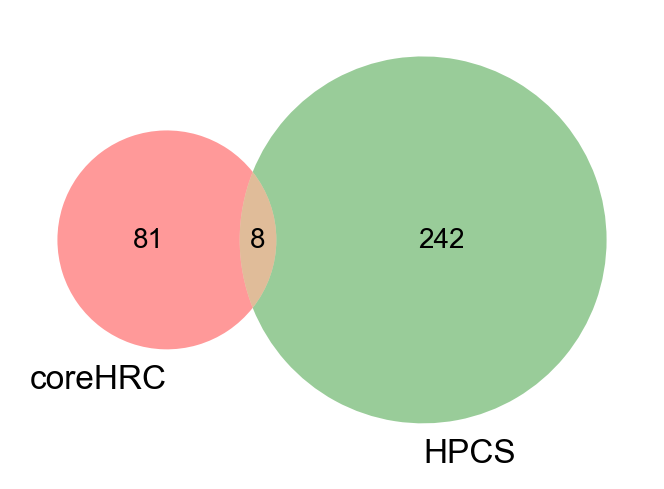

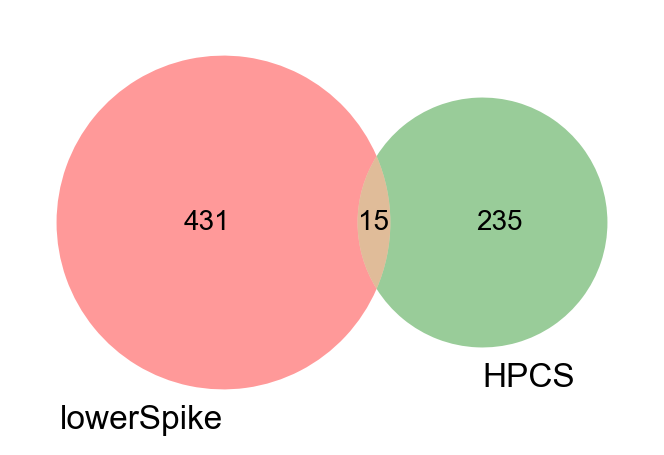

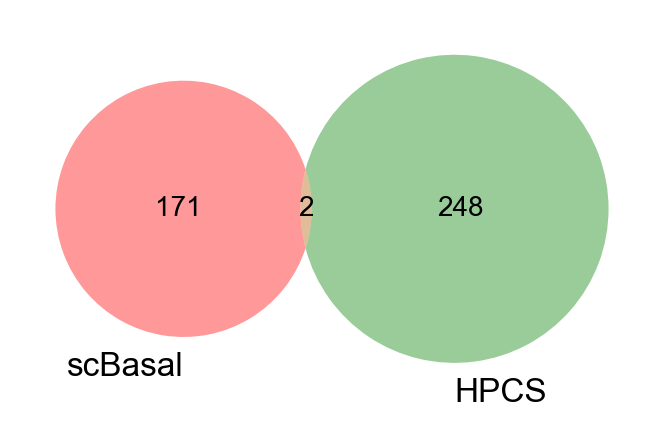

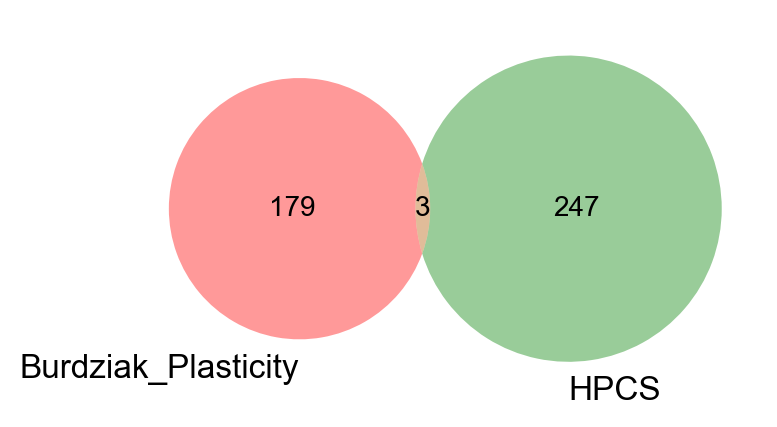

...

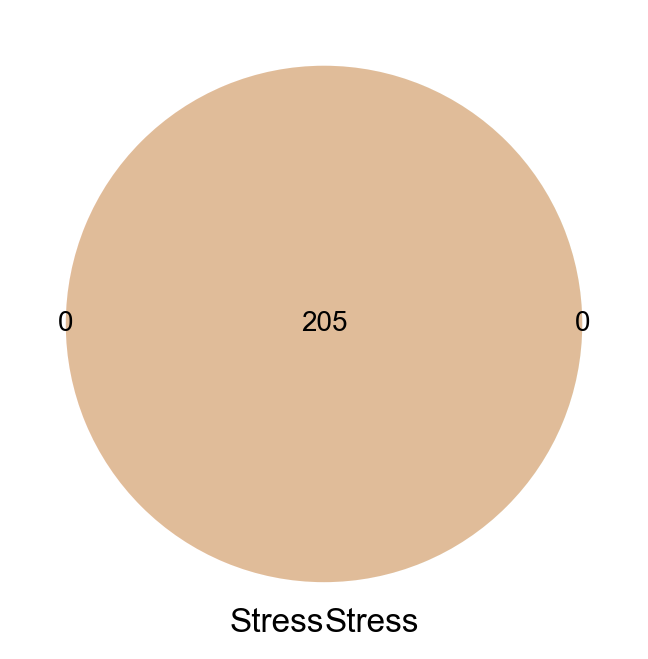

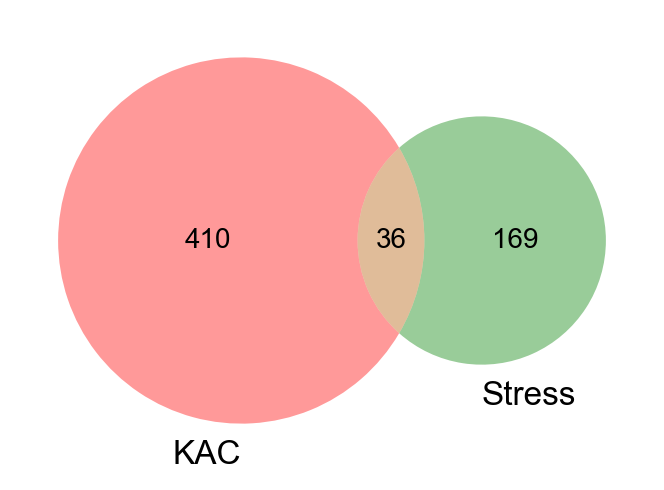

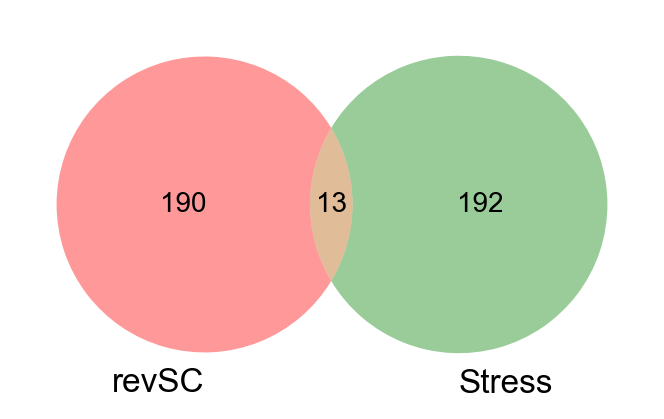

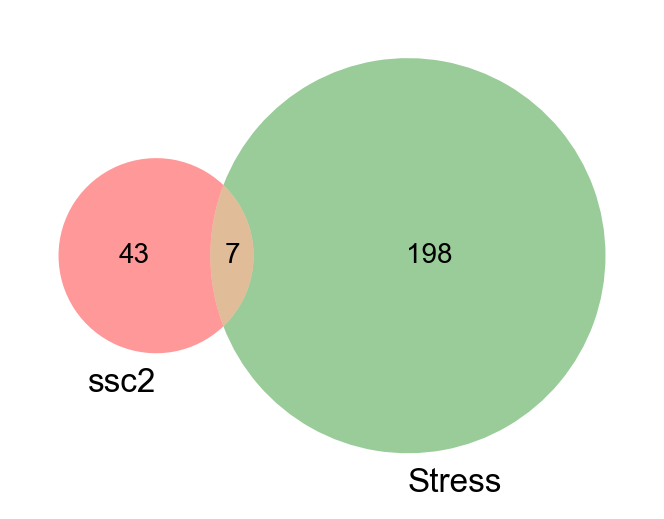

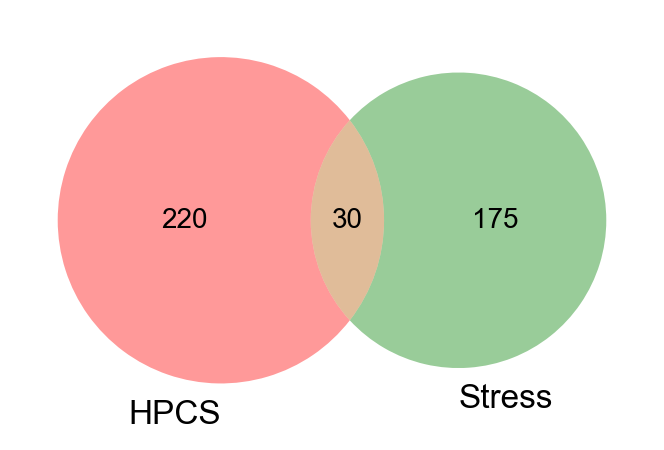

In [60]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

stress = mStressGS.dropna().values.flatten()
hpcs = mhpcs
def makeVenns(mouseGS, otherCS, name, save=False):
    allInters = []
    for mgs in mouseGS: 
        inter = set(mouseGS[mgs].dropna()).intersection(set(otherCS))
        gsNum, hpcsNum, overNum = len(mouseGS[mgs].dropna()), len(otherCS), len(inter)
        
        # Define the subsets
        subsets = (gsNum-overNum,hpcsNum-overNum, overNum)  # (only in set1, only in set2, in both)
        
        # Create a Venn diagram
        venn = venn2(subsets=subsets, set_labels=(mgs, name))
        
        plt.savefig(f"figures/Final/{name}{mgs}_venn.svg")
        # Display the plot
        plt.show()
        allInters.append(inter)
    if(save):
        pd.DataFrame(allInters, index=mouseGS.columns).T.to_csv(f"{save}/{name}_intersections.csv")

makeVenns(mouseGS, hpcs, "HPCS",save=False)
makeVenns(mouseGS, stress, "Stress",save=False)

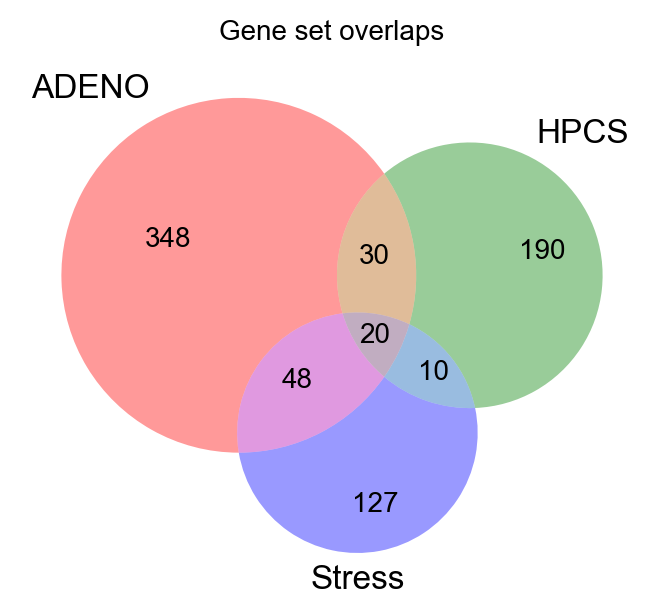

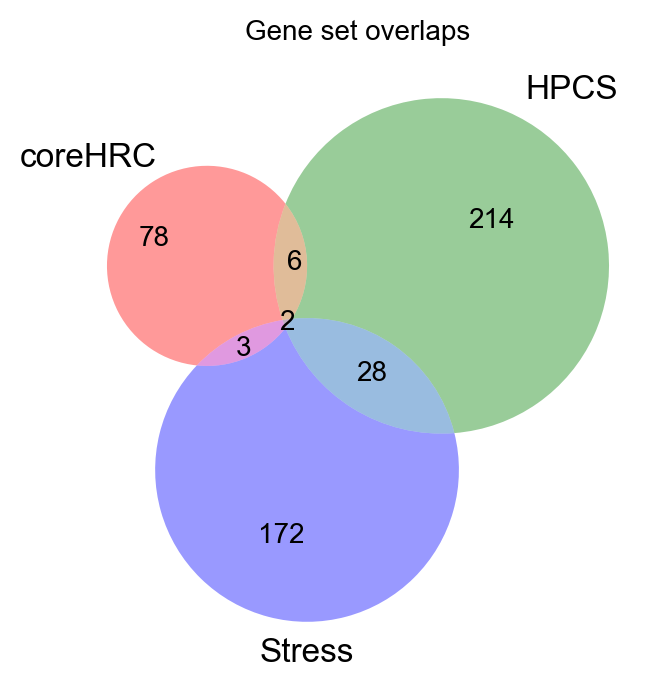

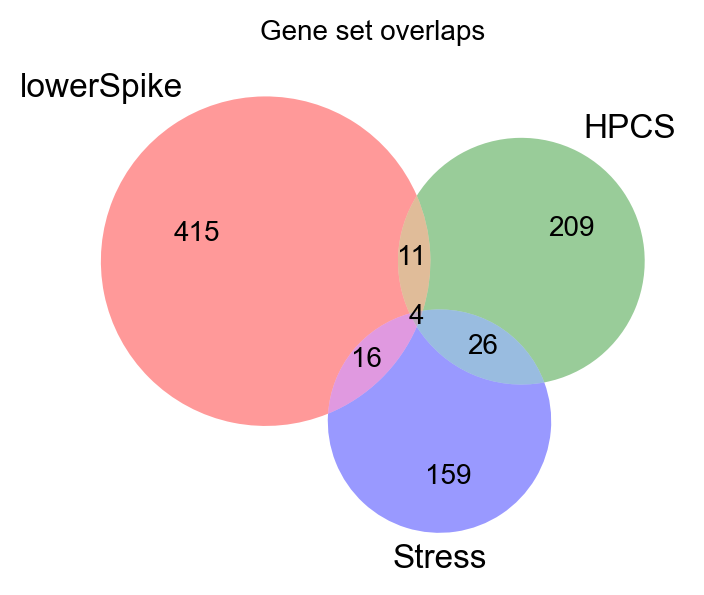

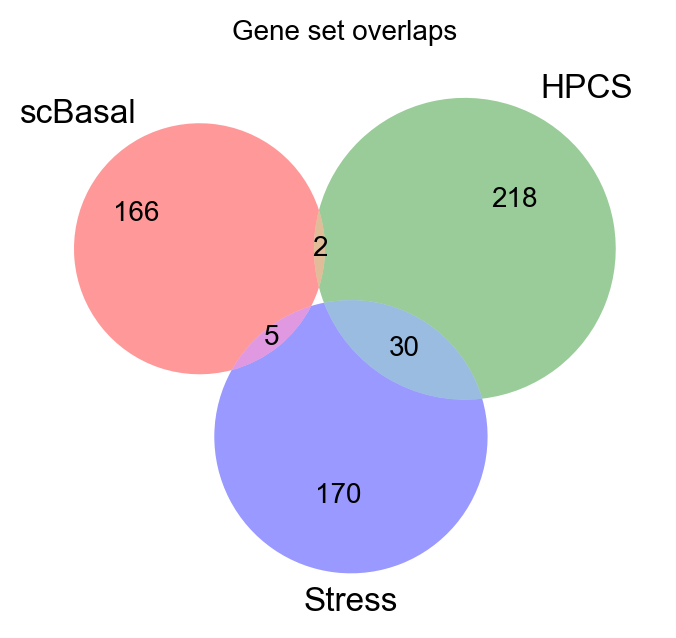

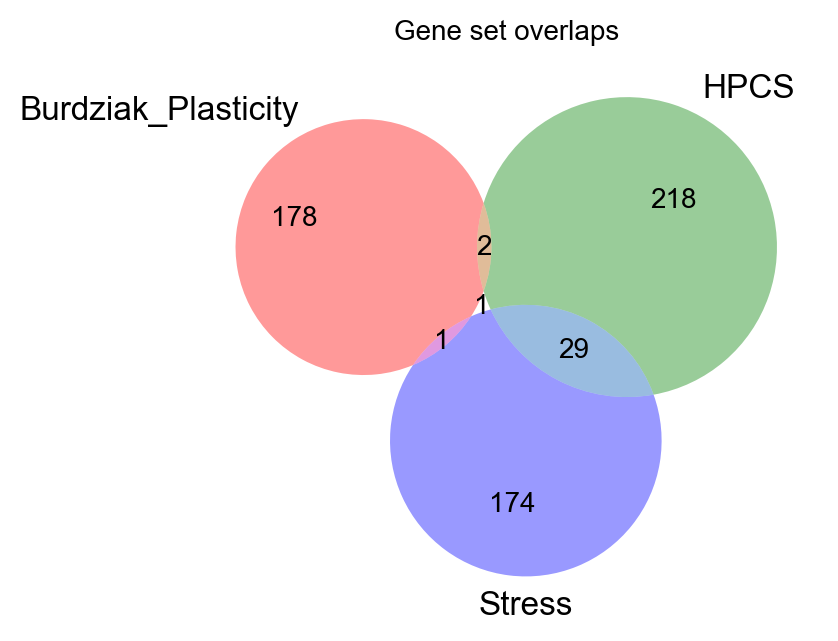

...

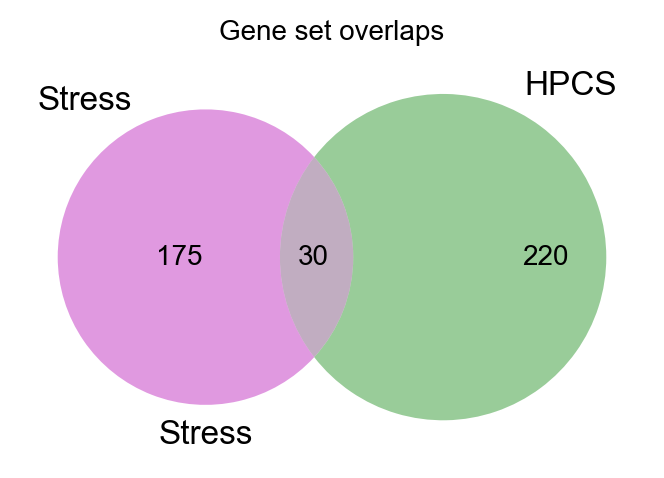

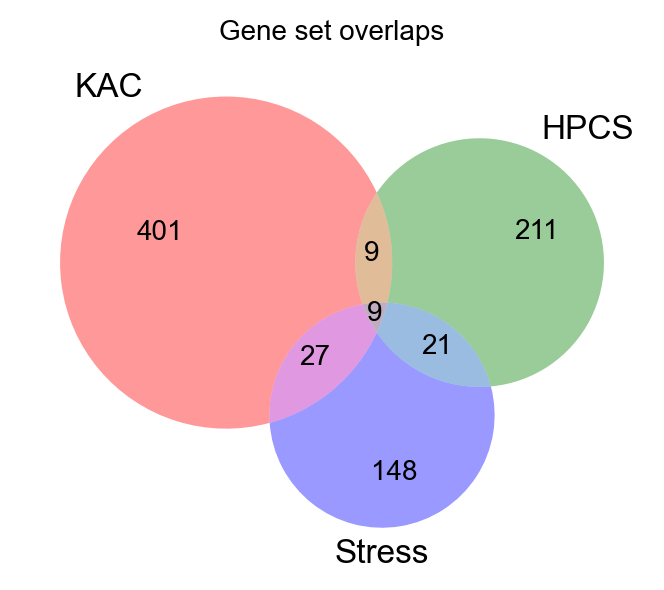

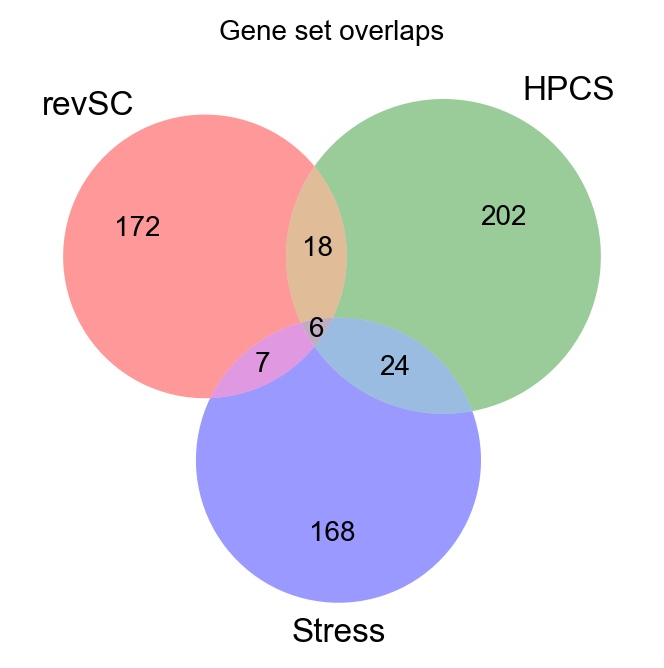

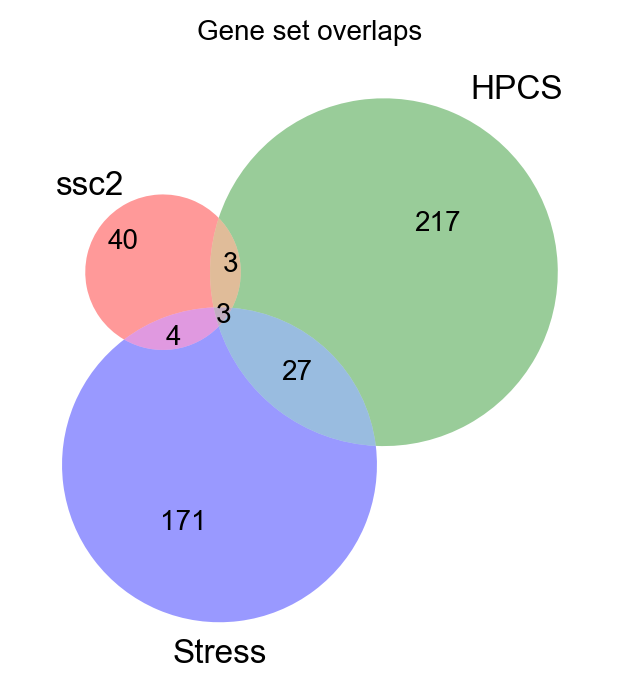

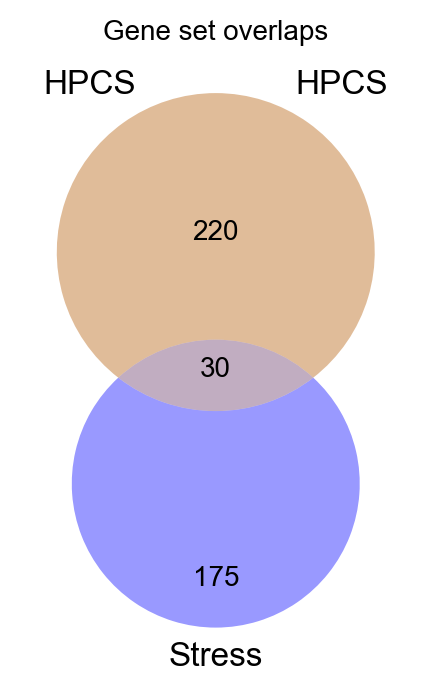

In [61]:
from matplotlib_venn import venn3, venn3_circles 
from matplotlib import pyplot as plt 

save=False
for mgs in mouseGS: 
    allgenes = np.unique(list(mouseGS[mgs].dropna().values)+list(hpcs)+list(stress))
    g1,g2,g12,g3,g13,g23,g123=0,0,0,0,0,0,0
    for g in allgenes:
        inG1 = g in mouseGS[mgs].dropna().values
        inG2 = g in hpcs
        inG3 = g in stress
        if(inG1 and inG2 and inG3):
            g123+=1
        elif(inG1 and inG2 and not inG3):
            g12+=1
        elif(inG1 and not inG2 and inG3):
            g13+=1
        elif(not inG1 and inG2 and inG3):
            g23+=1
        elif(not inG1 and not inG2 and inG3):
            g3+=1
        elif(not inG1 and inG2 and not inG3):
            g2+=1
        elif(inG1 and not inG2 and not inG3):
            g1+=1
    
    # depict venn diagram 
    venn3(subsets=(g1,g2,g12,g3,g13,g23,g123),  
          set_labels=(mgs, 'HPCS', 'Stress')) 
      
    # title of the venn diagram 
    plt.title("Gene set overlaps") 
    if(save):
        plt.savefig(f"{save}/{mgs}_HPCSstress_venn.svg")
    plt.show() 


In [62]:
os.listdir("write/")

['chenProstate_QC.h5ad',
 'chenProstate.h5ad',
 'Ji2020_Skin_QC.h5ad',
 'Ji2020_Skin.h5ad',
 'Gao2021_Breast_QC.h5ad',
 'Dong2020_Prostate_QC.h5ad',
 'Dong2020_Prostate.h5ad',
 'Steele2020_Pancreas_QC.h5ad',
 'Pelka2021_Colorectal_QC.h5ad',
 'Steele2020_Pancreas.h5ad',
 'Pelka2021_Colorectal.h5ad',
 'Yost2019_Skin_QC.h5ad',
 'Pal2021_Breast_QC.h5ad',
 'Pal2021_Breast.h5ad',
 'Yost2019_Skin.h5ad',
 'NYU_breast_QC.h5ad',
 'mouse_Skin_QC.h5ad',
 'NYU_breastBRCA_QC.h5ad',
 'NYU_breastBRCA.h5ad',
 'NYU_breastGIST_QC.h5ad',
 'NYU_breastGIST.h5ad',
 'NYU_breastLIHC1_QC.h5ad',
 'NYU_breastLIHC1.h5ad',
 'NYU_breastOVCA_QC.h5ad',
 'NYU_breastOVCA.h5ad',
 'NYU_breastPDAC1_QC.h5ad',
 'NYU_breastPDAC1.h5ad',
 'NYU_breastUCEC3_QC.h5ad',
 'NYU_breastUCEC3.h5ad',
 'mouse_Skin.h5ad',
 'mouseColon11302_QC.h5ad',
 'mouseColon11302.h5ad',
 'Gao2021_Breast.h5ad',
 'hpcsCorr',
 '.ipynb_checkpoints',
 'mouse_Breast_QC.h5ad',
 'mouse_Breast.h5ad',
 'mouse_Skin_GSE261766_QC.h5ad',
 'mouse_Breast4T1_QC.h5ad',
 

In [34]:
hAdataFiles = [
"Pal2021_Breast.h5ad",
"Pelka2021_Colorectal.h5ad",
"Data_Chen2020_Head-and-Neck.h5ad",
"Kürten2021_Head-and-Neck.h5ad",

'luadBischoff.h5ad',
'luadDost.h5ad',
'luadKim.h5ad',
'luadMDA.h5ad',

"Qian2020_Ovarian.h5ad",

"Dong2020_Prostate.h5ad",
"Steele2020_Pancreas.h5ad",

"Ji2020_Skin.h5ad",

"Data_Caron2020_Hematologic.h5ad",
"Liu2021_Hematologic.h5ad",
#"chenProstate.h5ad",
#"Yost2019_Skin.h5ad",
#"Gao2021_Breast.h5ad"
]
mAdataFiles = [
#"mouse_Skin_GSE261766_CA.h5ad",
#"mouse_Skin.h5ad",
#"mouse_Breast.h5ad",
#"mouse_Breast4T1.h5ad",
#"mouse_BreastBRCA1.h5ad",
#"mouse_BreastNEU.h5ad",
"mouse_BreastPyMT.h5ad",
"mouseColon11302.h5ad",
"mouse_Prostate.h5ad",
"mouse_Pancreas_Burdziak.h5ad",
"mouse_Pancreas_TT.h5ad",
"mouse_Skin_GSE261766_Pap.h5ad",
]

In [35]:
manyGS = ['mAllTirosh','mAllYeni',
          'hAllTirosh','hAllYeni']

hColNames = ['BC', 'CRC',  'HnN_C', 'HnN_K', 'LUAD_B', 'LUAD_D', 'LUAD_K', 'LUAD_M', 'Ovar', 'PCa','PDAC', 'SCC', 'ALL','MM']
mColNames = ['BC', 'CRC', 'PCa', 'PDAC_B', 'PDAC_T', 'SCC']

colNames = [mColNames, mColNames, hColNames, hColNames]

In [36]:
dict(zip(hColNames,hAdataFiles))

{'BC': 'Pal2021_Breast.h5ad',
 'CRC': 'Pelka2021_Colorectal.h5ad',
 'HnN_C': 'Data_Chen2020_Head-and-Neck.h5ad',
 'HnN_K': 'Kürten2021_Head-and-Neck.h5ad',
 'LUAD_B': 'luadBischoff.h5ad',
 'LUAD_D': 'luadDost.h5ad',
 'LUAD_K': 'luadKim.h5ad',
 'LUAD_M': 'luadMDA.h5ad',
 'Ovar': 'Qian2020_Ovarian.h5ad',
 'PCa': 'Dong2020_Prostate.h5ad',
 'PDAC': 'Steele2020_Pancreas.h5ad',
 'SCC': 'Ji2020_Skin.h5ad',
 'ALL': 'Data_Caron2020_Hematologic.h5ad',
 'MM': 'Liu2021_Hematologic.h5ad'}

In [37]:
dict(zip(mColNames,mAdataFiles))

{'BC': 'mouse_BreastPyMT.h5ad',
 'CRC': 'mouseColon11302.h5ad',
 'PCa': 'mouse_Prostate.h5ad',
 'PDAC_B': 'mouse_Pancreas_Burdziak.h5ad',
 'PDAC_T': 'mouse_Pancreas_TT.h5ad',
 'SCC': 'mouse_Skin_GSE261766_Pap.h5ad'}

In [38]:
infoDict = {
    "mBreast":{"file":["mouse_BreastPyMT.h5ad"], "gs":mStressGS, "hpcs":mhpcs},
    "mColon":{"file":["mouseColon11302.h5ad"], "gs":mColonGS, "hpcs":mhpcs},
    "mProstate":{"file":["mouse_Prostate.h5ad"], "gs":mProstGS, "hpcs":mhpcs},
    "mPancreas":{"file":["mouse_Pancreas_TT.h5ad"], "gs":mPancrGS, "hpcs":mhpcs},
    "mPancreasB":{"file":["mouse_Pancreas_Burdziak.h5ad"], "gs":mPancrBGS, "hpcs":mhpcs},
    "mSkin":{"file":["mouse_Skin_GSE261766_Pap.h5ad"], "gs":mSkinGS, "hpcs":mhpcs},

    "mAllTirosh":{"file":mAdataFiles,"gs":mTiroshGS, "hpcs":mhpcs},
    "mAllYeni":{"file":mAdataFiles,"gs":mMultiGS, "hpcs":mhpcs},
    
    "hBreast":{"file":["Pal2021_Breast.h5ad"], "gs":hStressGS, "hpcs":hhpcs},
    "hColon":{"file":["Pelka2021_Colorectal.h5ad"], "gs":hColonGS, "hpcs":hhpcs},
    "hSkin":{"file":["Ji2020_Skin.h5ad"], "gs":hSkinGS, "hpcs":hhpcs},
    "hProstate":{"file":["Dong2020_Prostate.h5ad"], "gs":hProstGS, "hpcs":hhpcs},
    "hPancreas":{"file":["Steele2020_Pancreas.h5ad"], "gs":hPancrGS, "hpcs":hhpcs},

    "hHnN_K":{"file":["Kürten2021_Head-and-Neck.h5ad"],    "gs":hStressGS, "hpcs":hhpcs},
    "hHnN_C":{"file":["Data_Chen2020_Head-and-Neck.h5ad"], "gs":hStressGS, "hpcs":hhpcs},
    "hOvar":{"file":["Qian2020_Ovarian.h5ad"],             "gs":hStressGS, "hpcs":hhpcs},
    
    "hLungM":{"file":["luadMDA.h5ad"], "gs":hKac, "hpcs":hhpcs},
    "hLungK":{"file":["luadKim.h5ad"], "gs":hKac, "hpcs":hhpcs},
    "hLungB":{"file":["luadBischoff.h5ad"], "gs":hKac, "hpcs":hhpcs},
    "hLungD":{"file":["luadDost.h5ad"], "gs":hKac, "hpcs":hhpcs},
        
    "hcALL_C":{"file":["Data_Caron2020_Hematologic.h5ad"], "gs":hStressGS, "hpcs":hhpcs},
    "hMM_L":{"file":["Liu2021_Hematologic.h5ad"],        "gs":hStressGS, "hpcs":hhpcs},
    
    "hAllTirosh":{"file":hAdataFiles,"gs":hTiroshGS, "hpcs":hhpcs},
    "hAllYeni":{"file":hAdataFiles,"gs":hMultiGS, "hpcs":hhpcs},
}

In [39]:
def plotCorr(name, corrScorePear, corrScoreSign, corrName="HPCS", figsize=(5,5),save=False):
    fig, ax = plt.subplots(figsize=figsize) 
    plt.grid(False)
    sns.heatmap(corrScorePear, cmap="bwr", xticklabels=True, ax=ax, vmax=1, vmin=-1, square=True, linewidths=0.1, cbar=False)
    
    for (i, j), significant in np.ndenumerate(corrScoreSign):
        if significant < 0.001:
            plt.text(j + 0.5, i + 0.5, "●", color='black', ha='center', va='center', fontsize=12)
        elif significant < 0.05:
            plt.text(j + 0.5, i + 0.5, 'o', color='black', ha='center', va='center', fontsize=12)
    
    ax.set_title(f"Pearson Correlation of {corrName} score with other Cell State Scores")
    ax.tick_params(axis='y', labelrotation=0)
    fig.text(1, 0.4, f"P-Value\no < 0.05\n● < 0.001")
    fig.tight_layout()
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}_pearCorr{corrName}vO.svg")

In [40]:
from matplotlib import cm, colors

def plotHeatmap(data, name, title, xlabel, ylabel, save=False):
    fig, axs = plt.subplots(nrows=1, ncols=len(data[0])+1, figsize=(6,2)) 
    plt.grid(False)
    vmax, vmin = np.max(data), np.min(data)
    for i,ax in enumerate(axs):
        if(i >= len(data[0])):
            ax.axis("off")
            break
        sns.heatmap(data[:,i].reshape(2,1), cmap="bwr", xticklabels=True, ax=ax, square=True, linewidths=0.1, vmax=vmax, vmin=vmin, cbar=False)#cbar_kws={"shrink": 0.5})
        ax.set_xticklabels(xlabel)
        ax.set_yticklabels([ylabel[i],"Other"])
        #ax.set_ylabel(ylabel)
    
    norm = colors.Normalize(vmin, vmax)
    fig.suptitle(f"{title} Expression")
    fig.colorbar(cm.ScalarMappable(norm=norm, cmap=plt.colormaps["bwr"]), ax=ax)
    fig.tight_layout()
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}_{title}avgExpVo.svg")

In [41]:
def plotScatter(df, xLabel, yLabel, name, save=False):
    xVal, yVal = adata.obs[xLabel].values, adata.obs[yLabel].values
    m, b, r_value, p_value, std_err = stats.linregress(xVal, yVal)
    
    fig, ax = plt.subplots()
    ax.grid(False)
    ax.scatter(xVal,yVal)
    ax.plot(xVal, m*xVal + b, c="red")
    ax.annotate(f"r^2: {r_value**2:.2f}", xy=(-0.05,np.max(yVal)*0.95))
    ax.annotate(f"pVal: {p_value:.2f}", xy=(-0.05,np.max(yVal)*0.9))

    ax.set_xlabel(xLabel)
    ax.set_ylabel(yLabel)
    ax.set_title(name)
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}_{xLabel}{yLabel}_scatter.svg")

In [42]:
def plotBoxPlot(dataDF, label, geneExp, name, save=False):
    slcPos = adata.obs[label].values[geneExp]
    slcNeg = adata.obs[label].values[np.logical_not(geneExp)]

    # Create a figure and axis
    fig, ax = plt.subplots()
    ax.grid(False)
    # Create box plots
    box1 = ax.violinplot(slcPos, positions=[1], showmeans=True, widths=0.6)
    box2 = ax.violinplot(slcNeg, positions=[2], showmeans=True, widths=0.6)
    
    # Perform a t-test to get the p-value
    t_stat, p_val = stats.ttest_ind(slcPos, slcNeg)
    
    # Add p-value bracket and stars to the plot
    x1, x2 = 1, 2
    y, h, col = max(np.max(slcPos), np.max(slcNeg)), 0.1, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    ax.text((x1+x2)*.5, y+h-0.1, f'{p_val:.3e}', ha='center', va='bottom', color=col)
    
    # Add stars based on p-value significance
    if p_val < 0.001:
        stars = '***'
    elif p_val < 0.01:
        stars = '**'
    elif p_val < 0.05:
        stars = '*'
    else:
        stars = 'ns'  # not significant
    
    ax.text((x1+x2)*.5, y+h, stars, ha='center', va='bottom', color=col)
    
    # Add p-value text to the plot
    #plt.text(1.5, max(np.max(slcPos), np.max(slcNeg)), f'p-value: {p_val:.3e}', ha='center')
    
    # Set x-axis labels
    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Slc4a11+', 'Slc4a11-'])
    
    # Set title and labels
    ax.set_title(name)
    ax.set_ylabel(f'{label} Score')
    
    # Show the plot
    plt.show()
    if(save):
        fig.savefig(f"{save}/{name}{label}_boxSlc4a11.svg")
    

In [43]:
#alphebatize...
infoLabels = ['mColon','mSkin','mProstate','mPancreas','mPancreasB',#,"mBreast",,"hBreast"
              'hColon','hSkin','hProstate','hPancreas','hLungM','hLungK','hLungB','hLungD',"hHnN_K","hHnN_C","hOvar","hcALL_C", "hMM_L"]

mColon


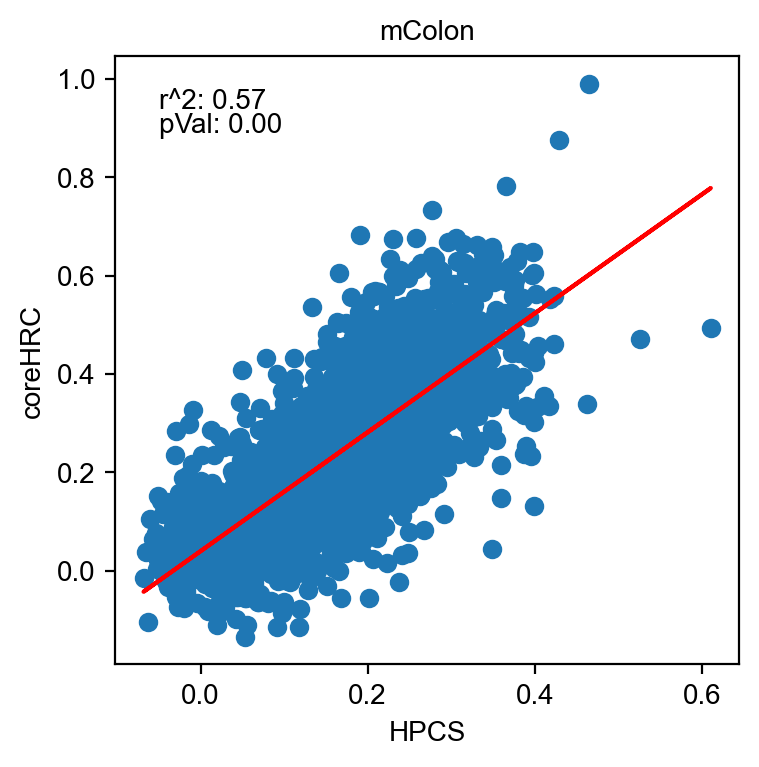

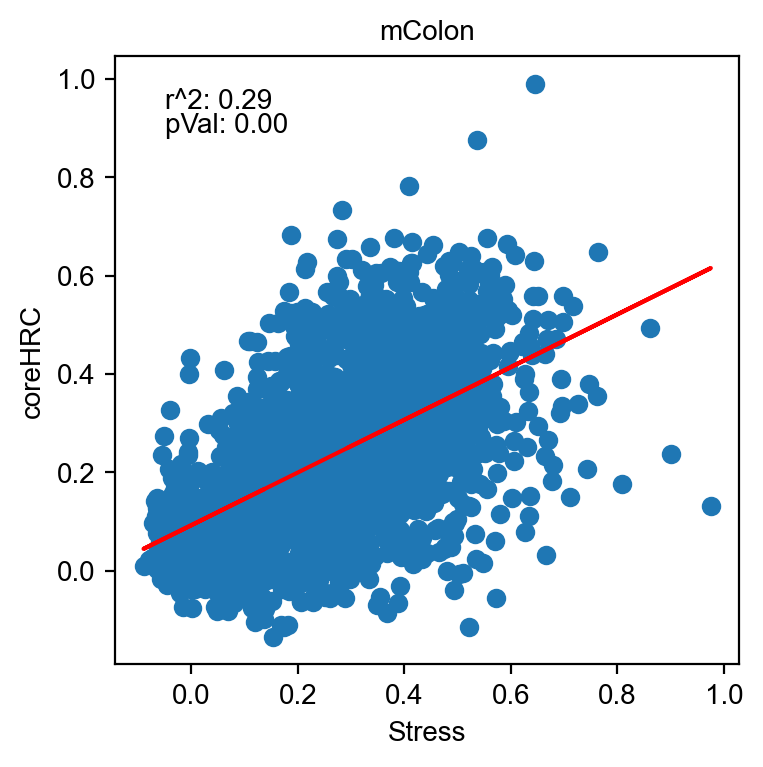

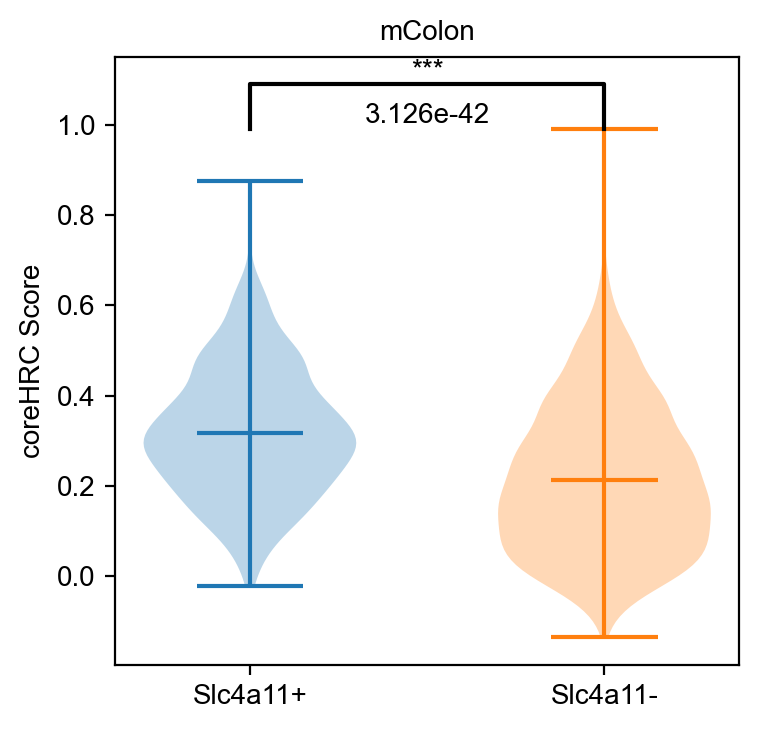

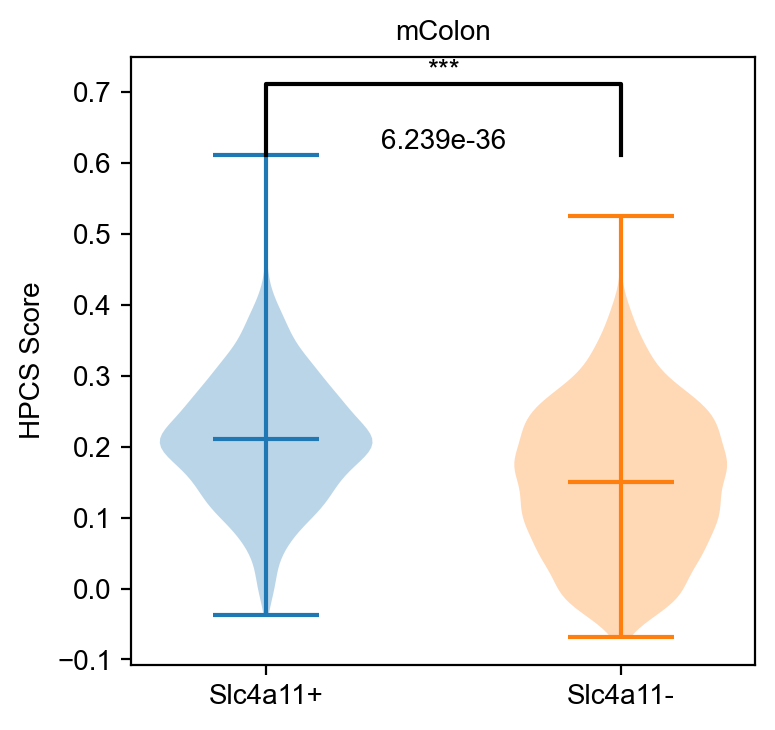

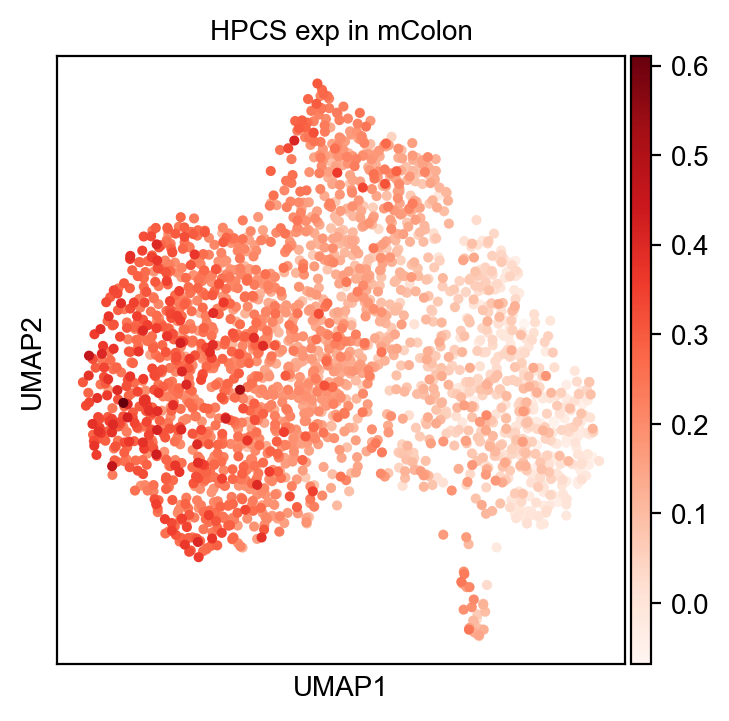

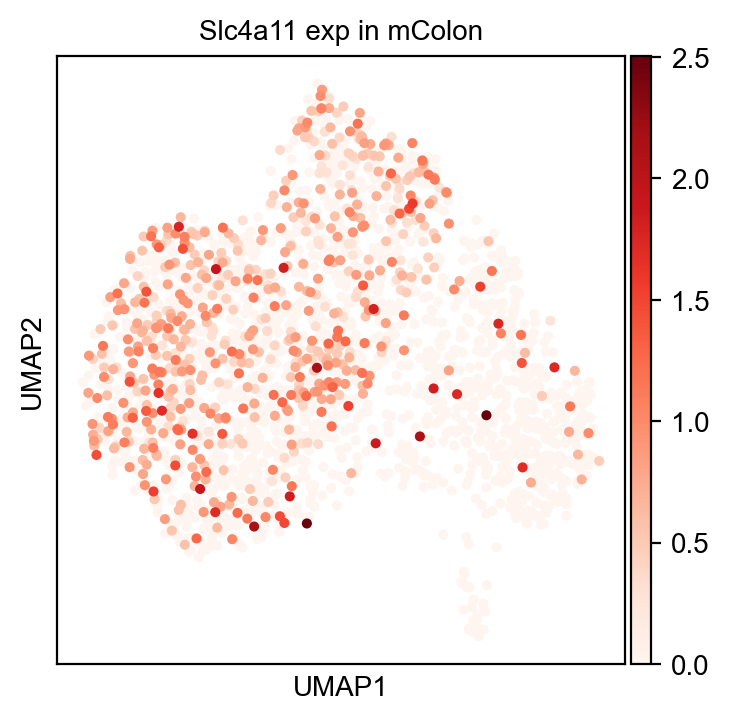

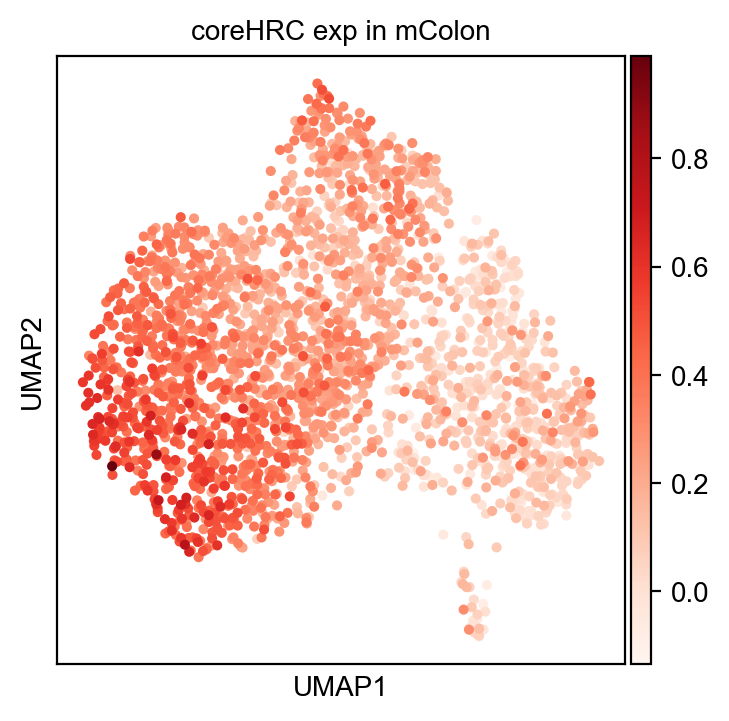

mSkin


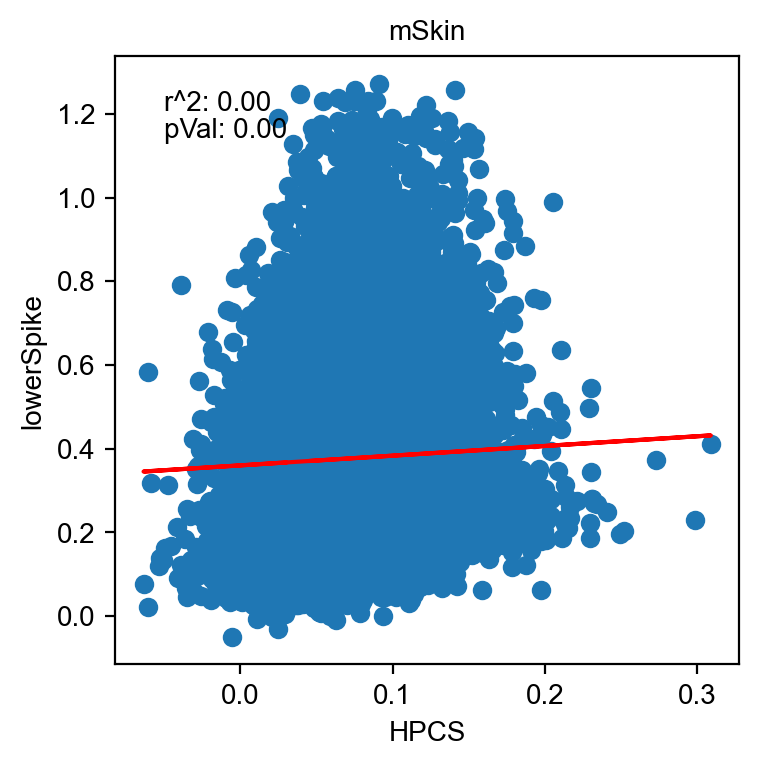

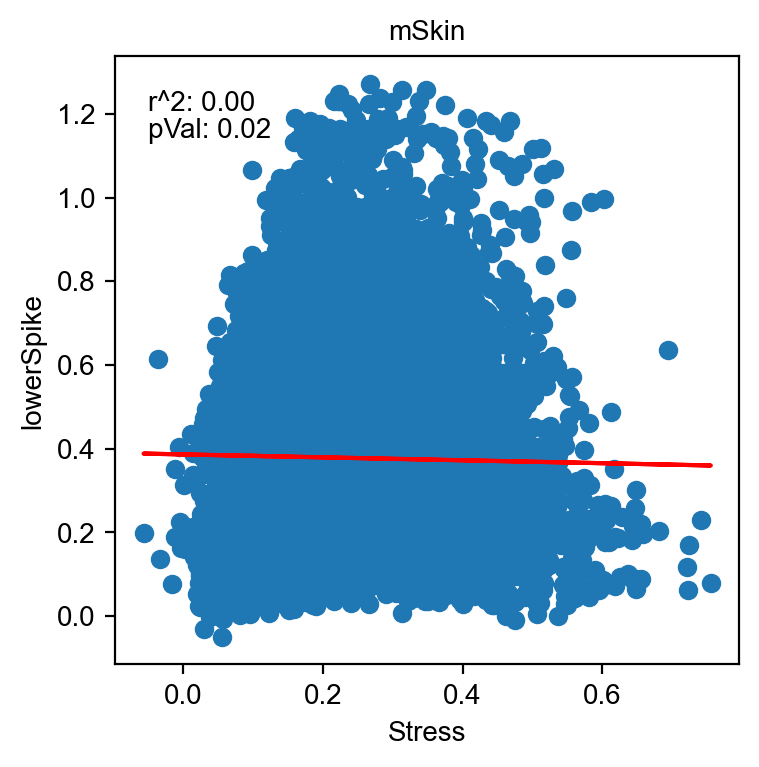

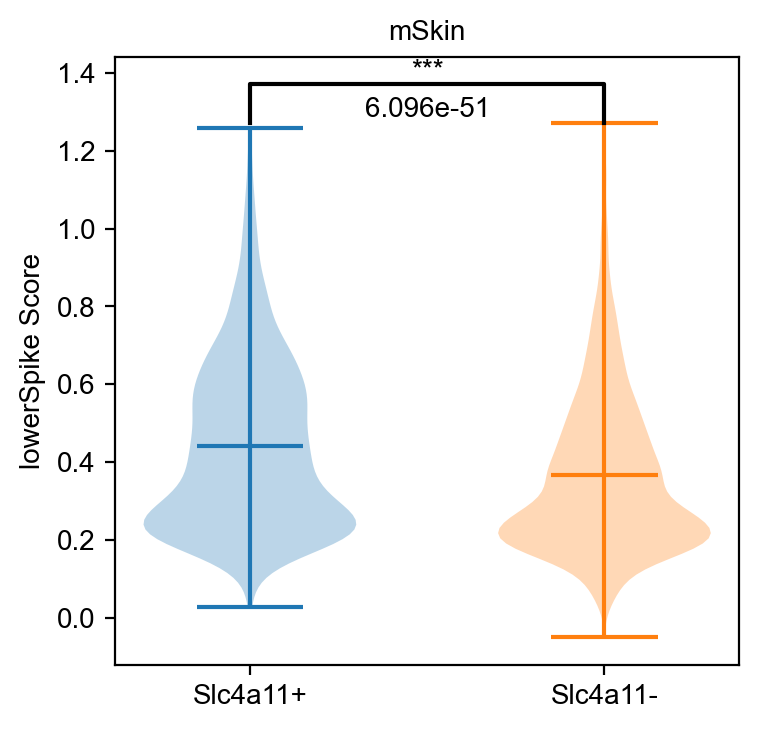

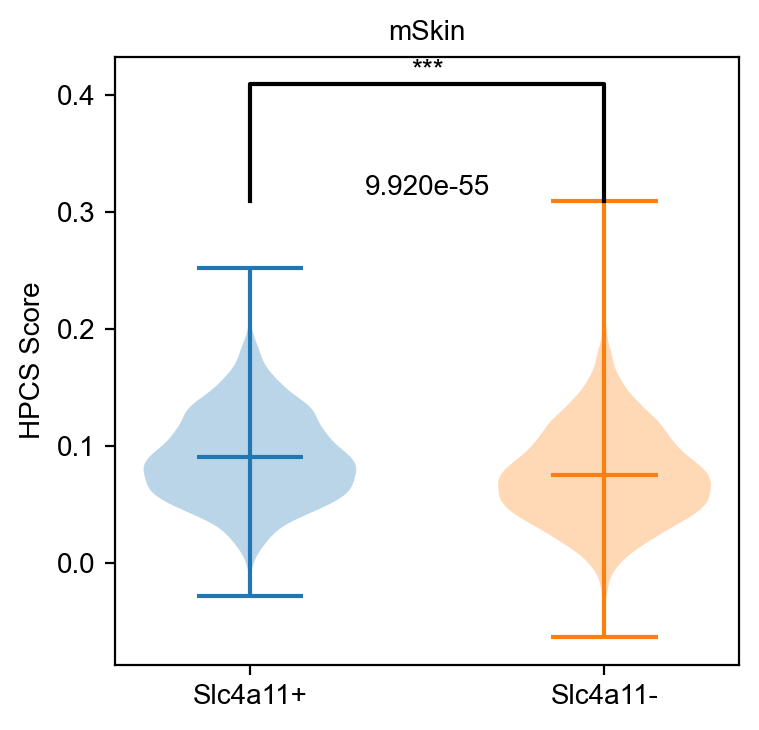

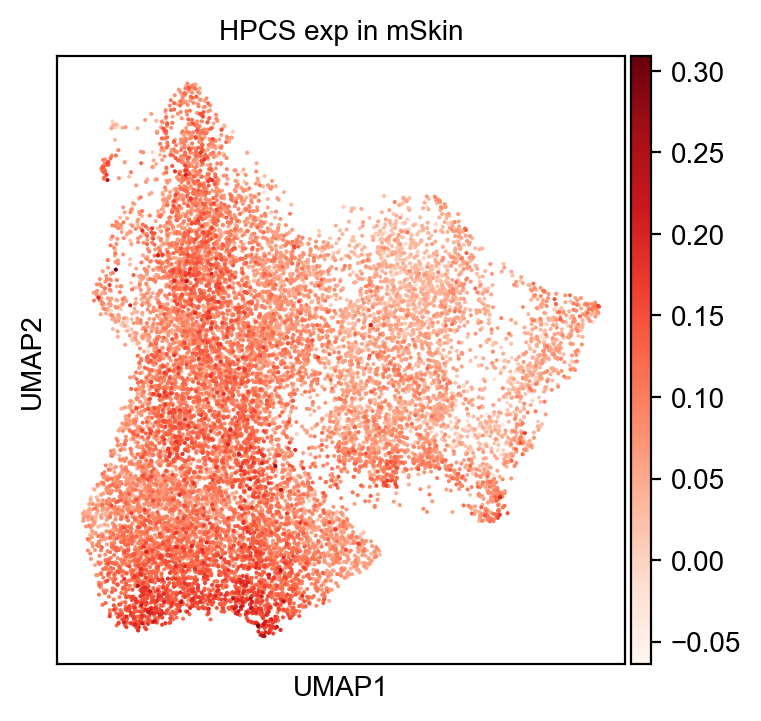

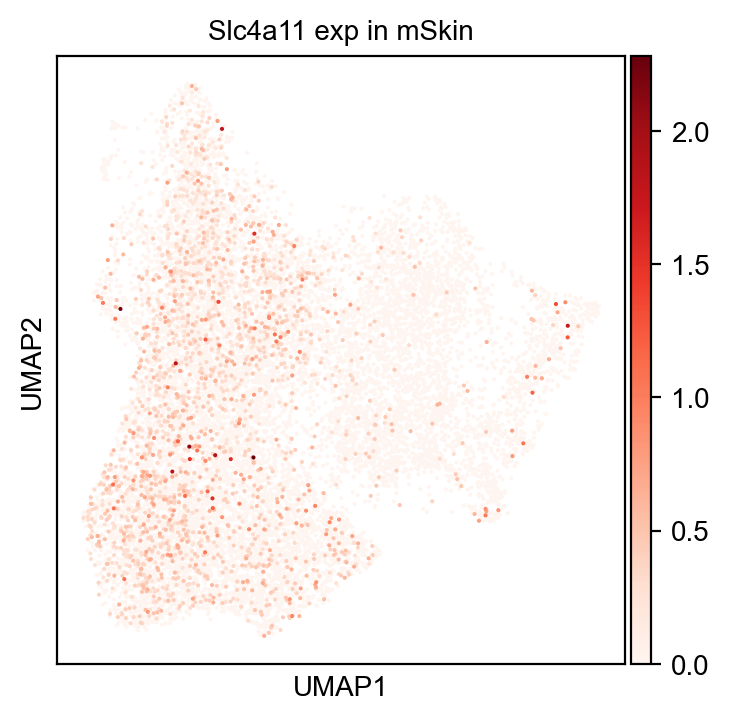

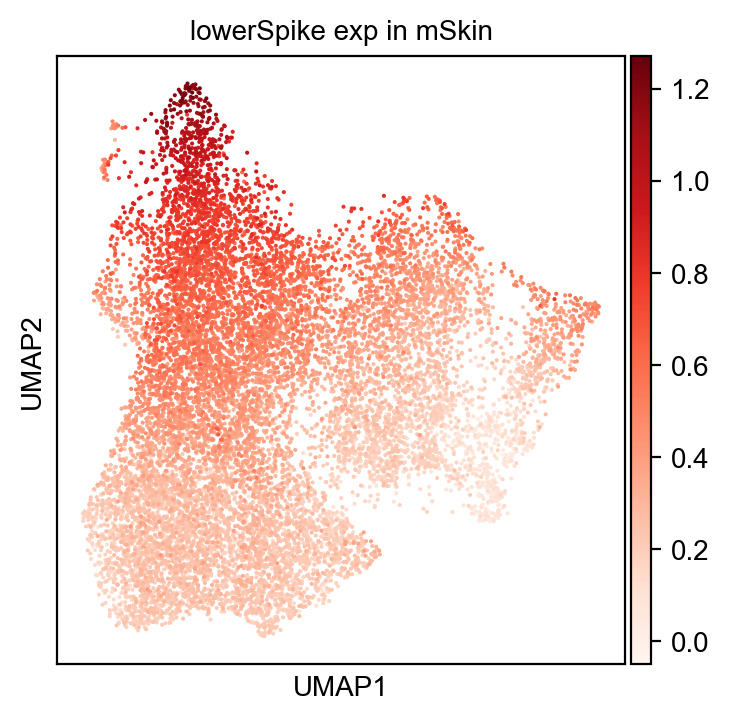

mProstate


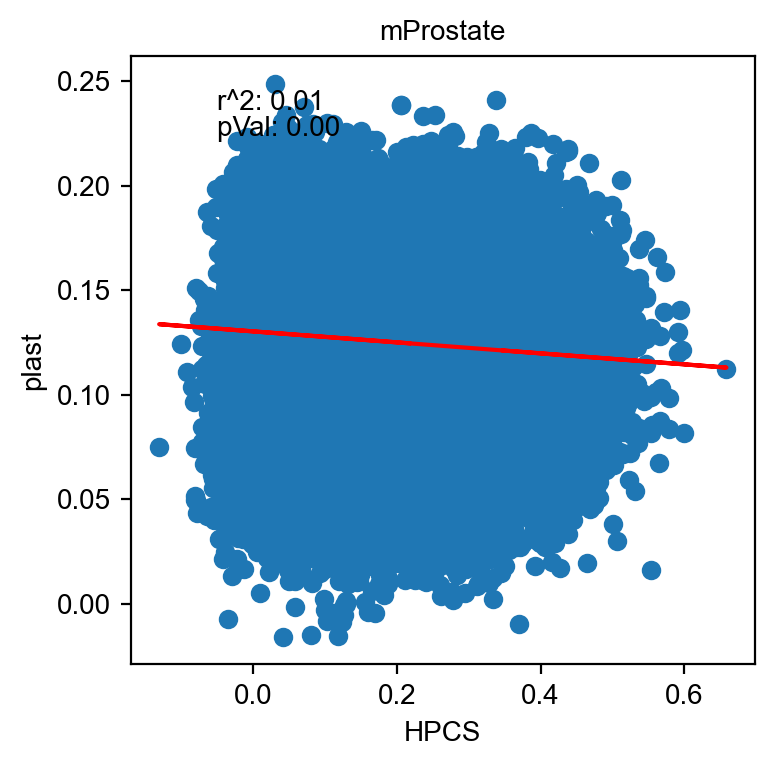

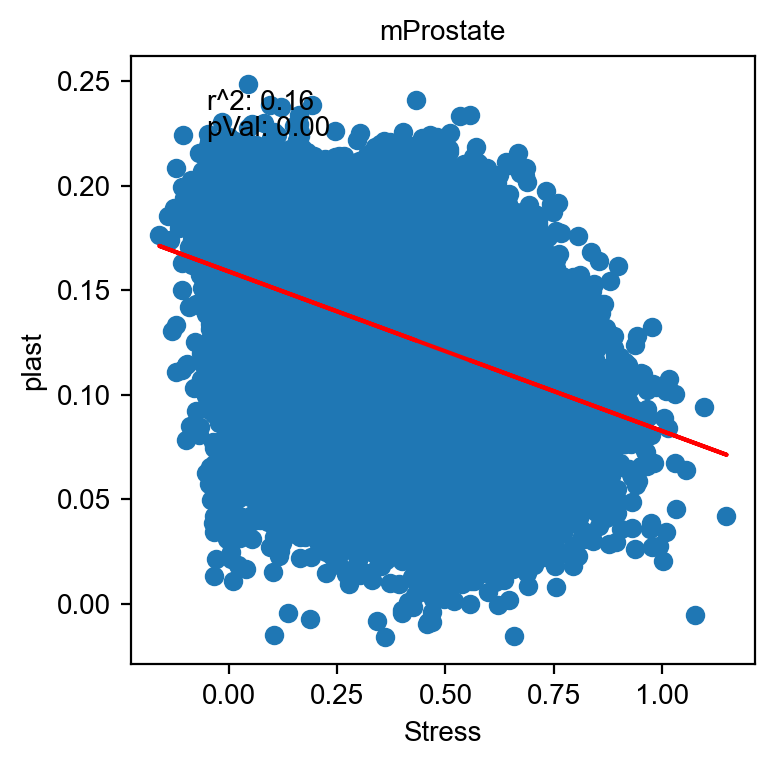

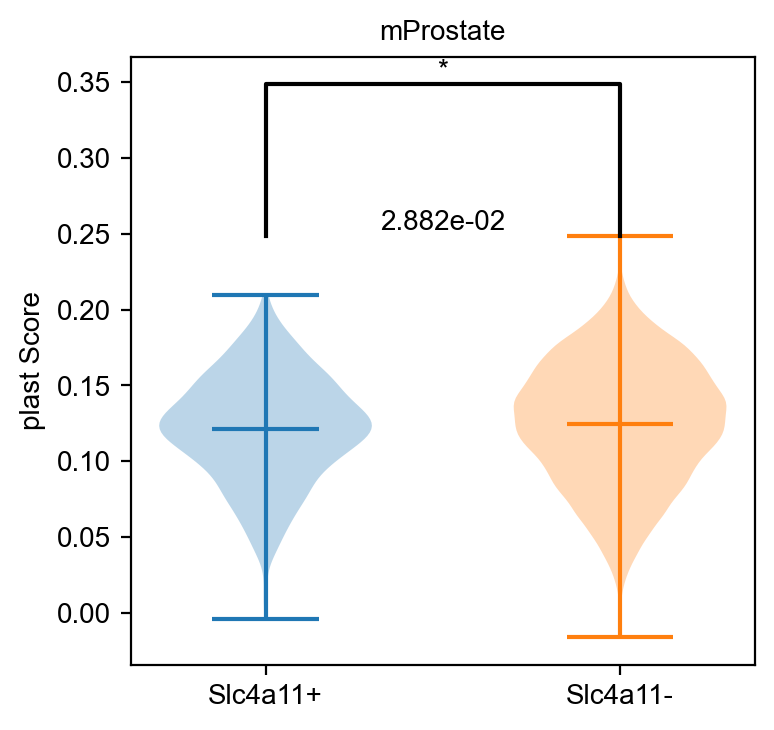

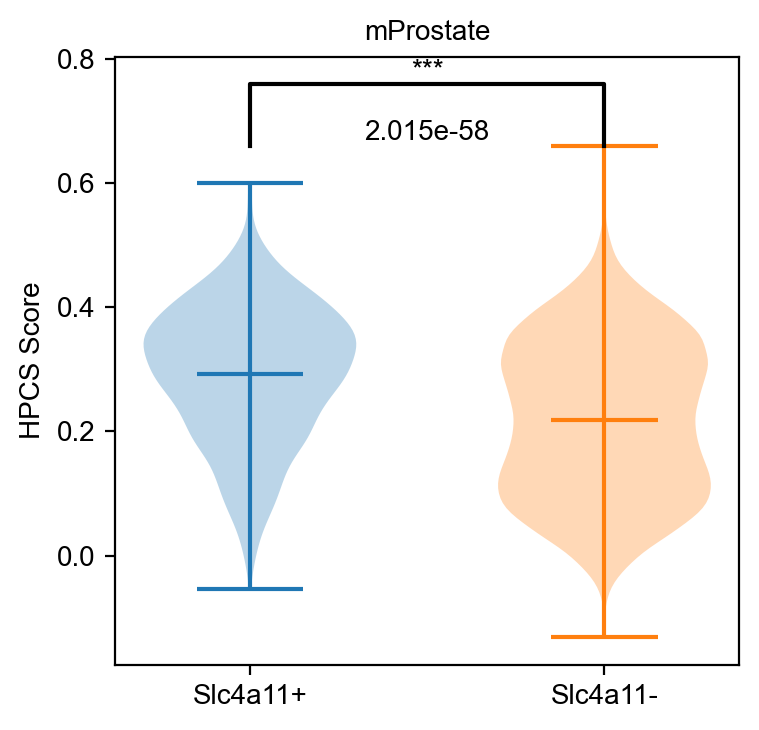

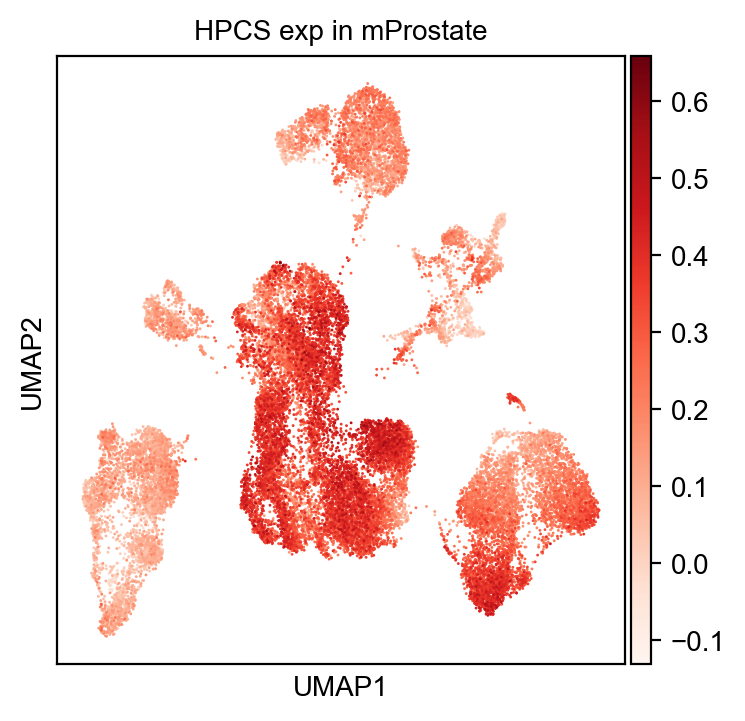

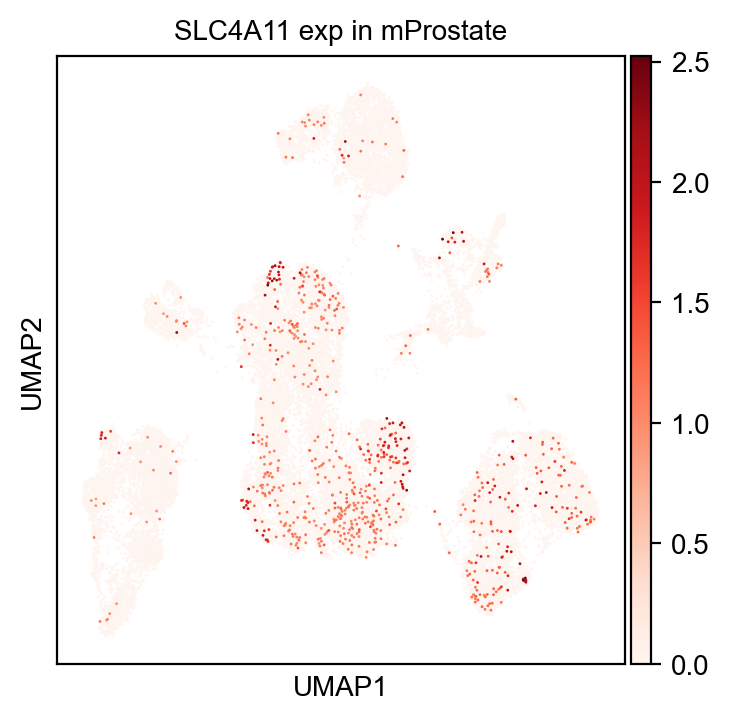

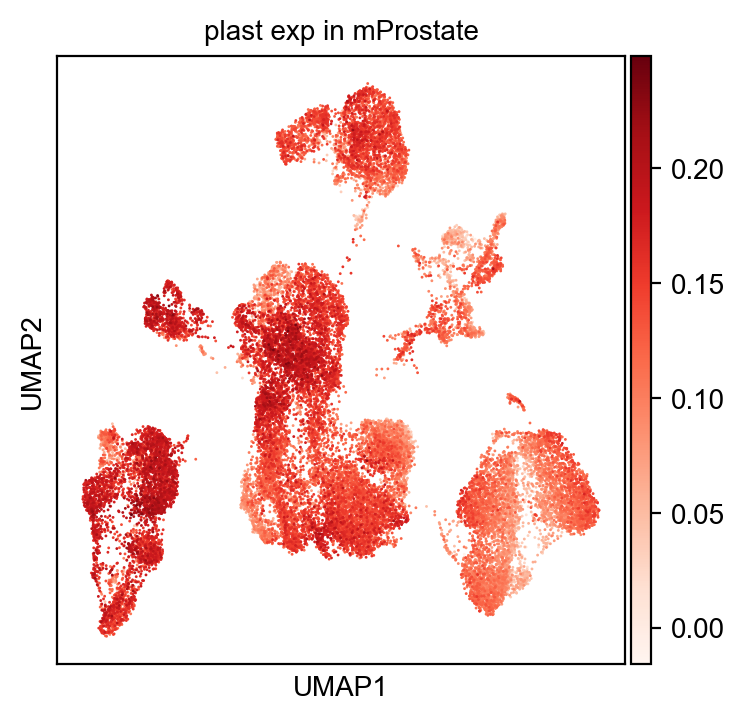

mPancreas


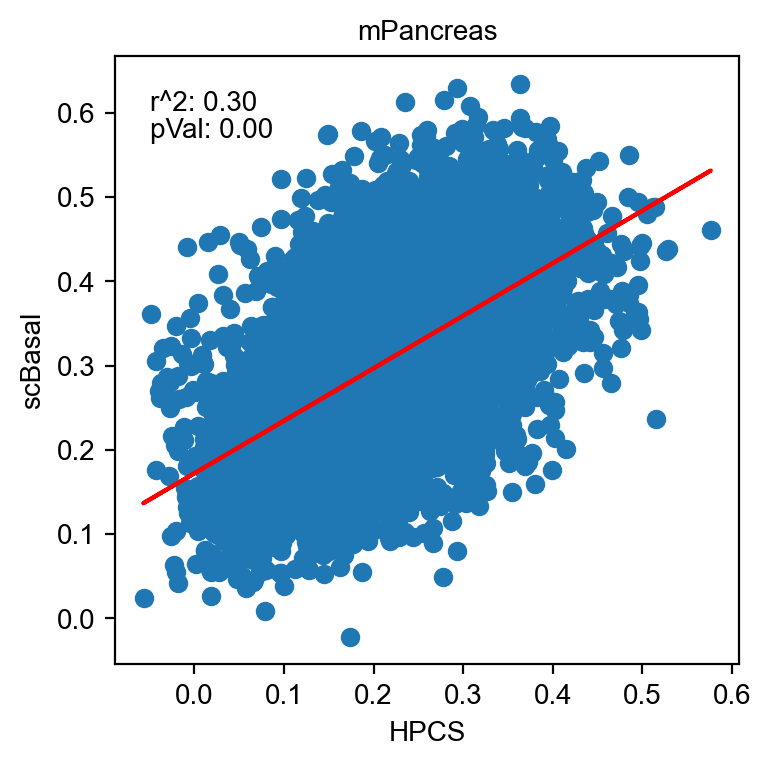

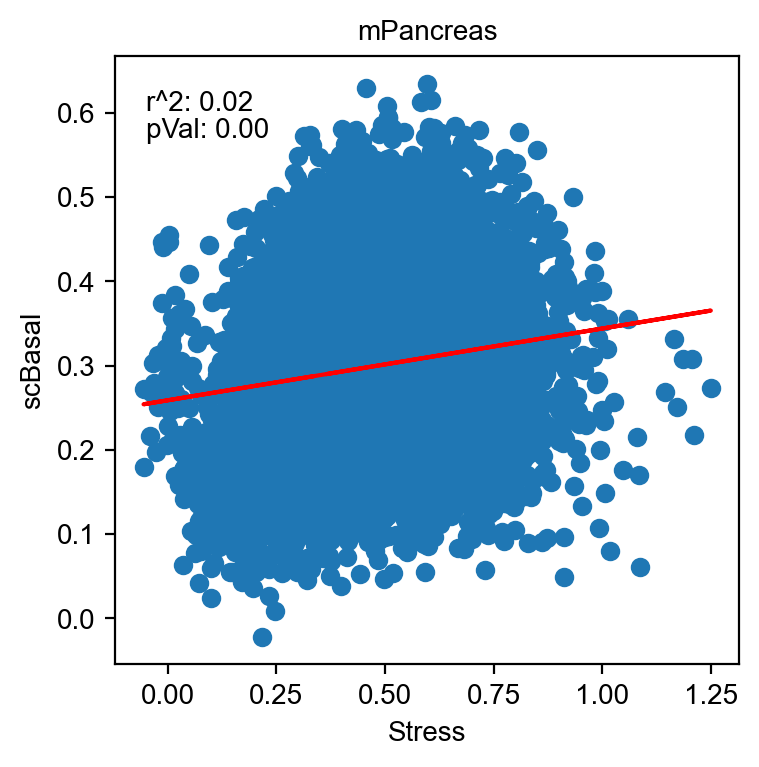

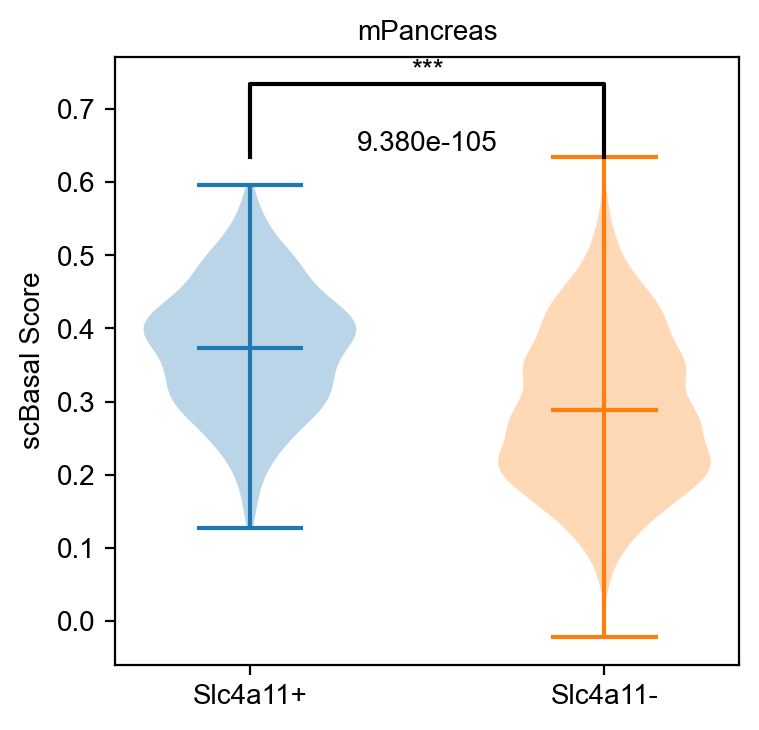

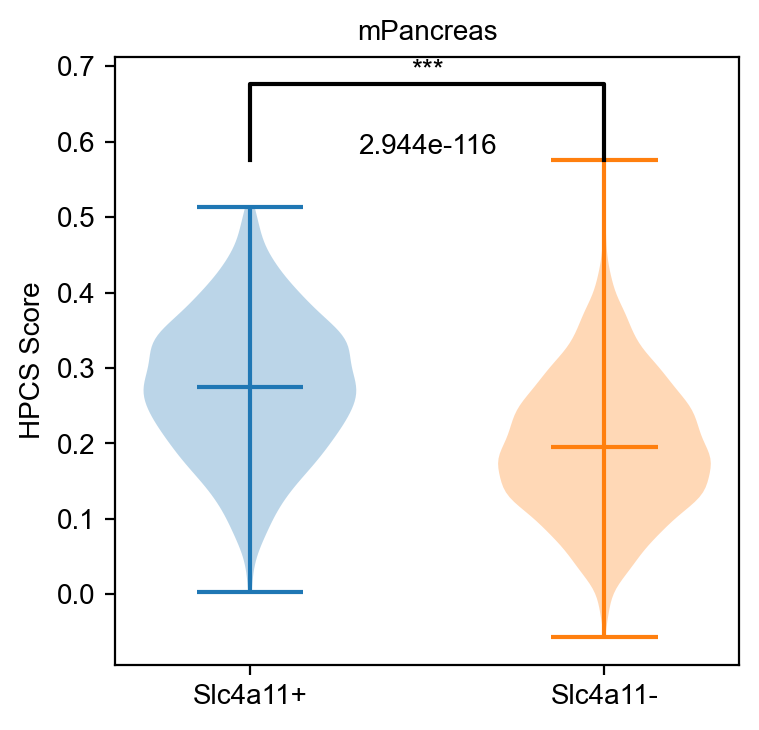

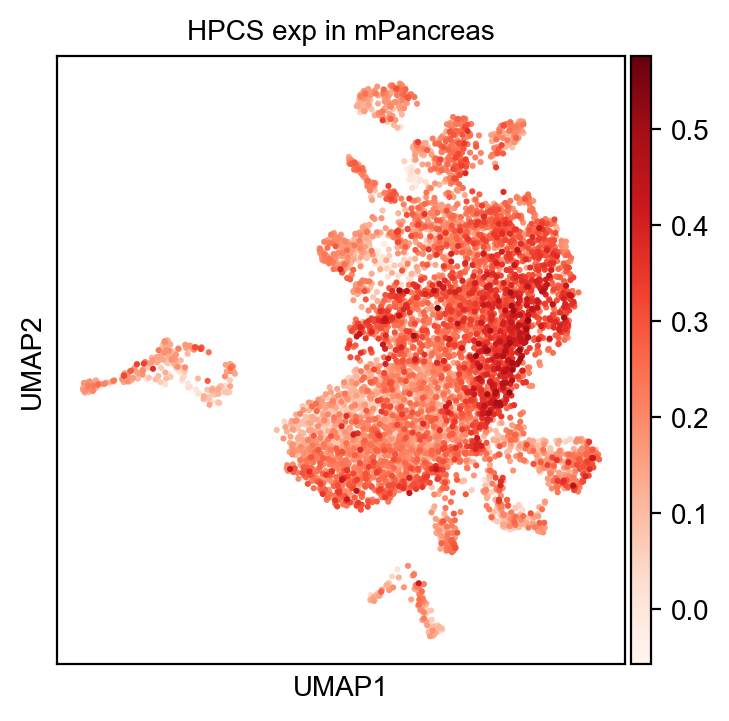

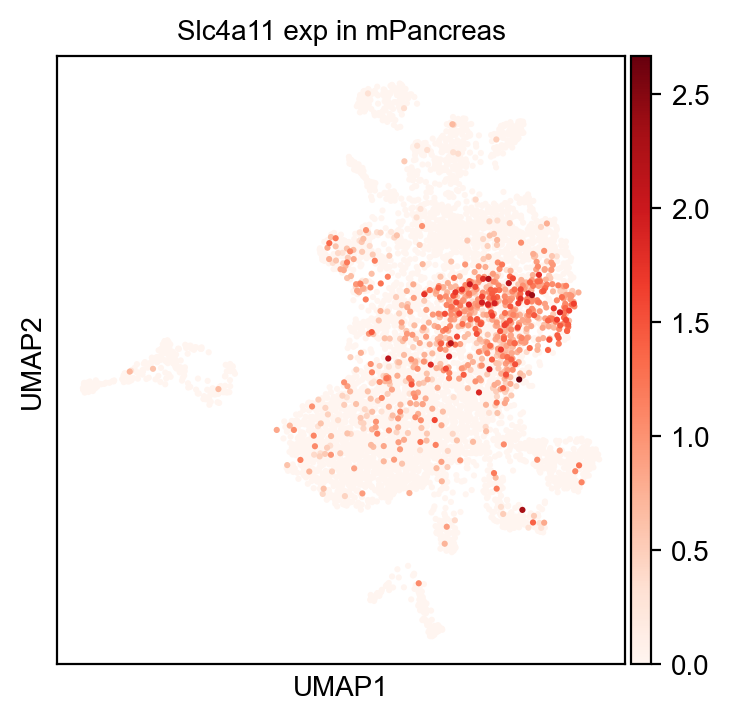

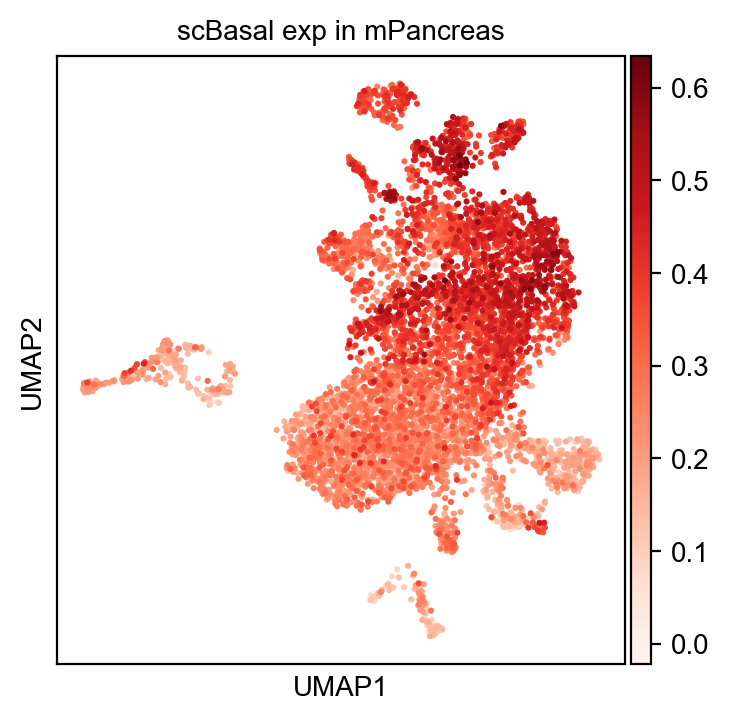

mPancreasB


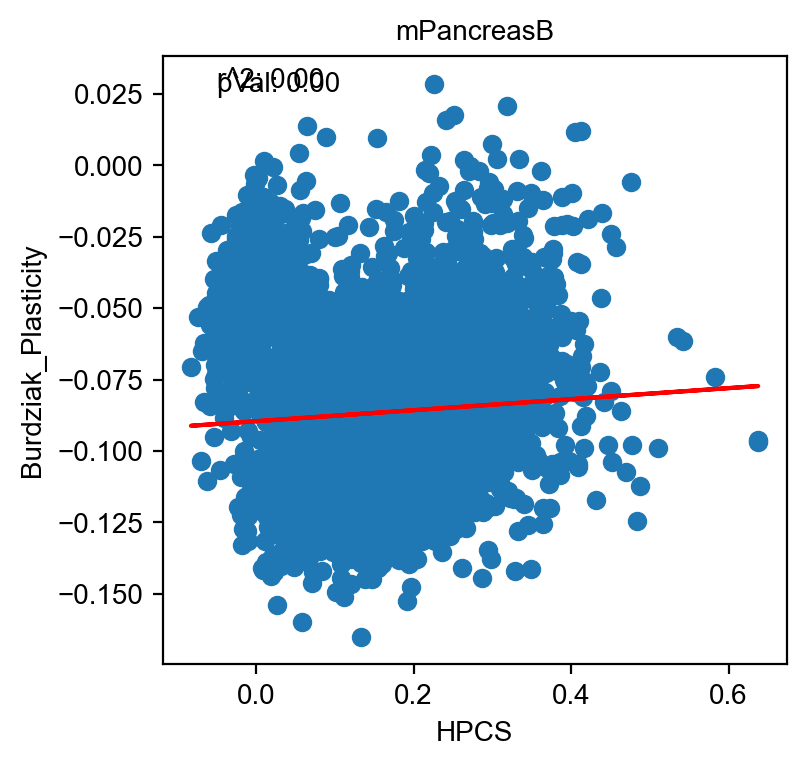

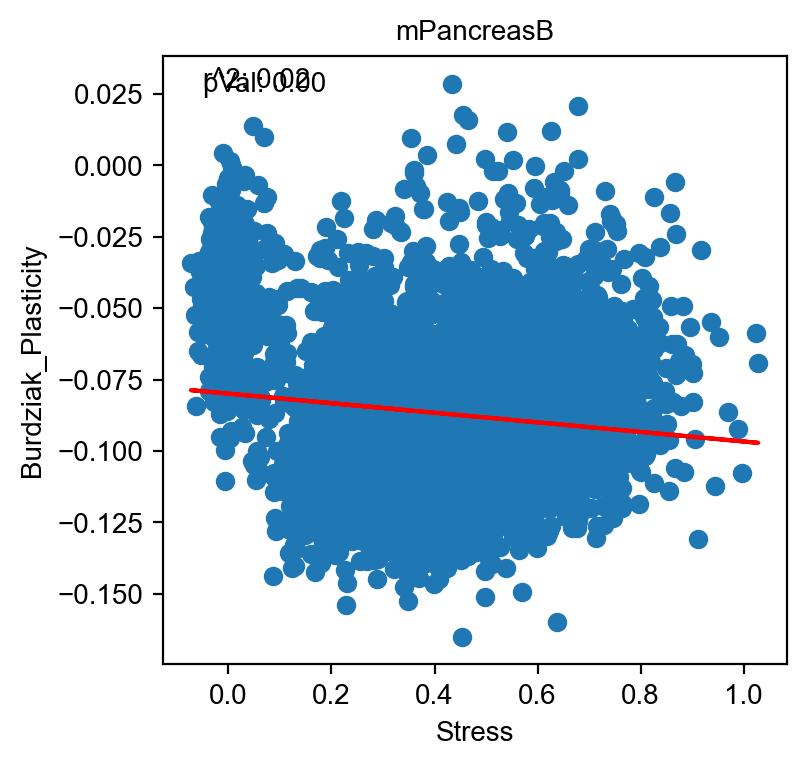

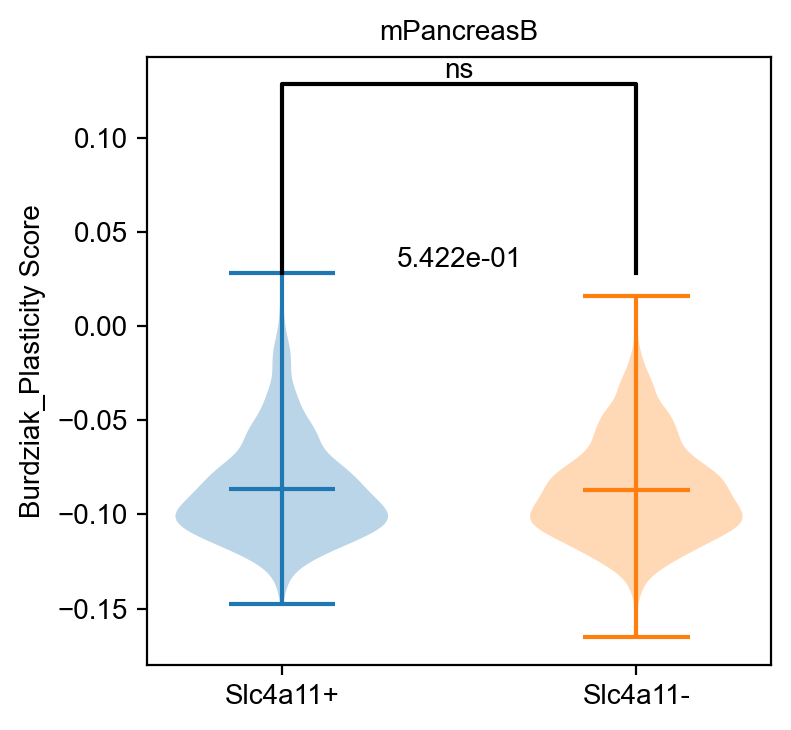

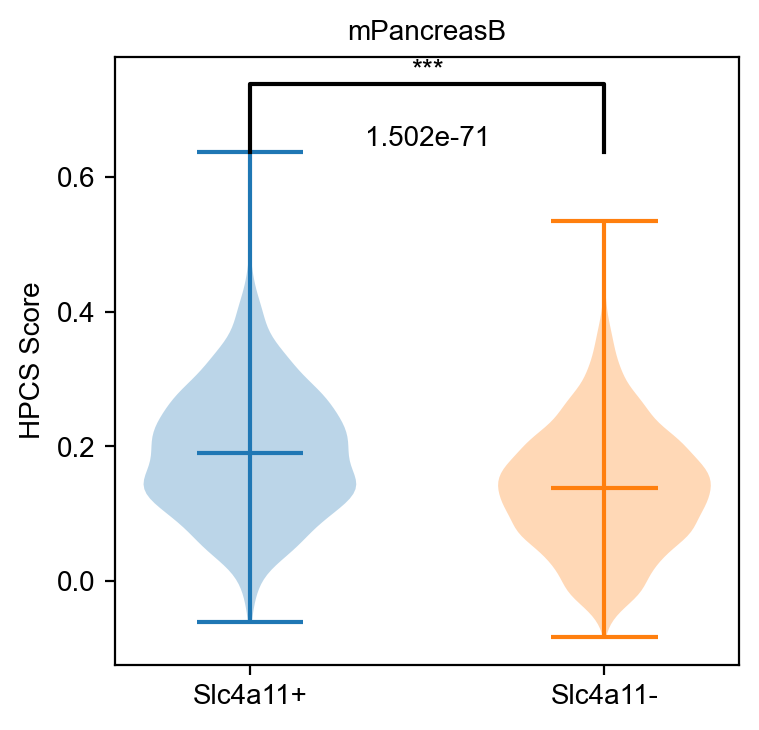

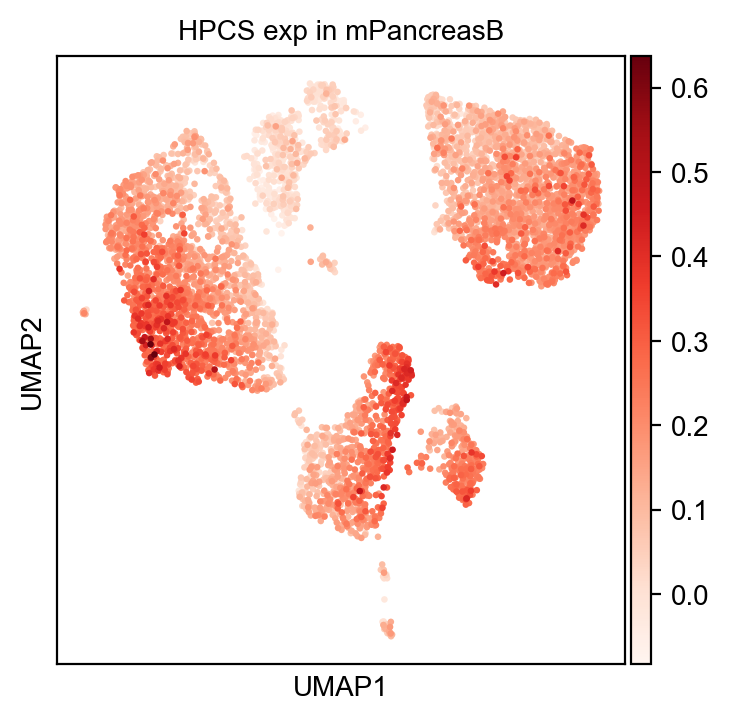

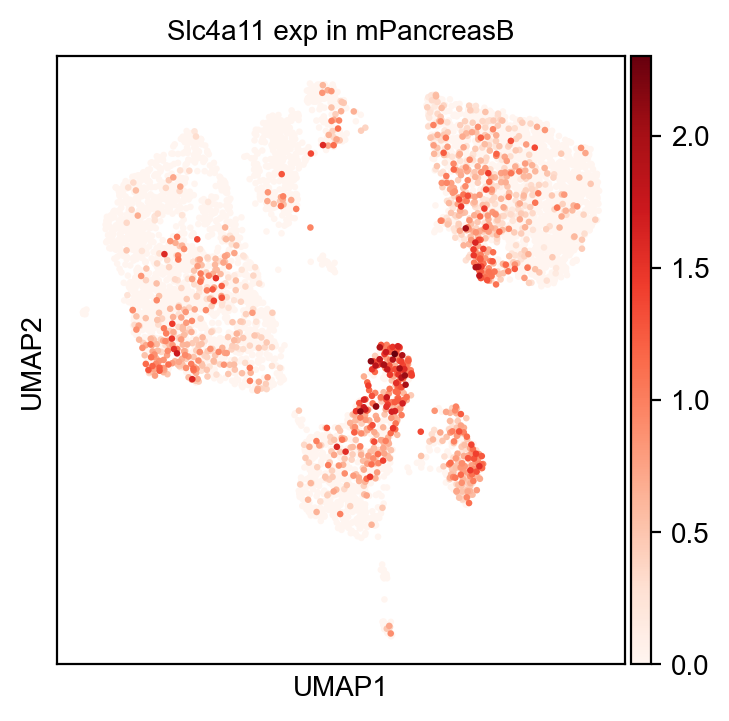

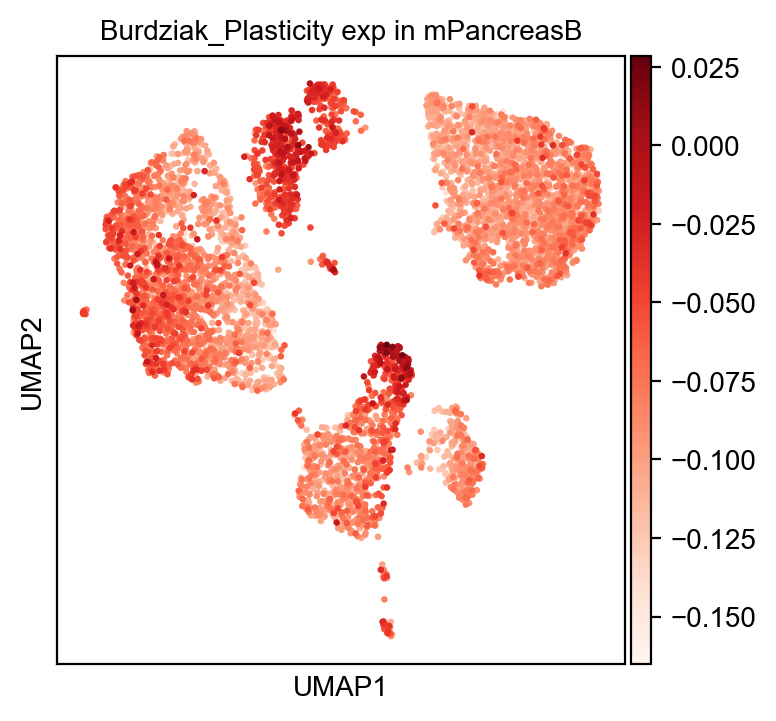

hColon


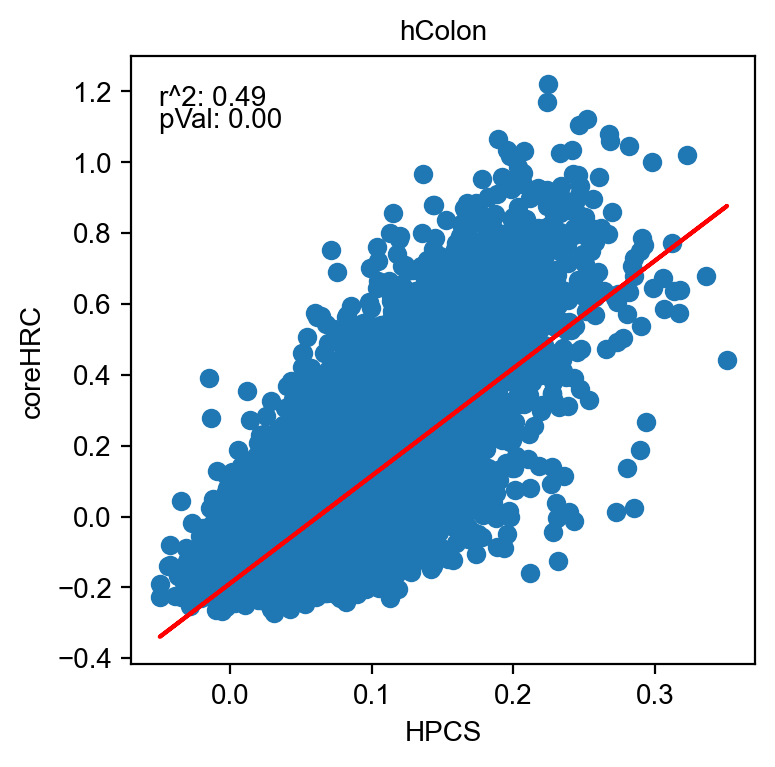

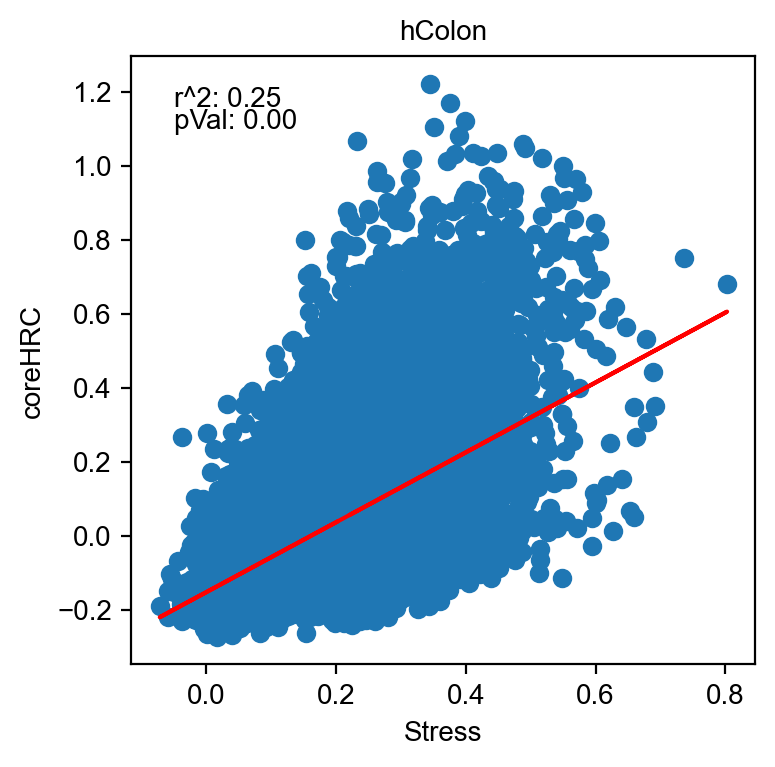

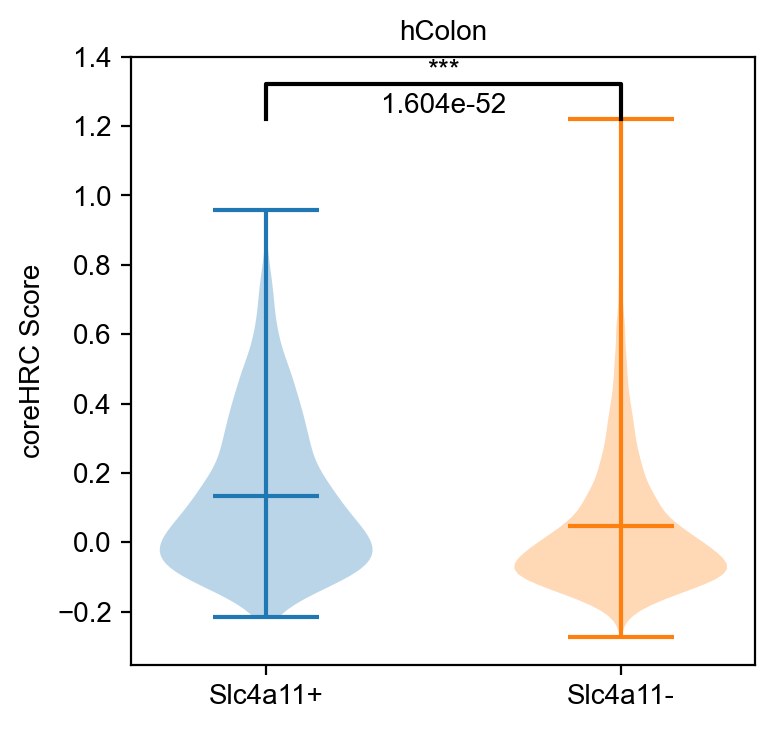

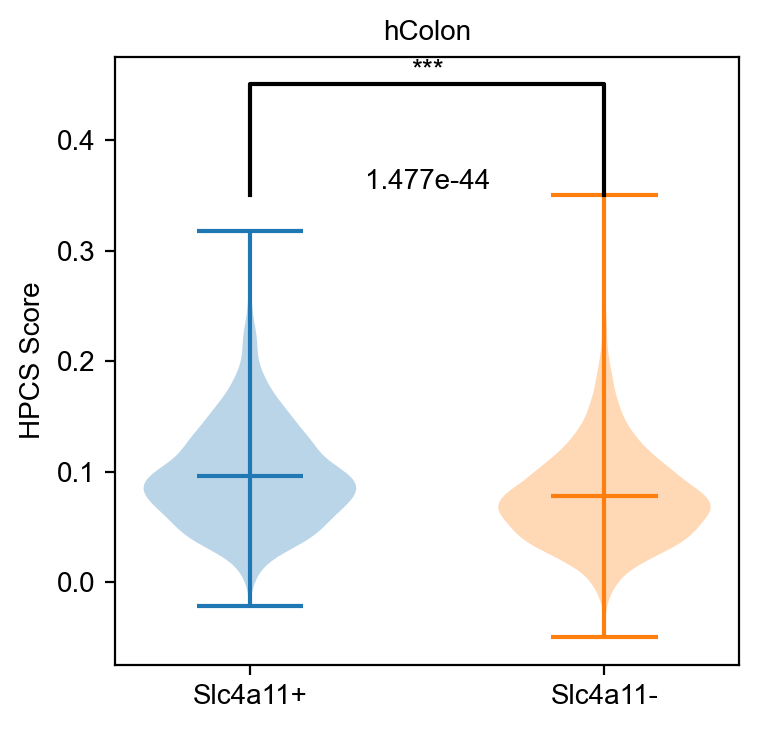

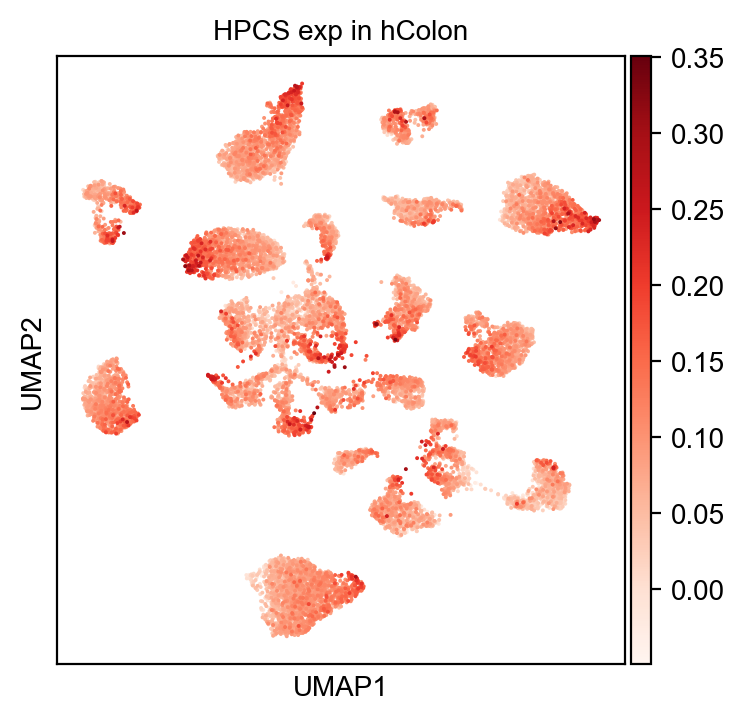

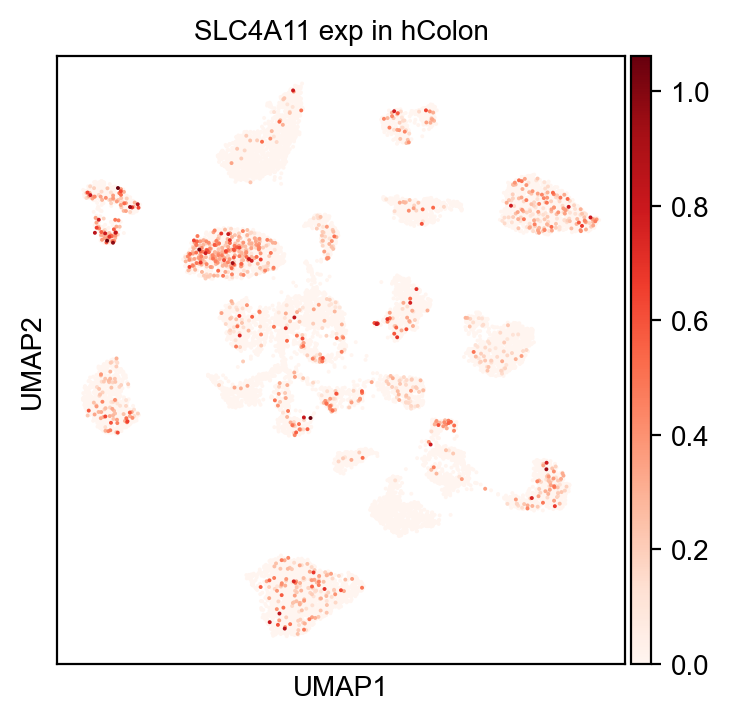

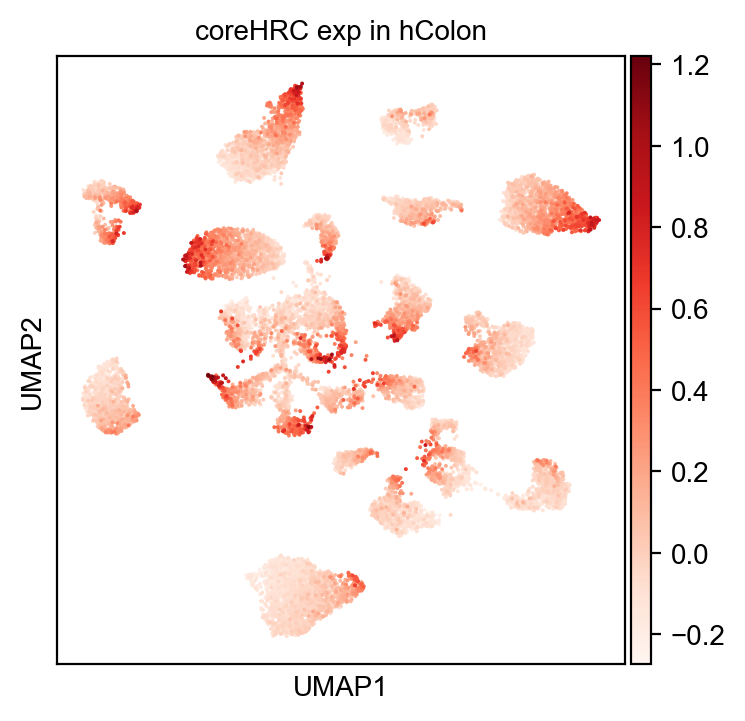

hSkin


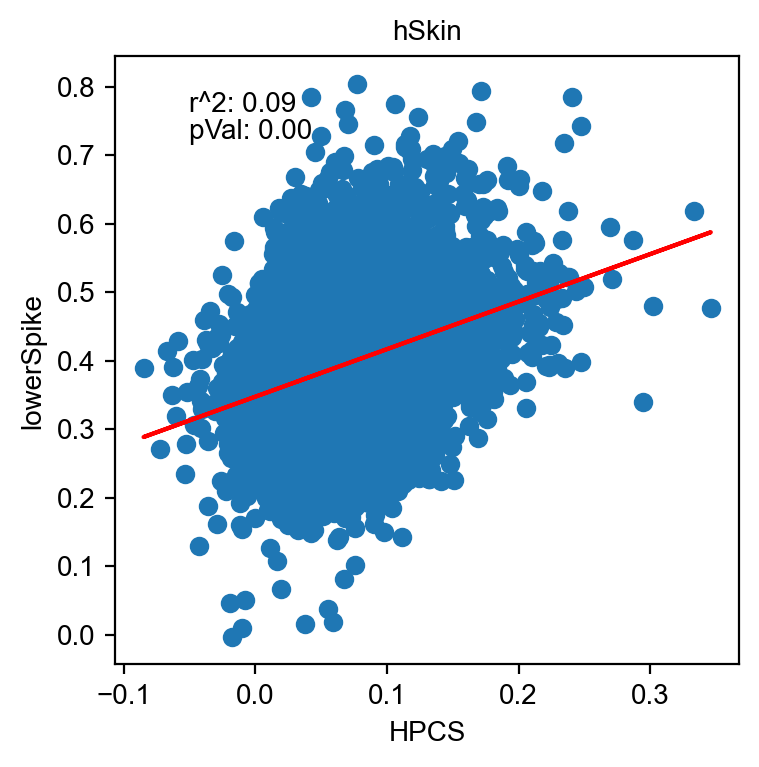

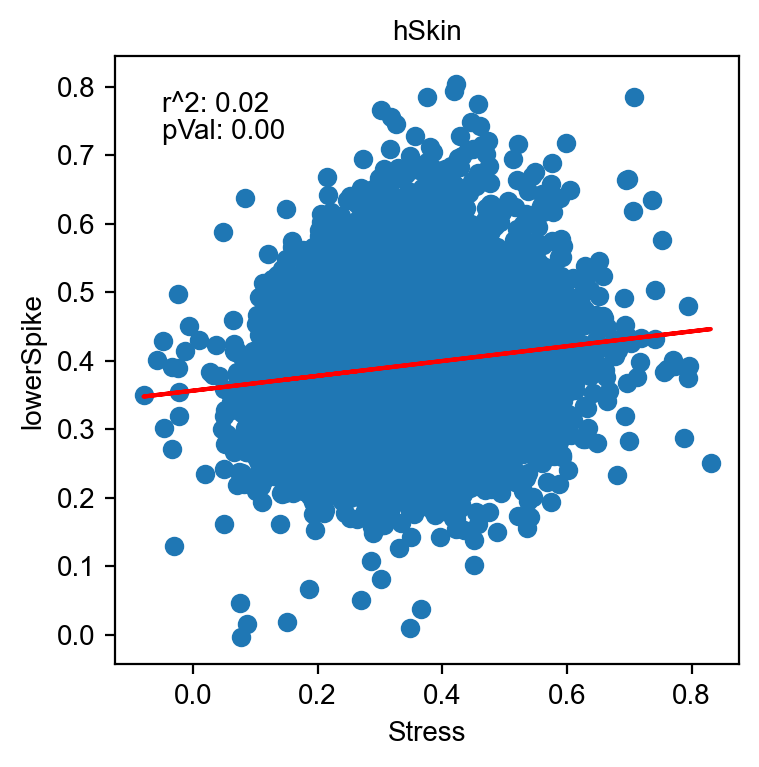

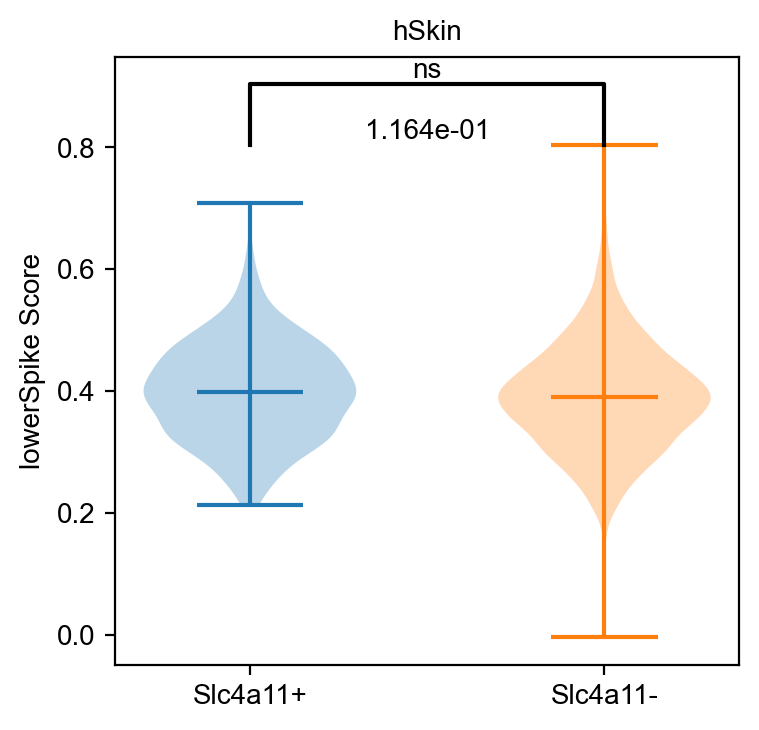

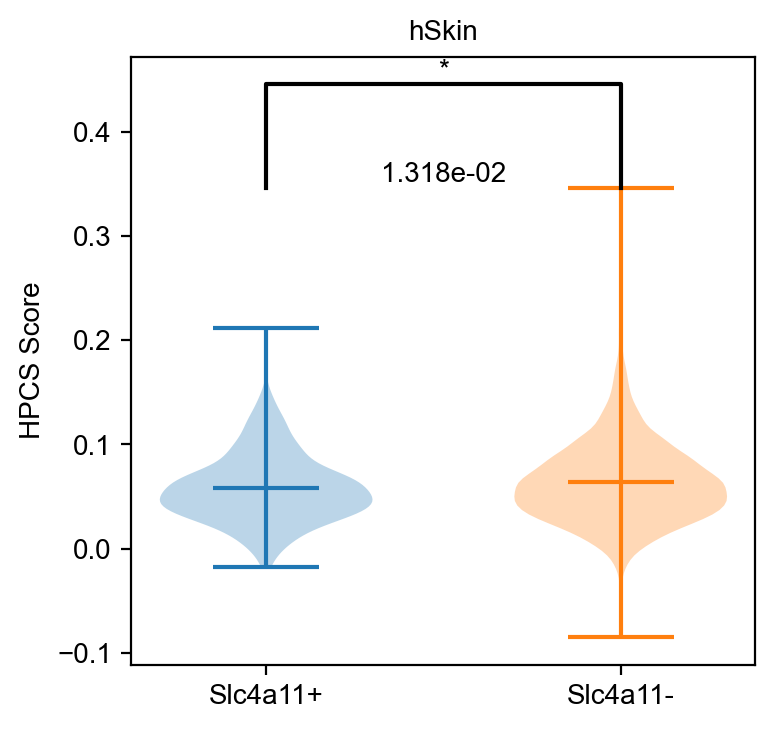

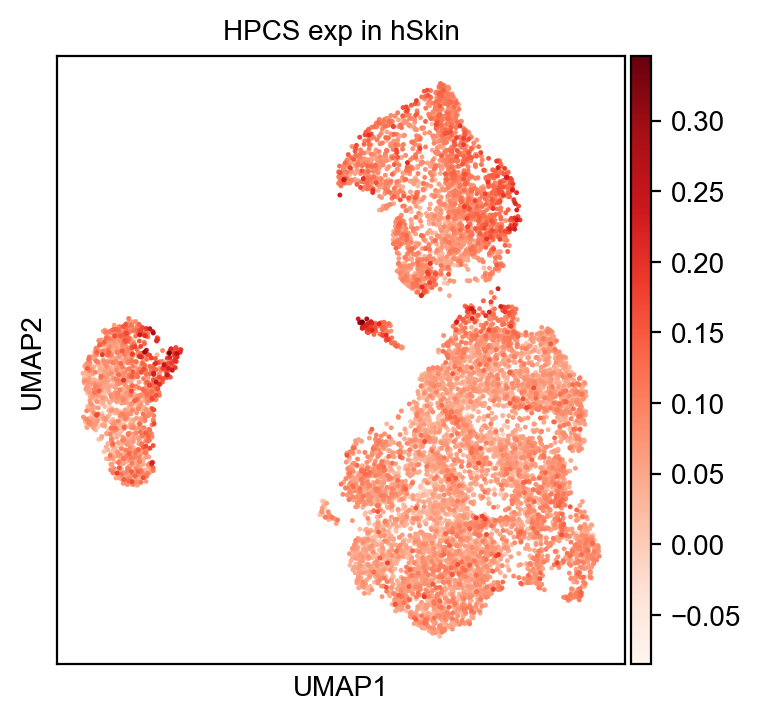

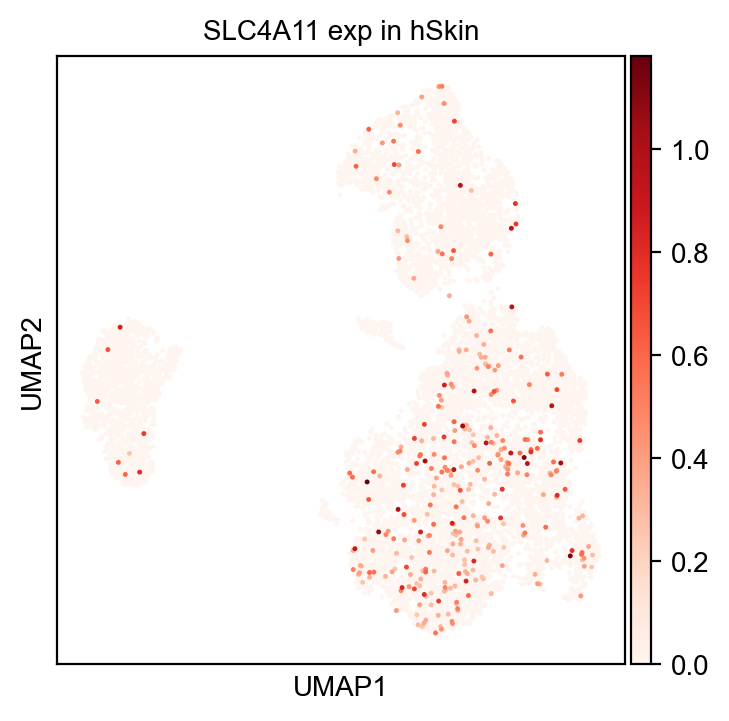

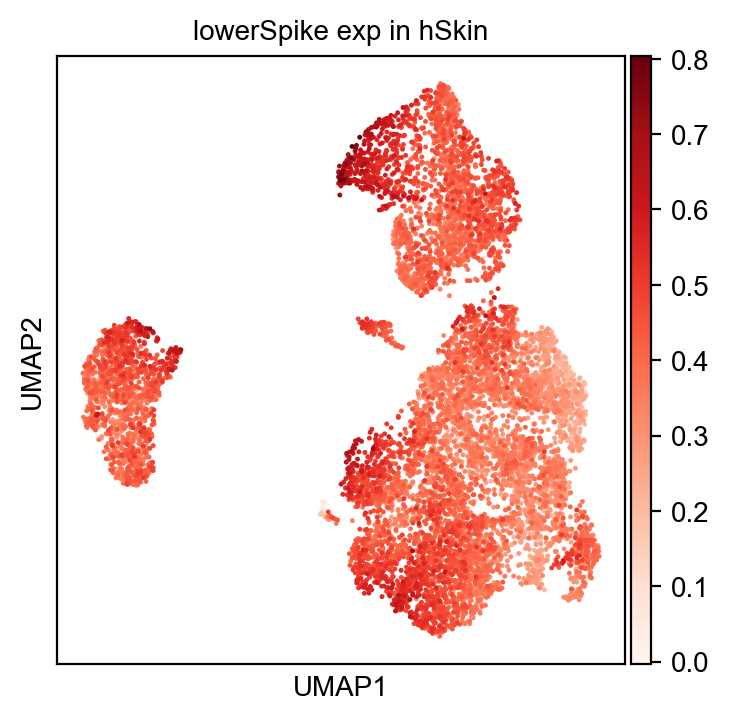

hProstate


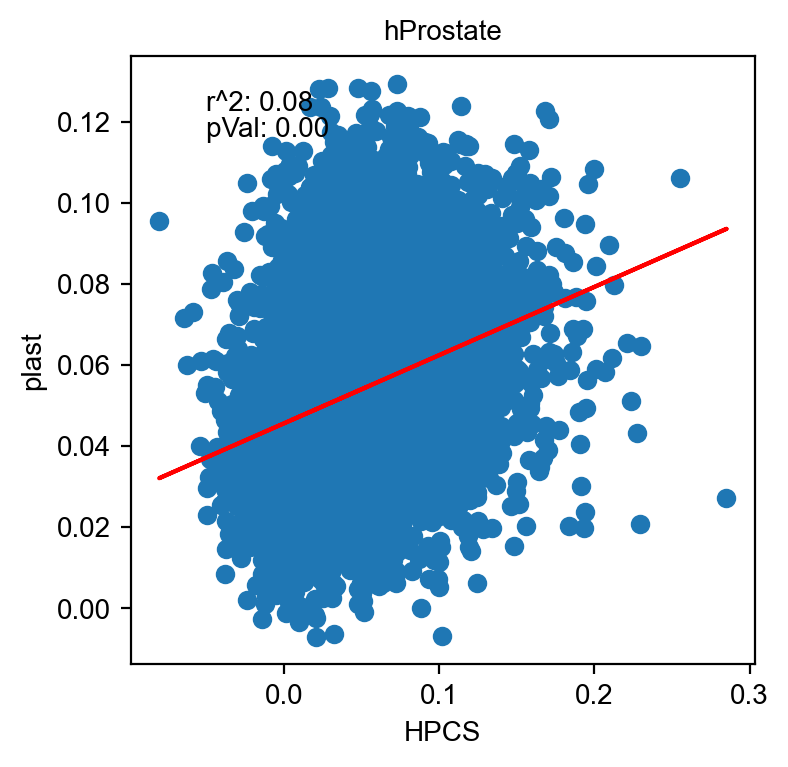

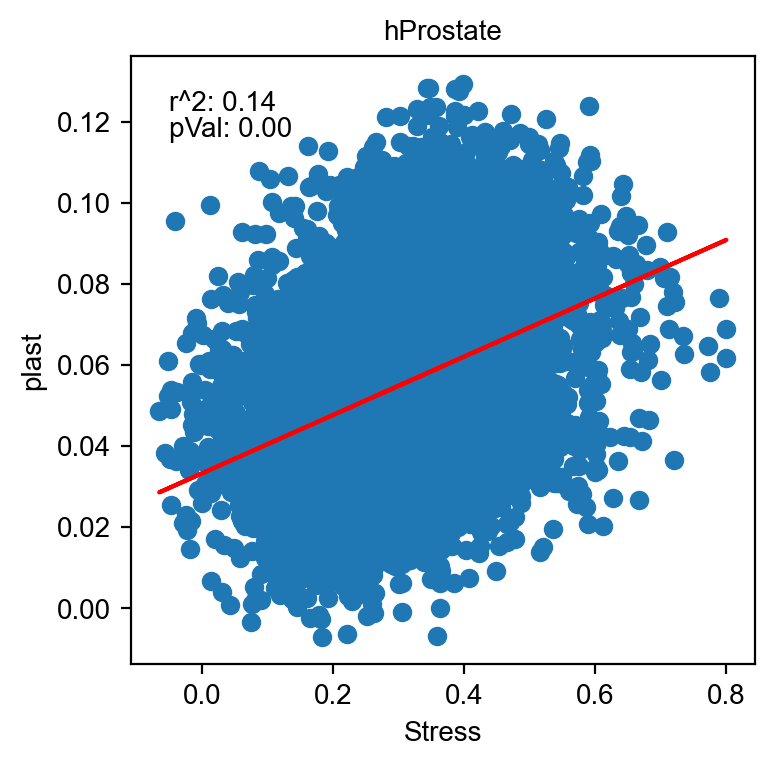

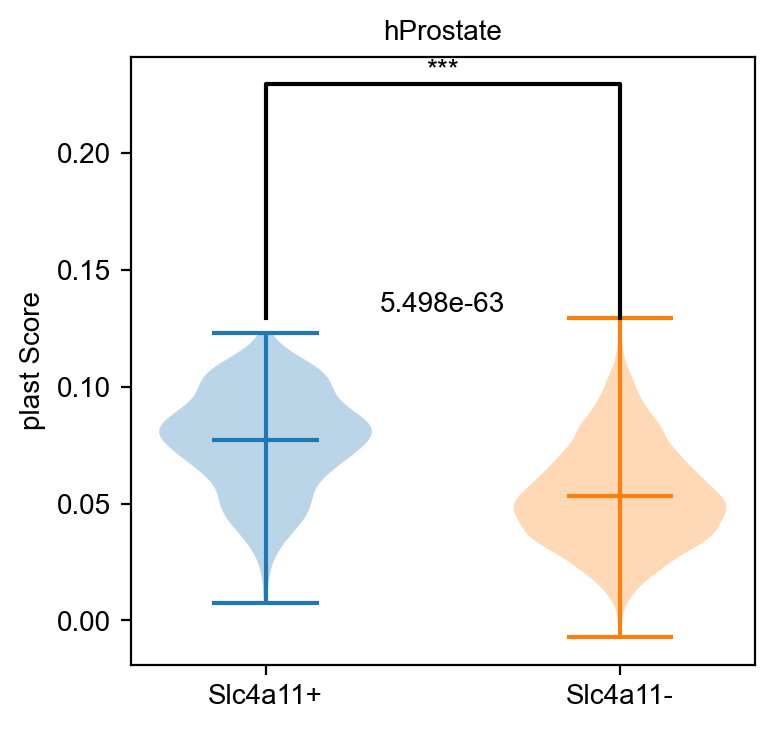

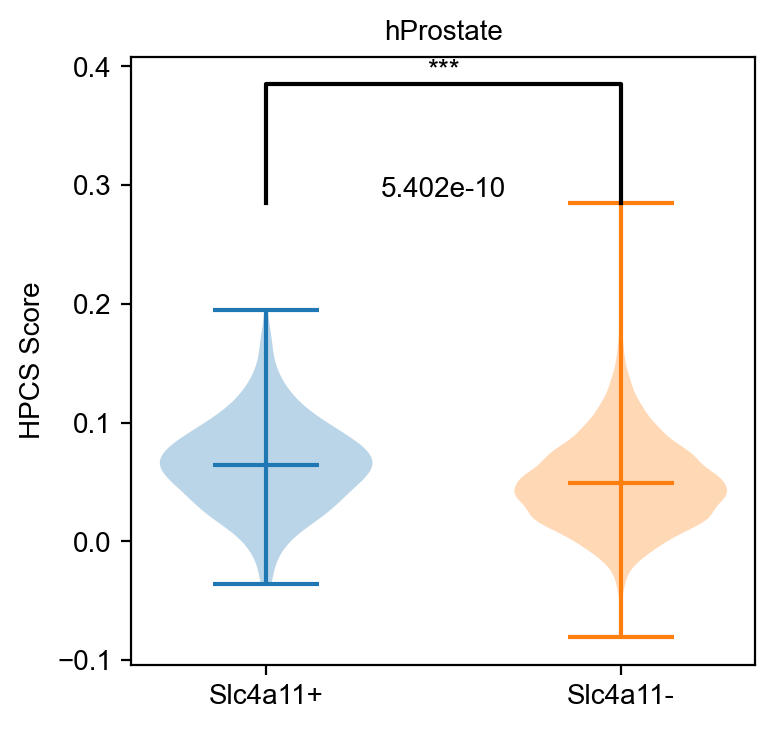

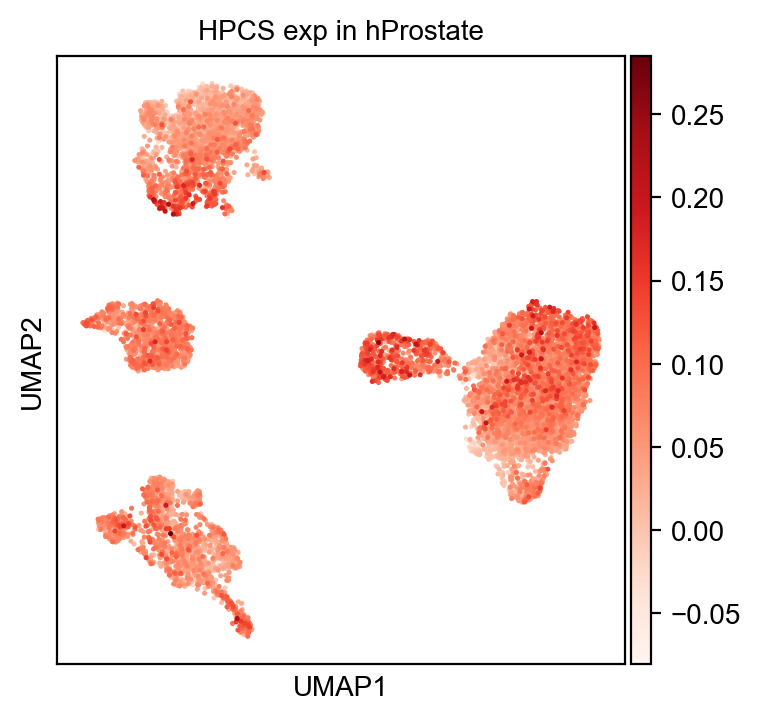

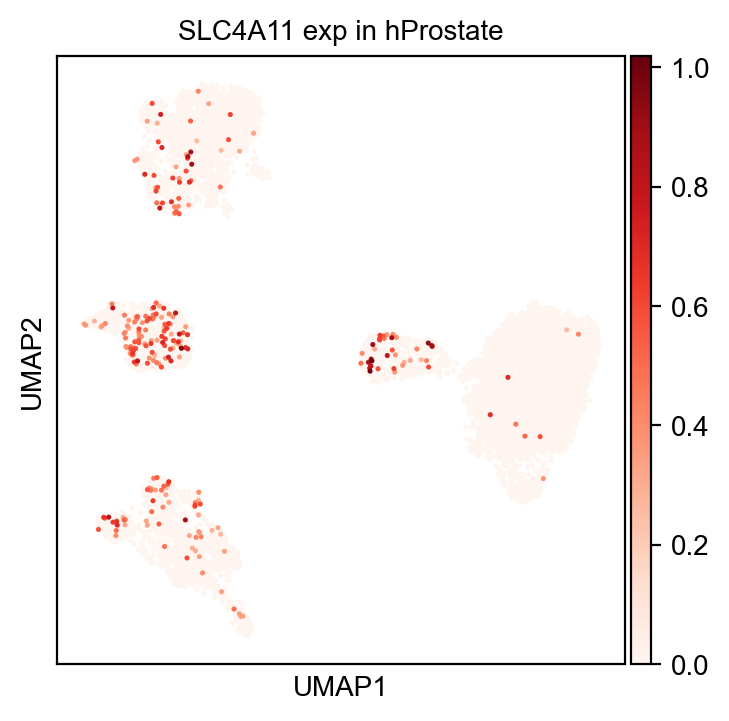

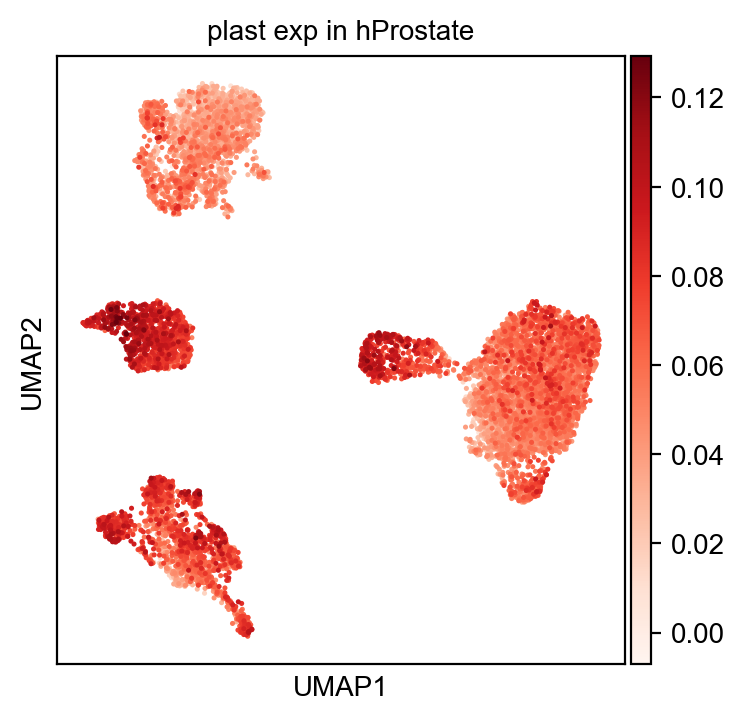

hPancreas


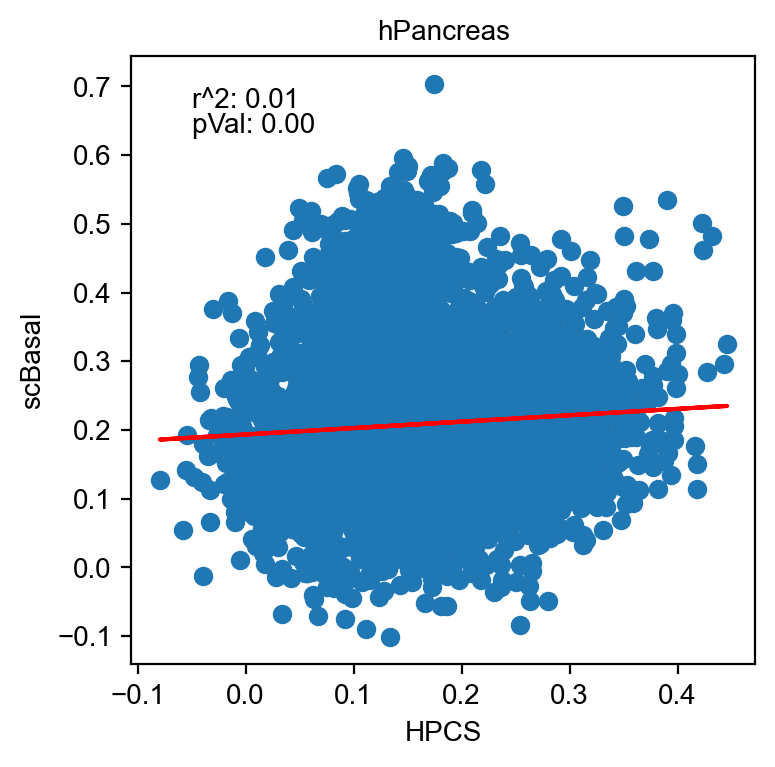

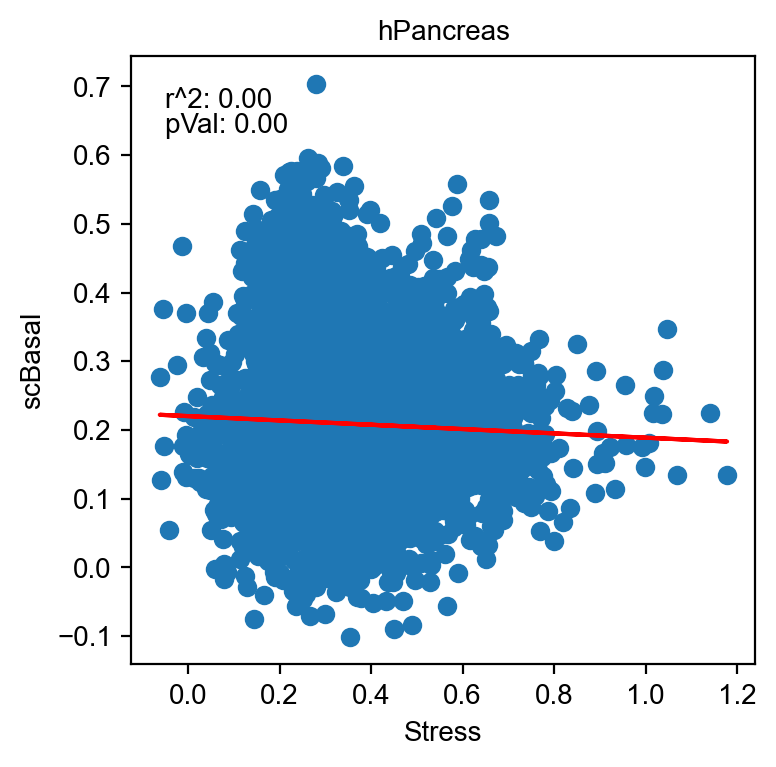

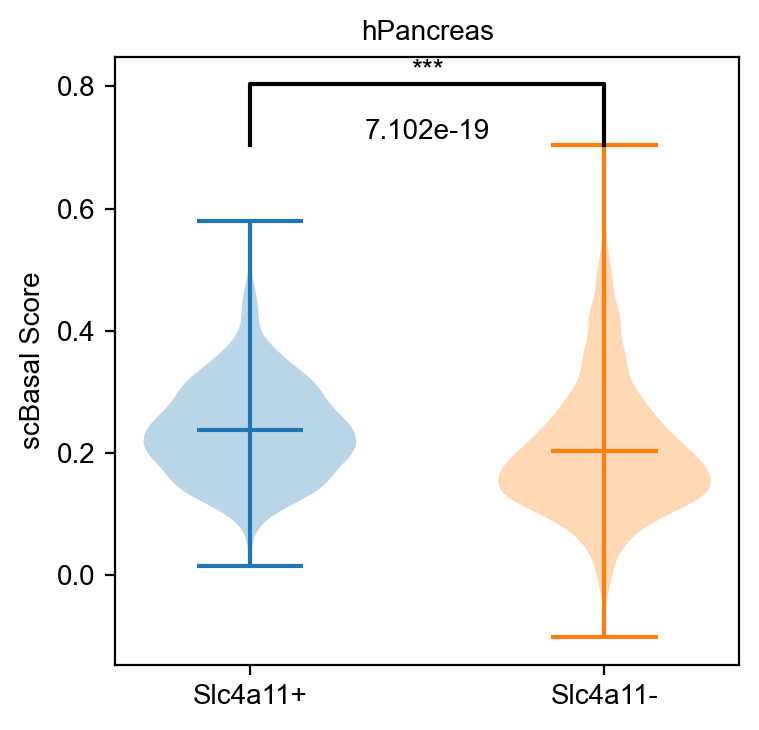

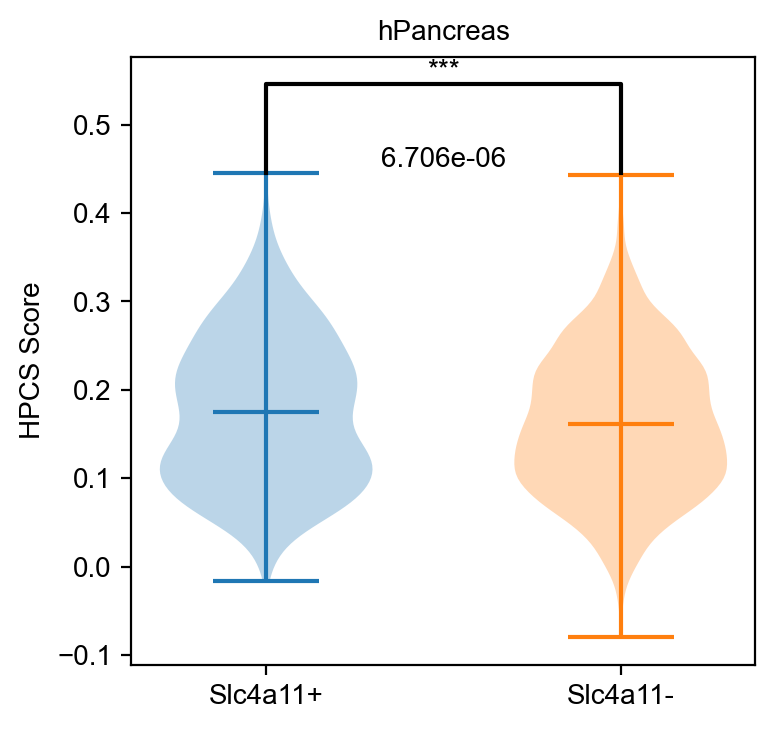

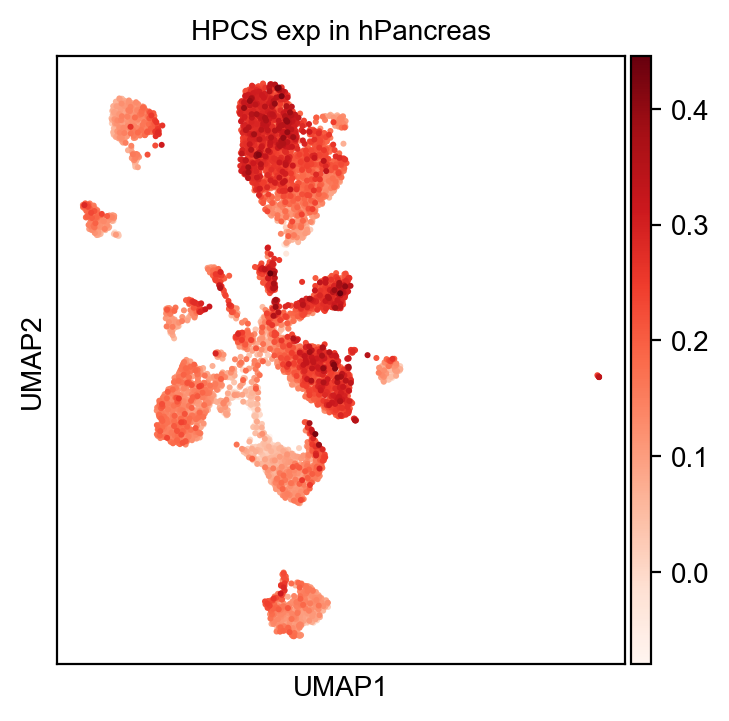

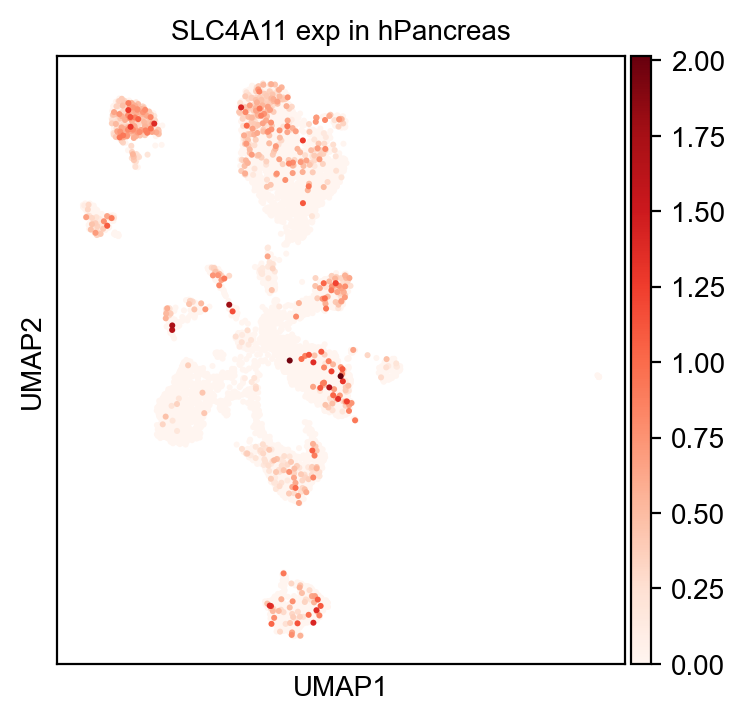

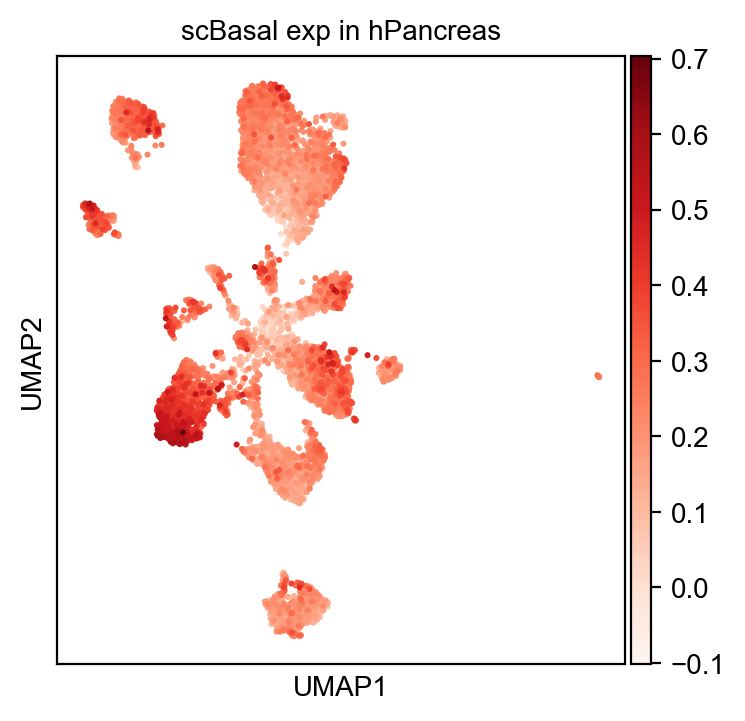

hLungM


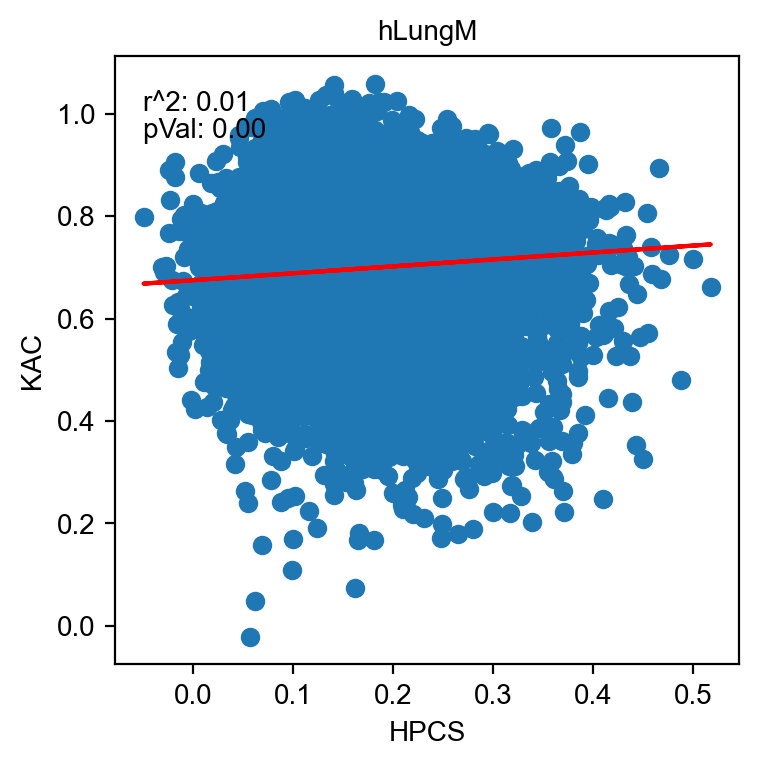

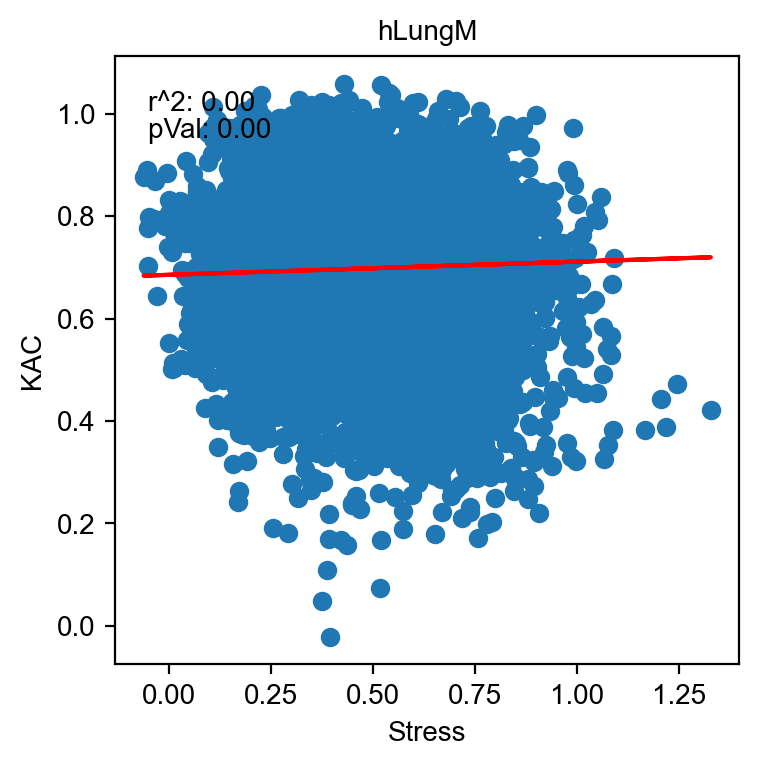

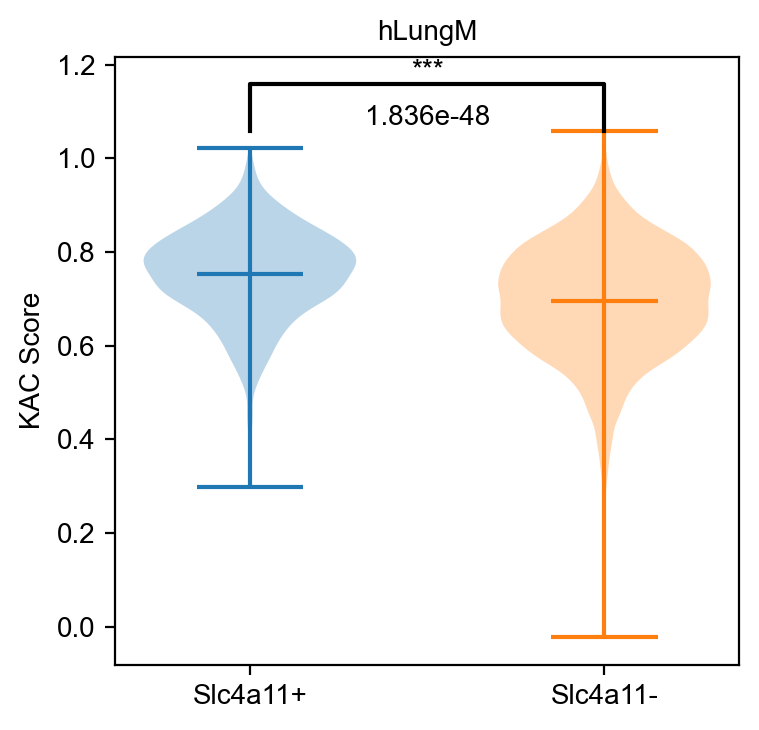

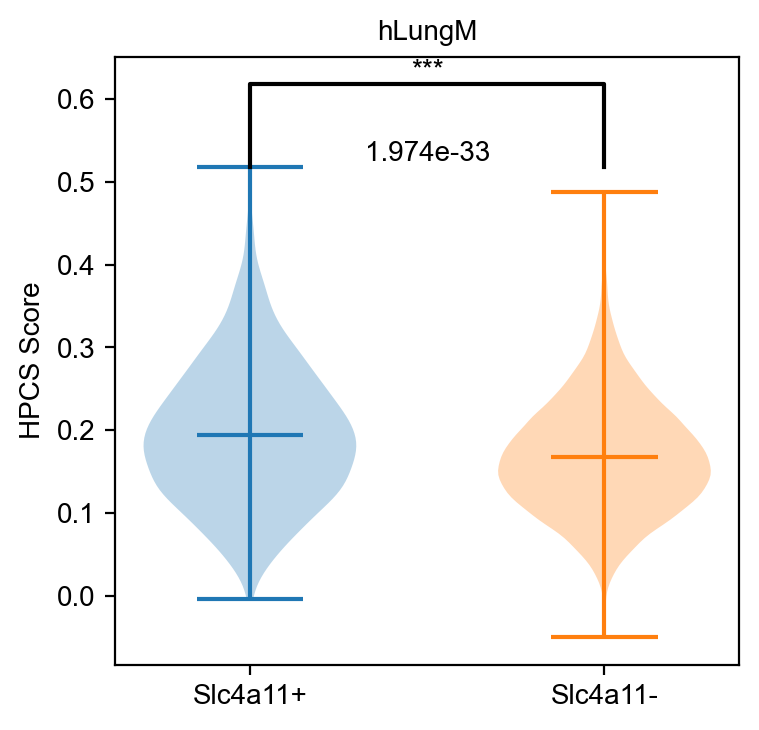

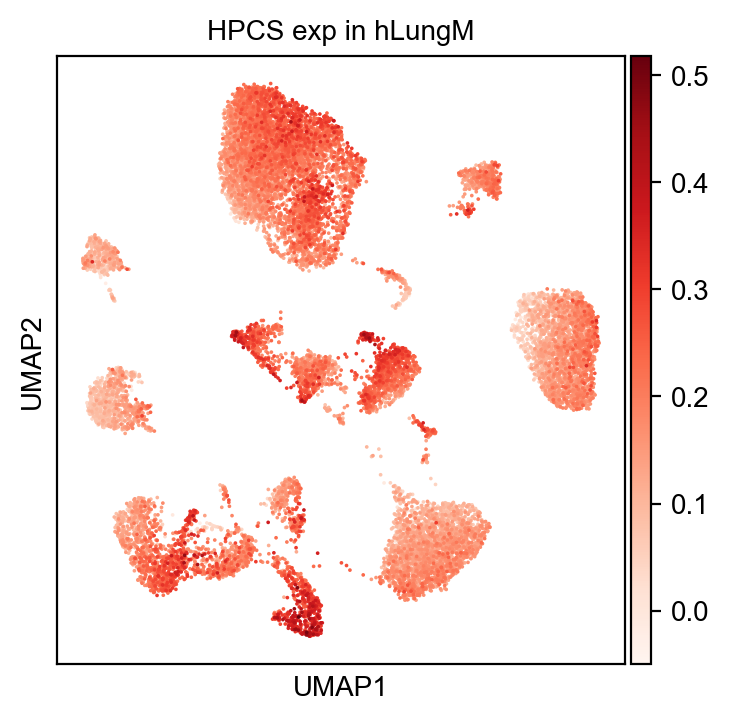

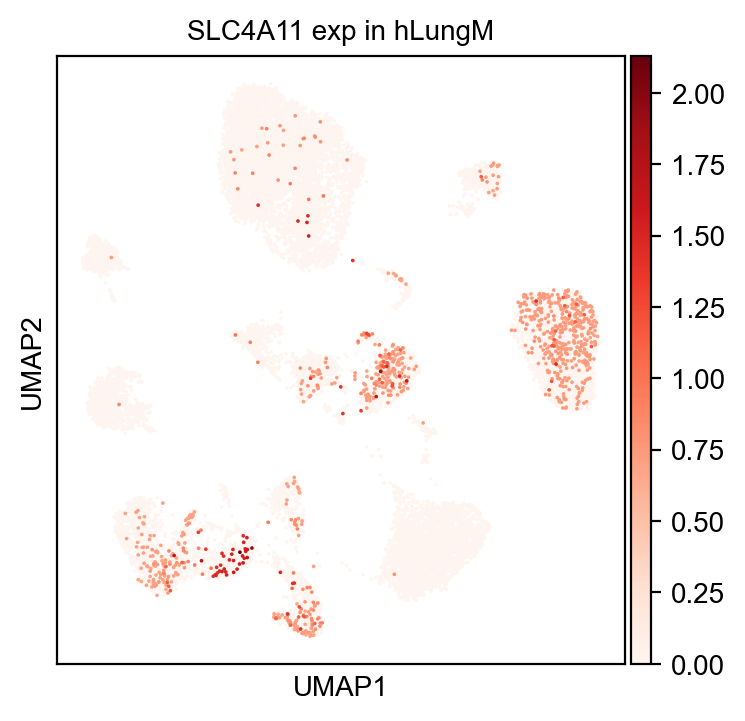

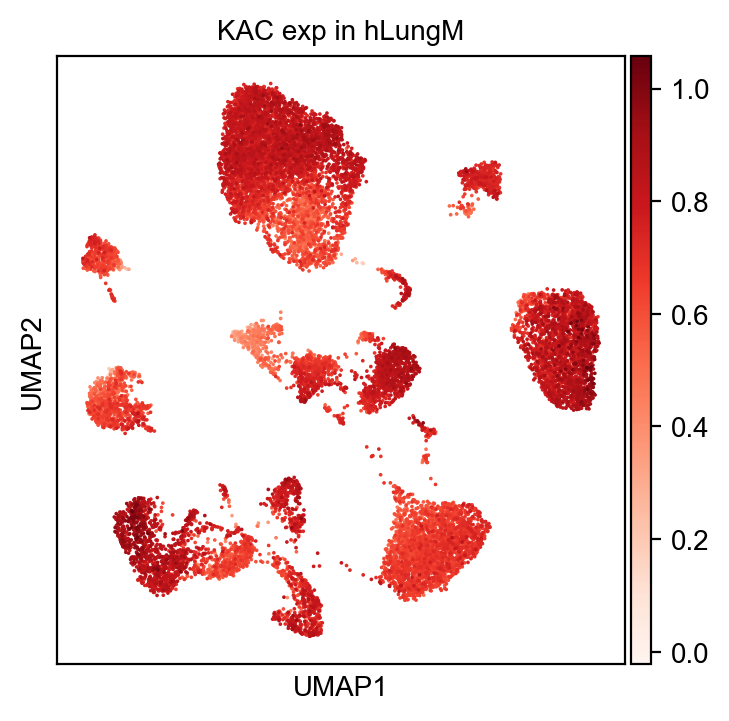

hLungK


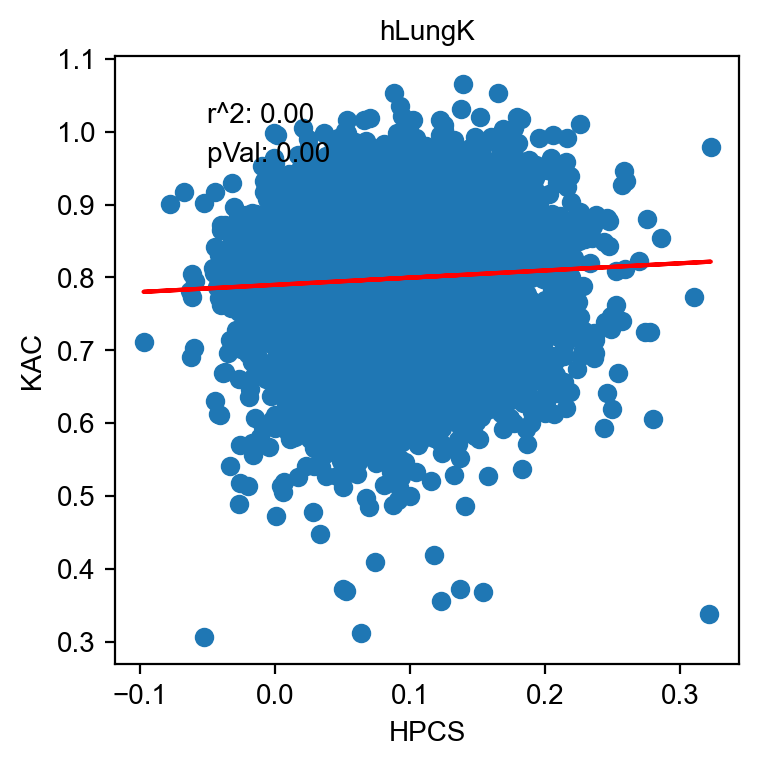

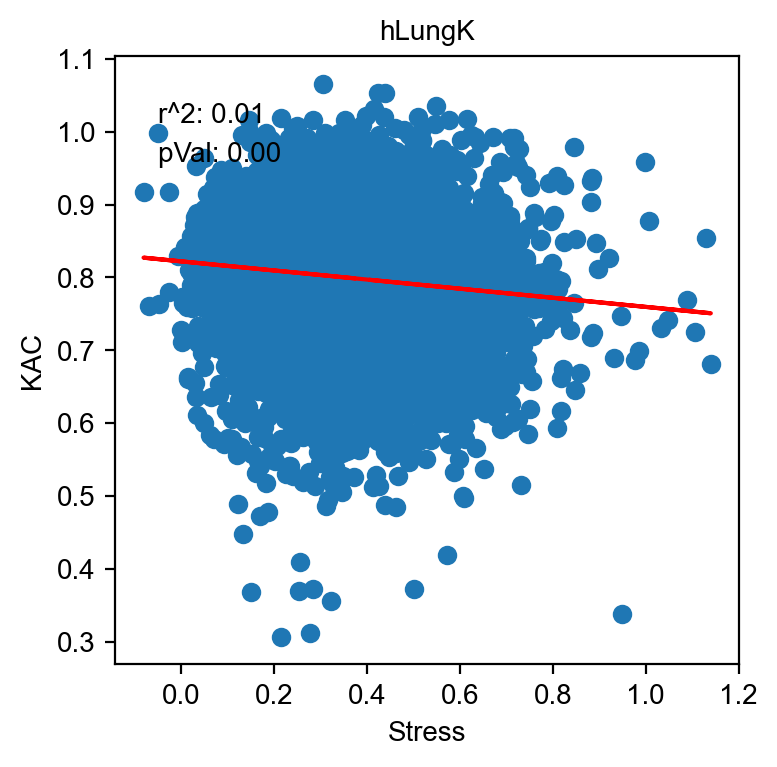

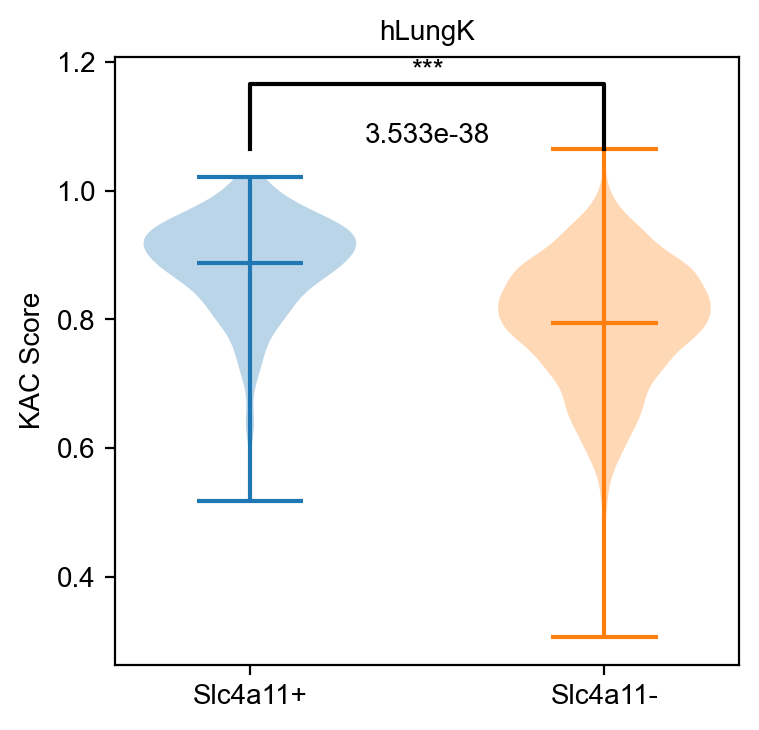

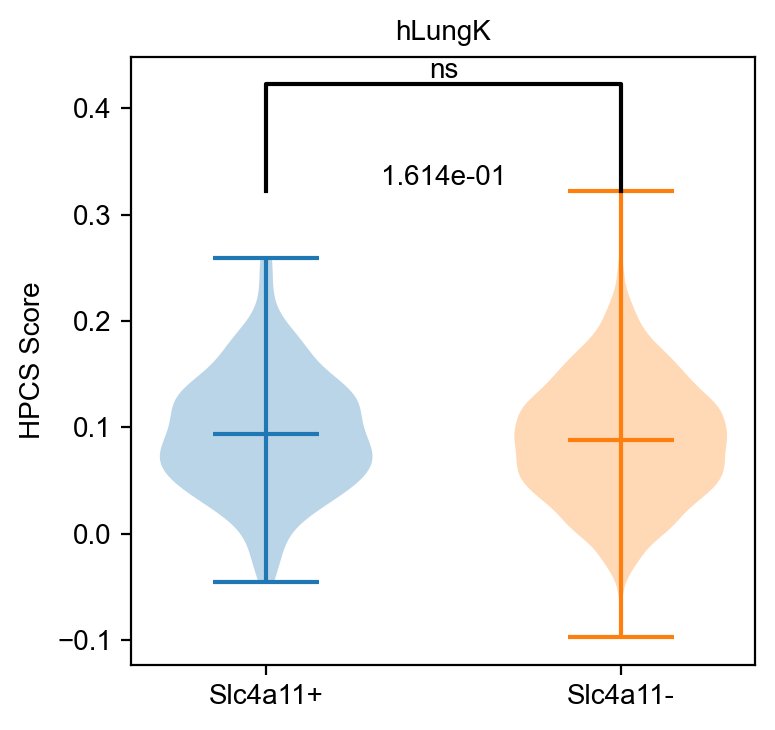

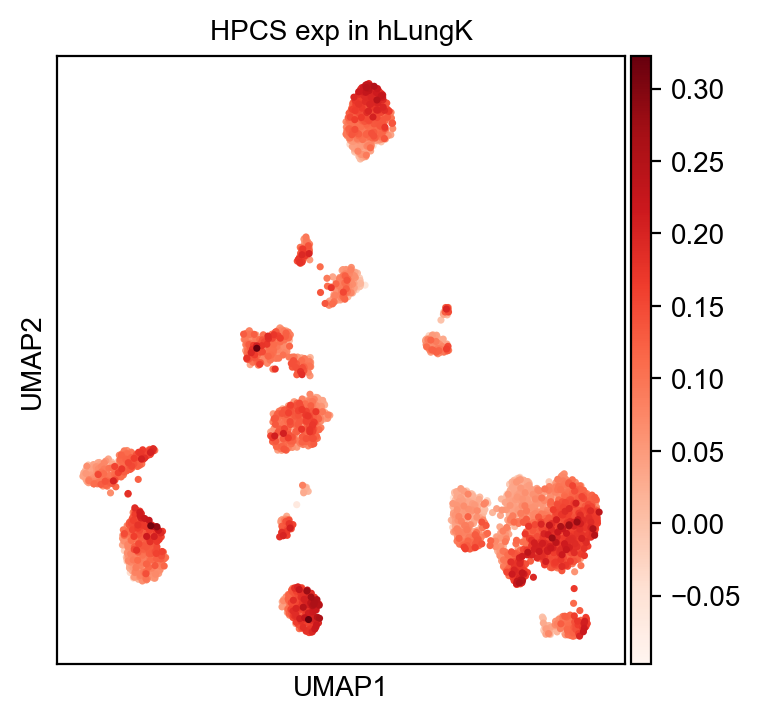

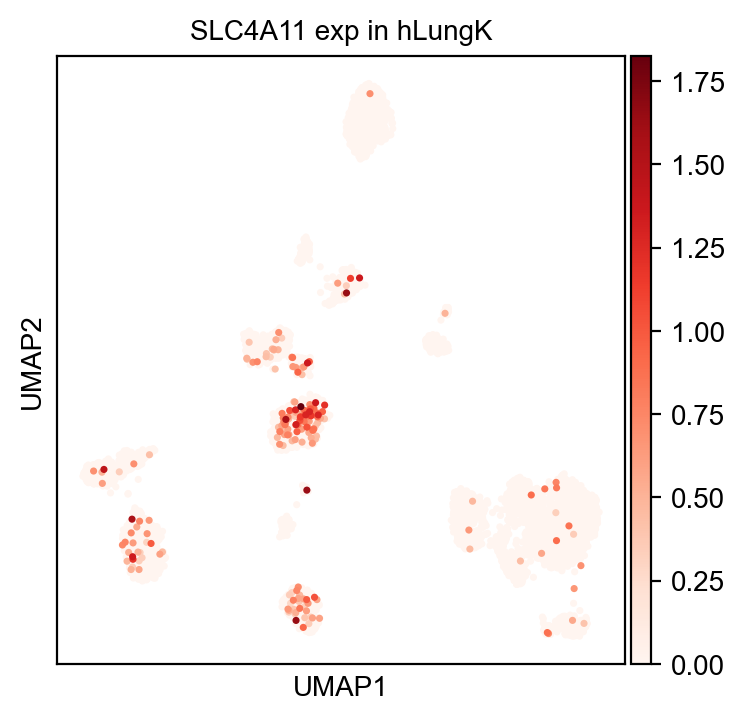

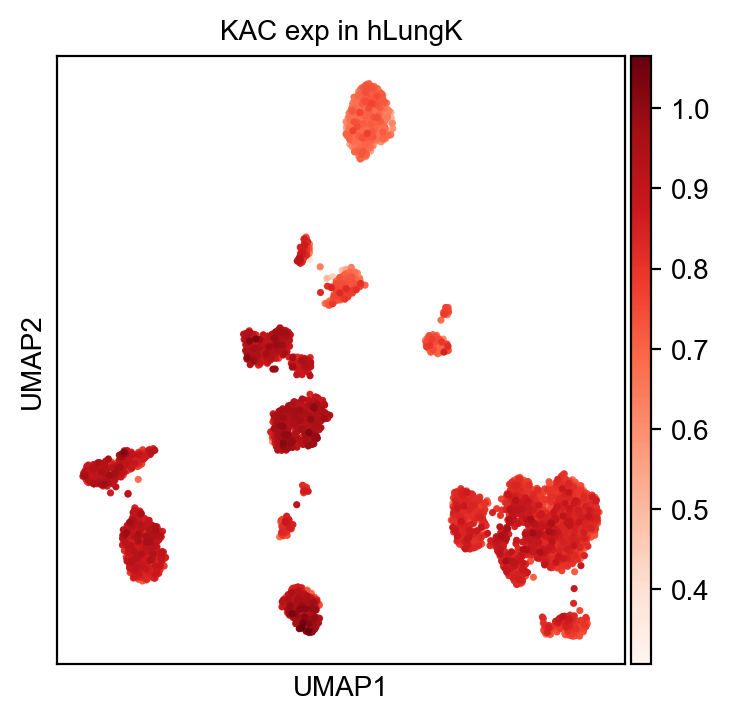

hLungB


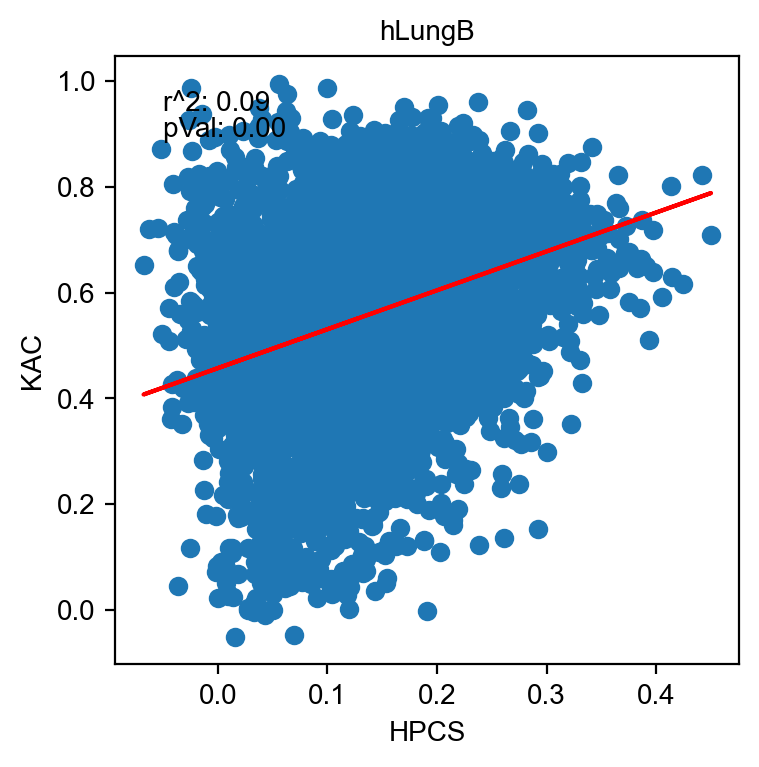

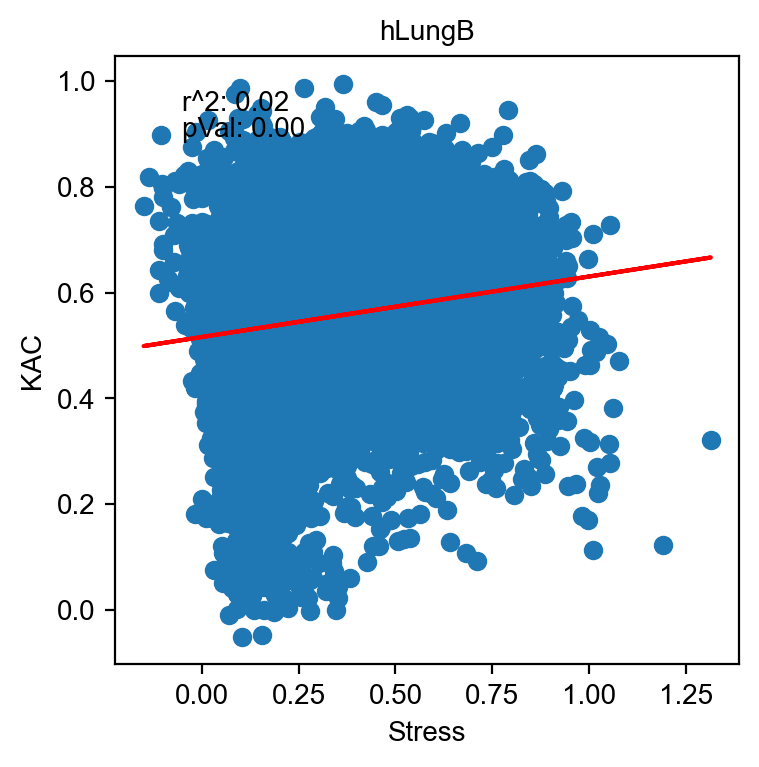

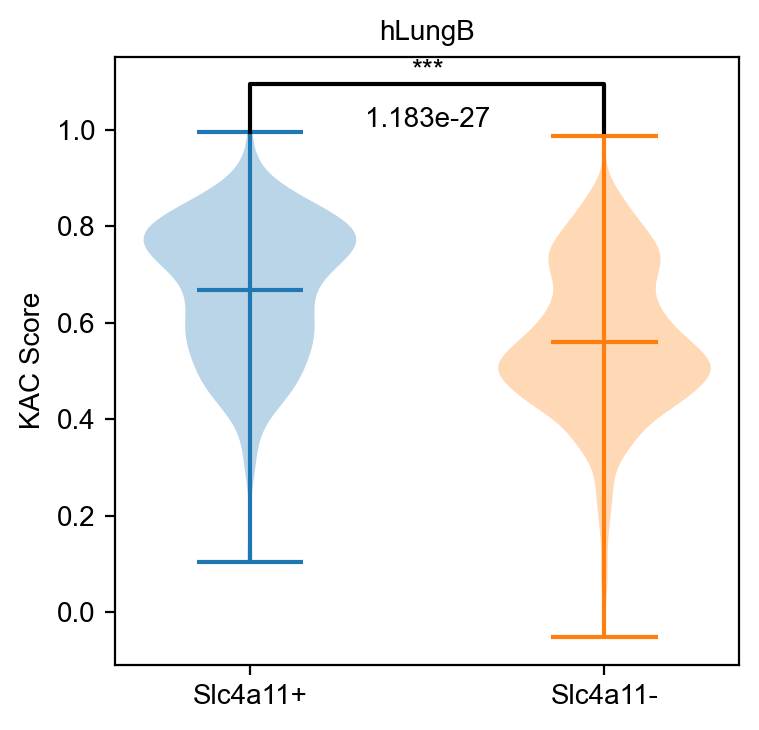

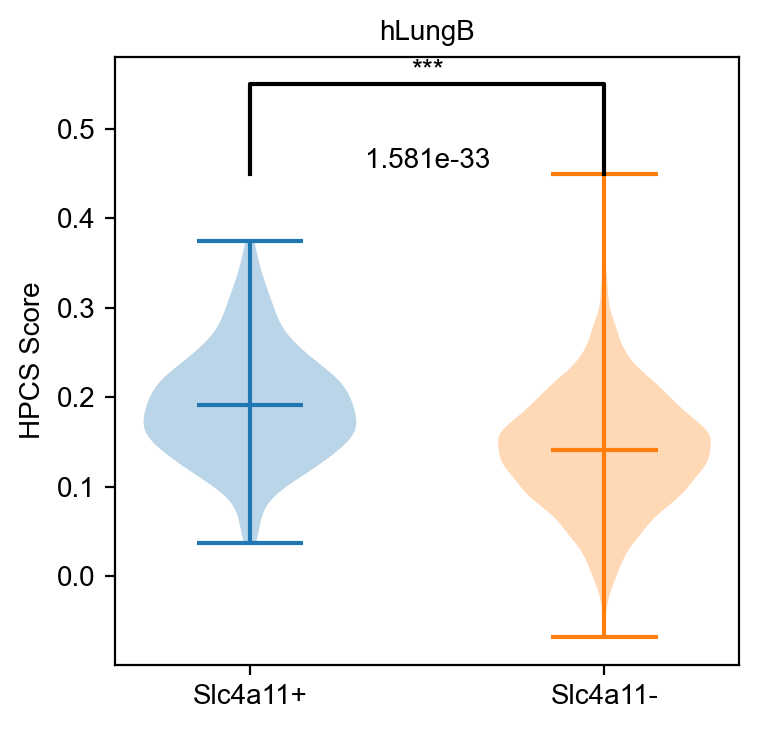

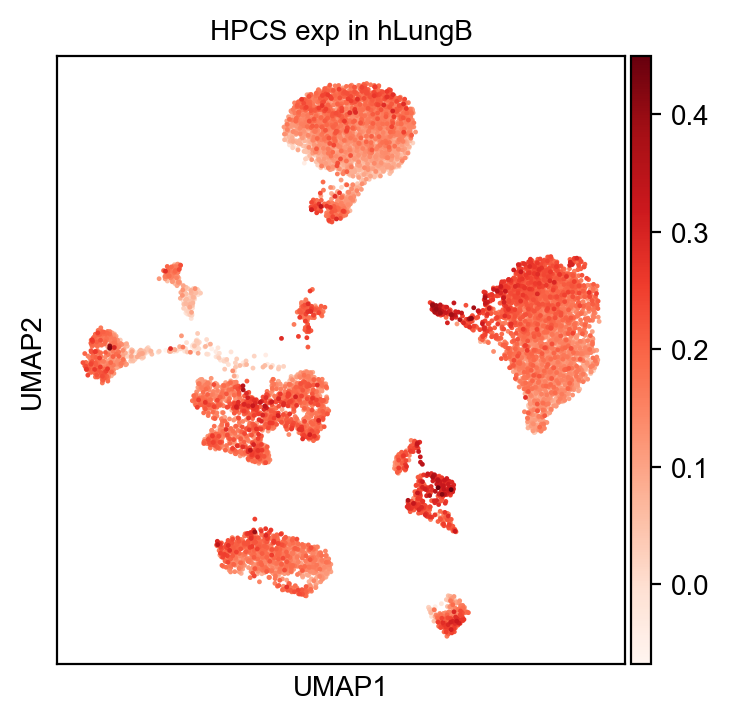

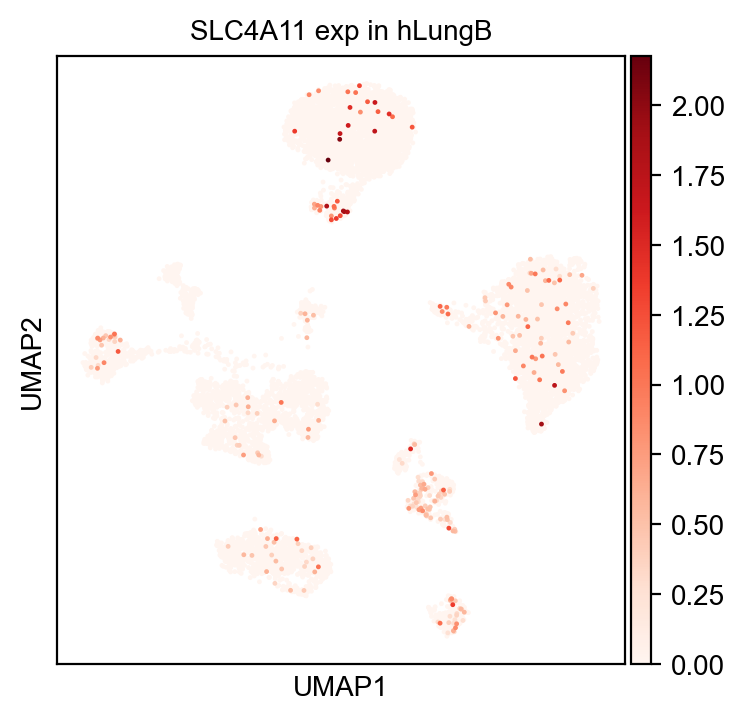

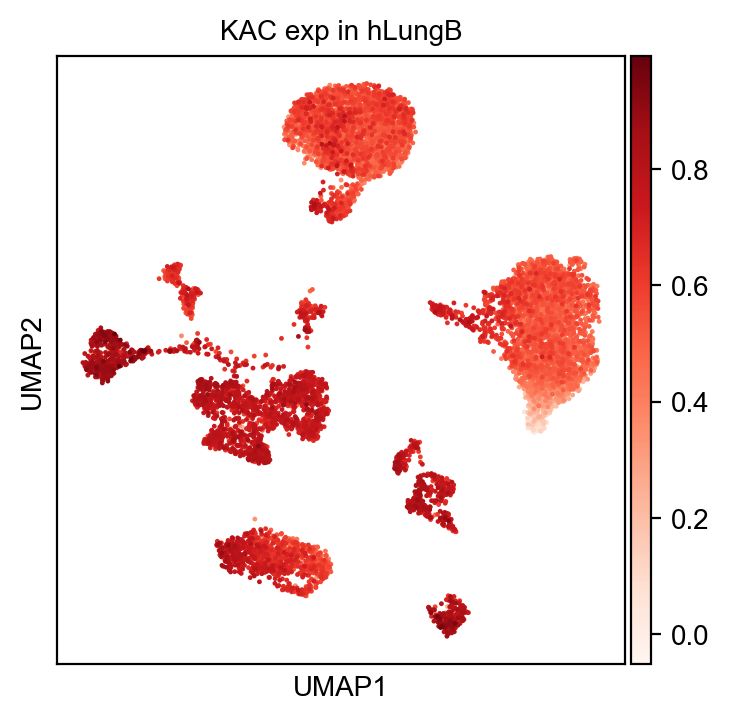

hLungD


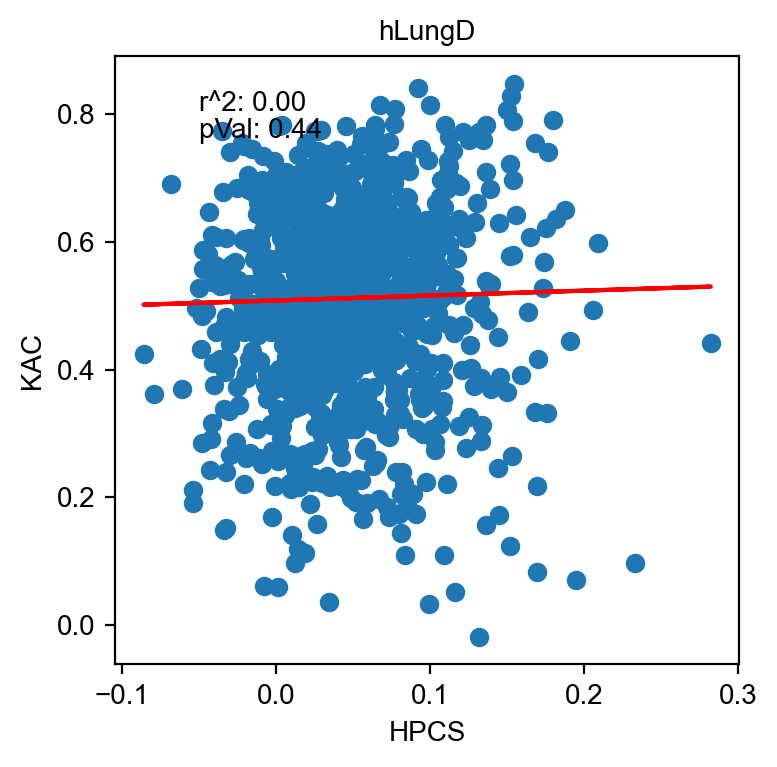

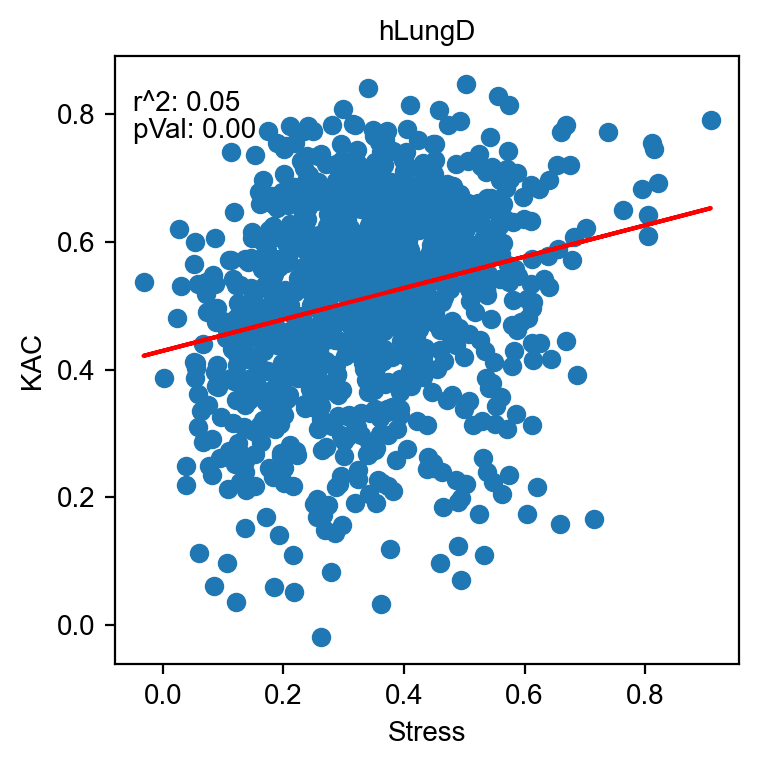

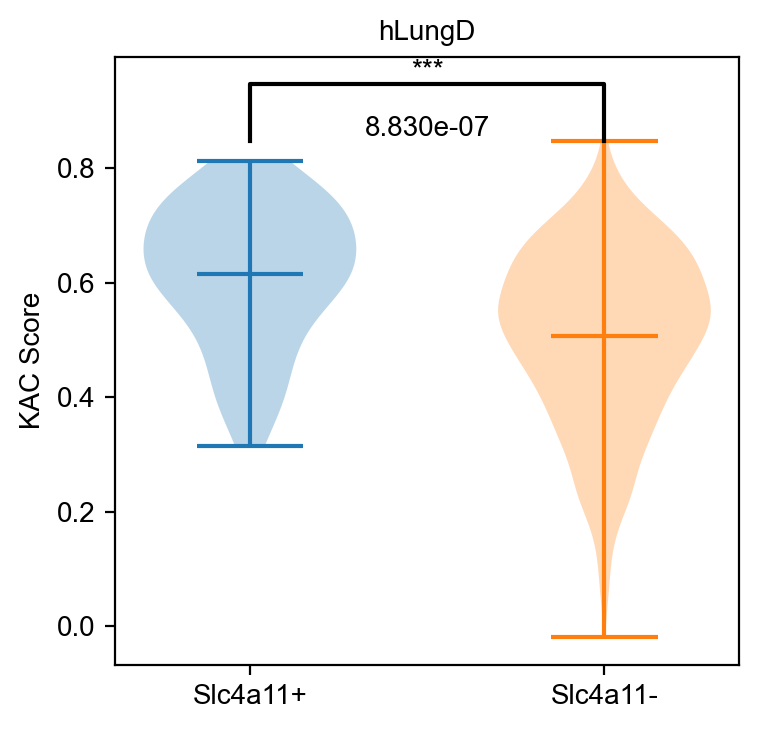

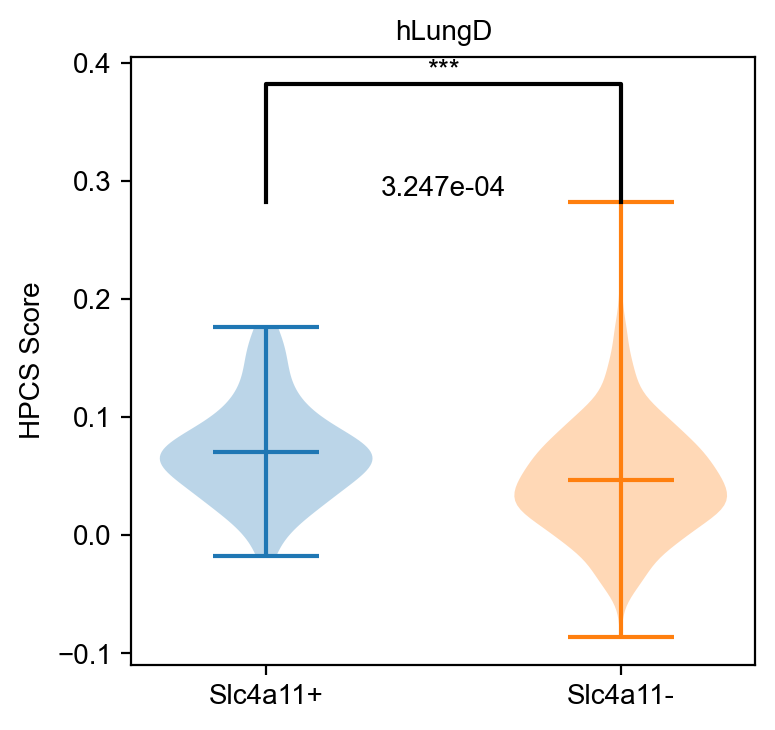

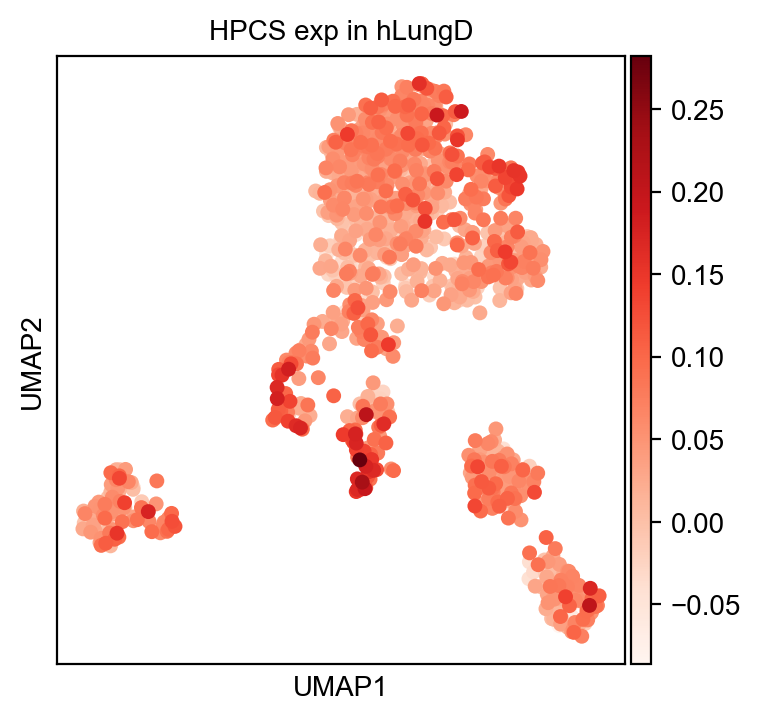

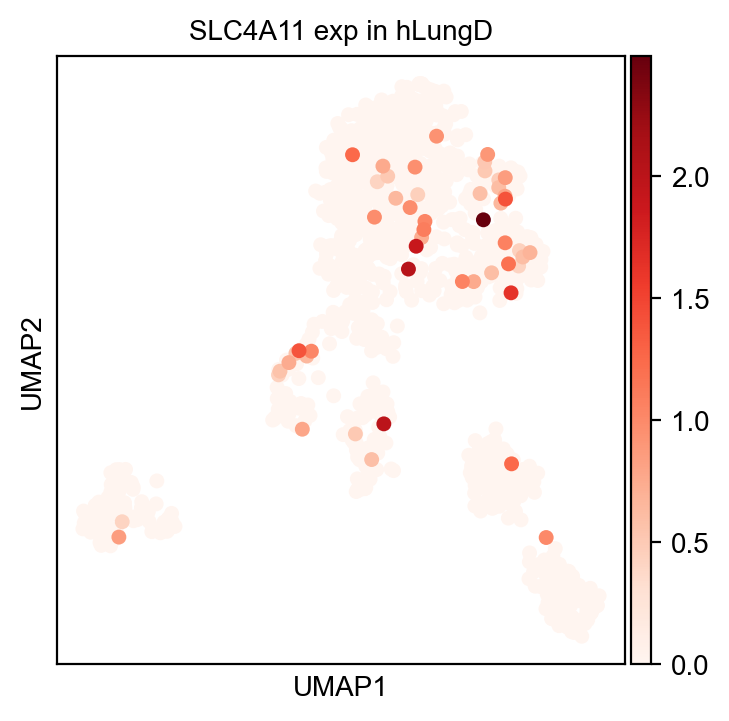

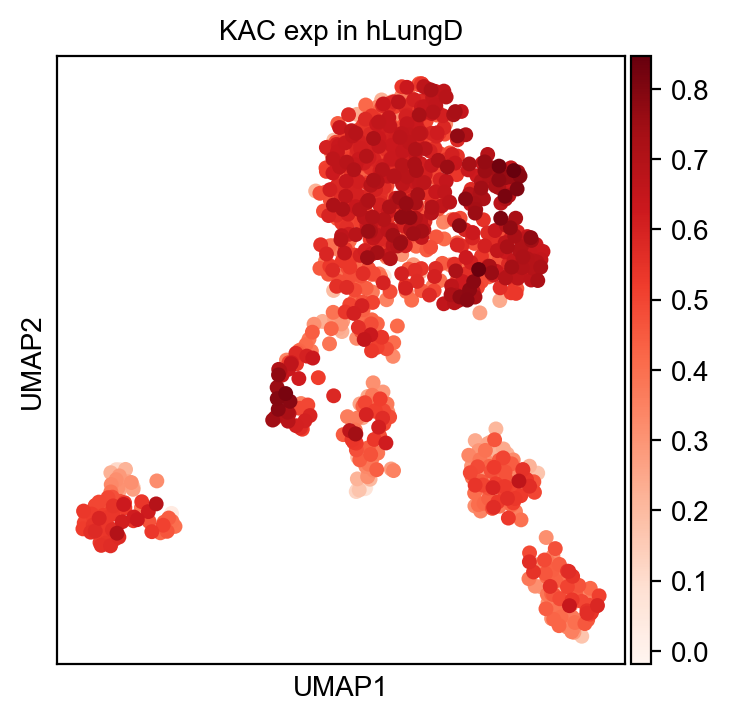

hHnN_K


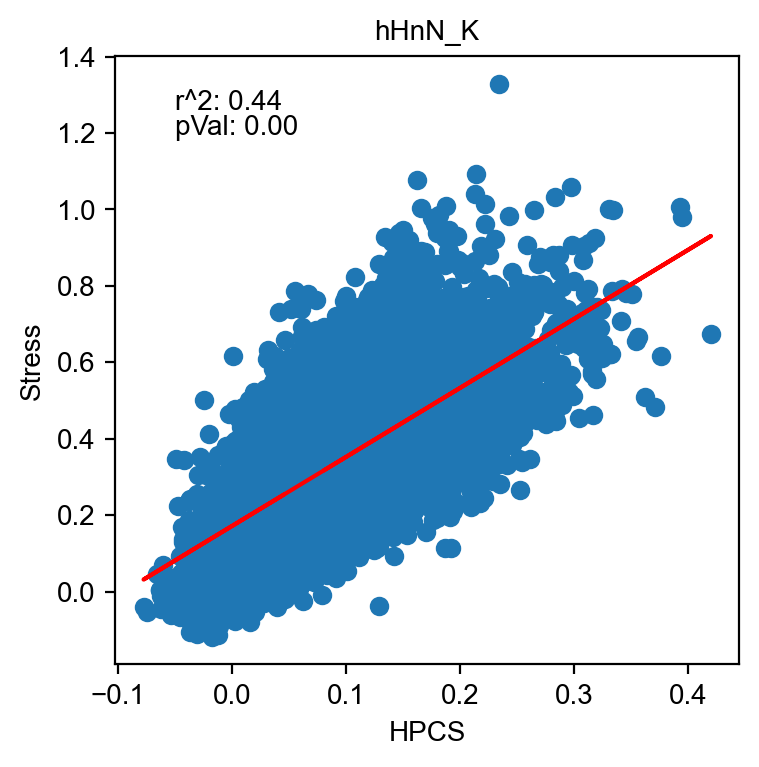

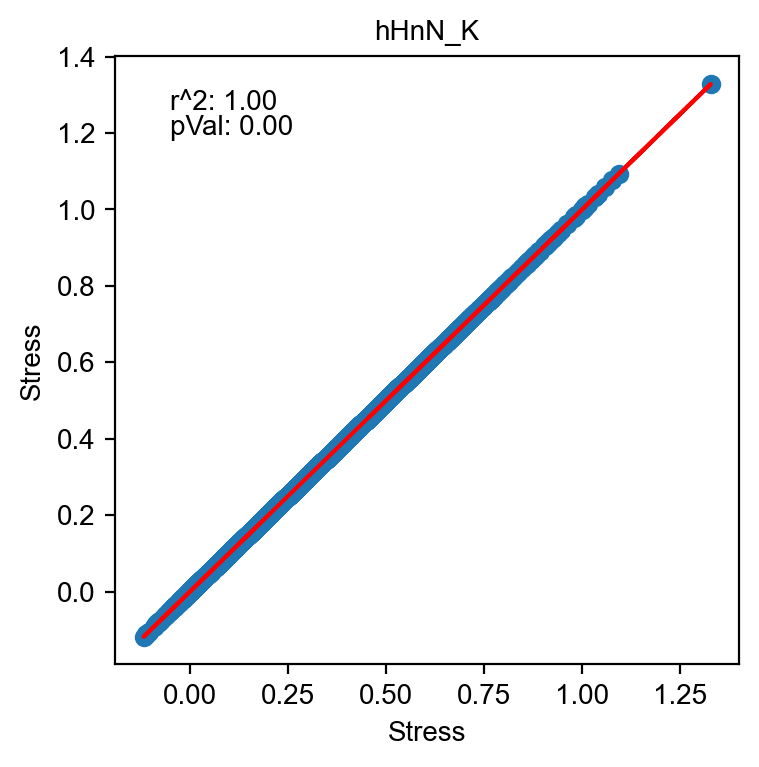

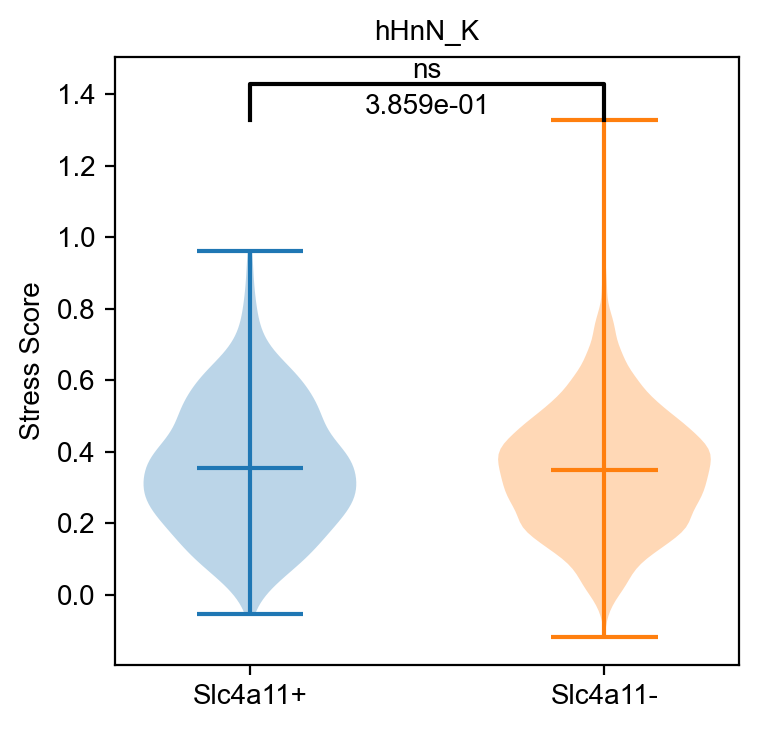

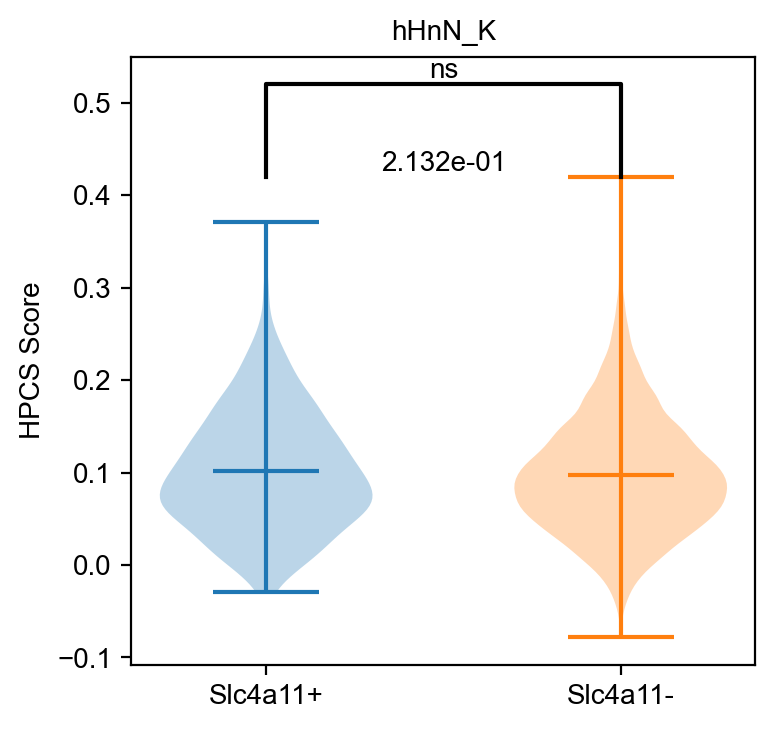

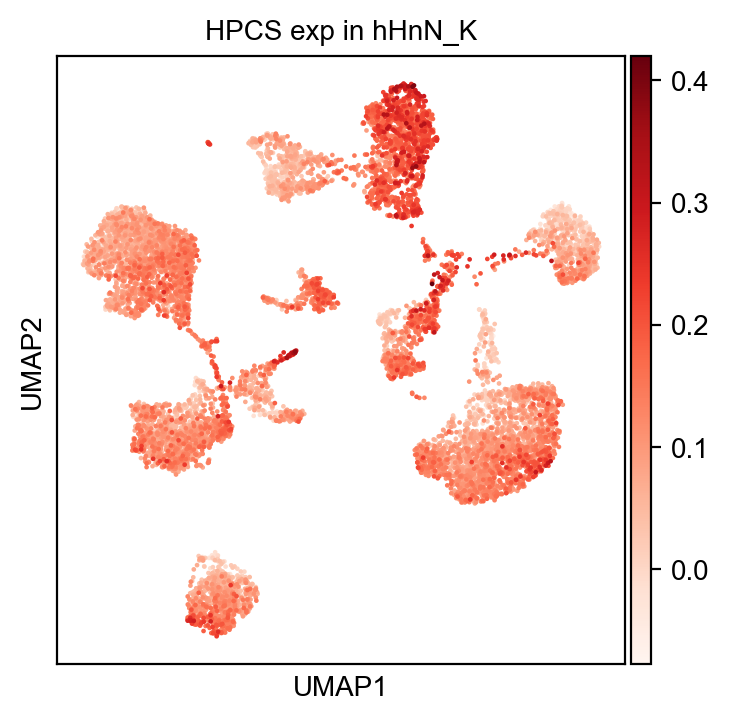

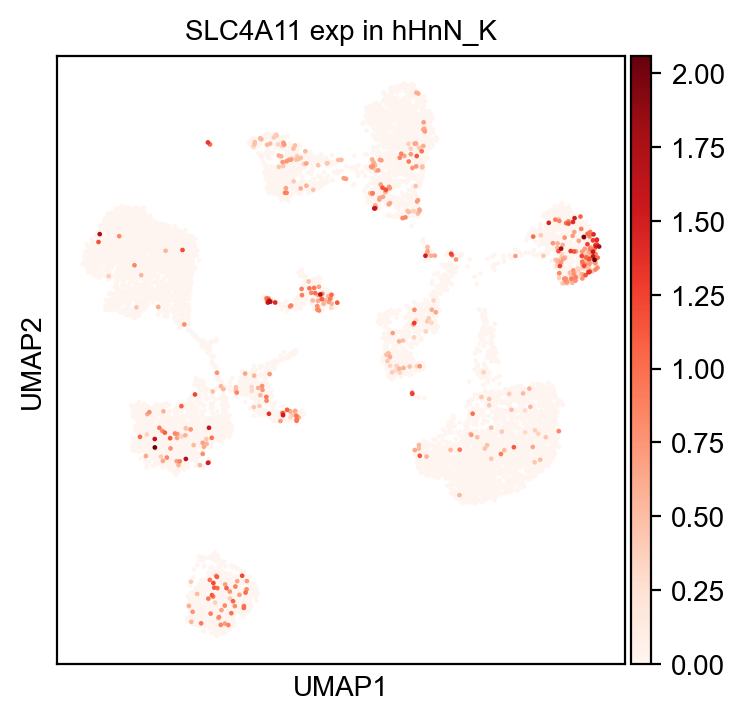

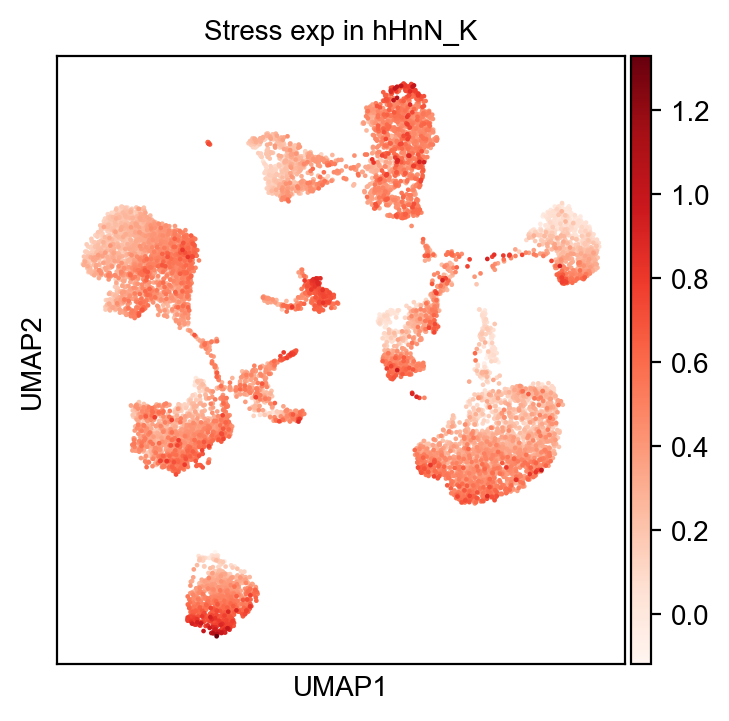

hHnN_C


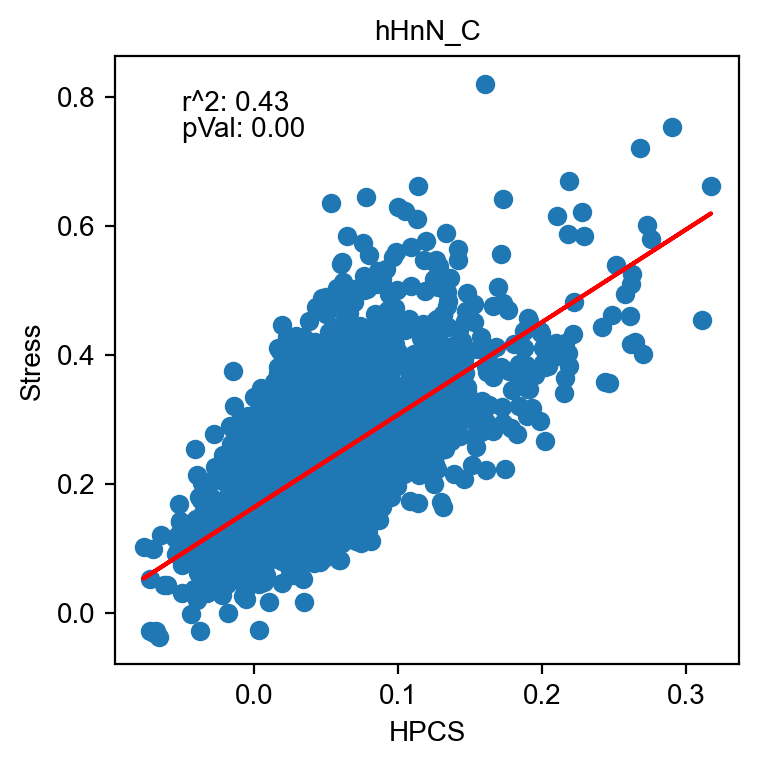

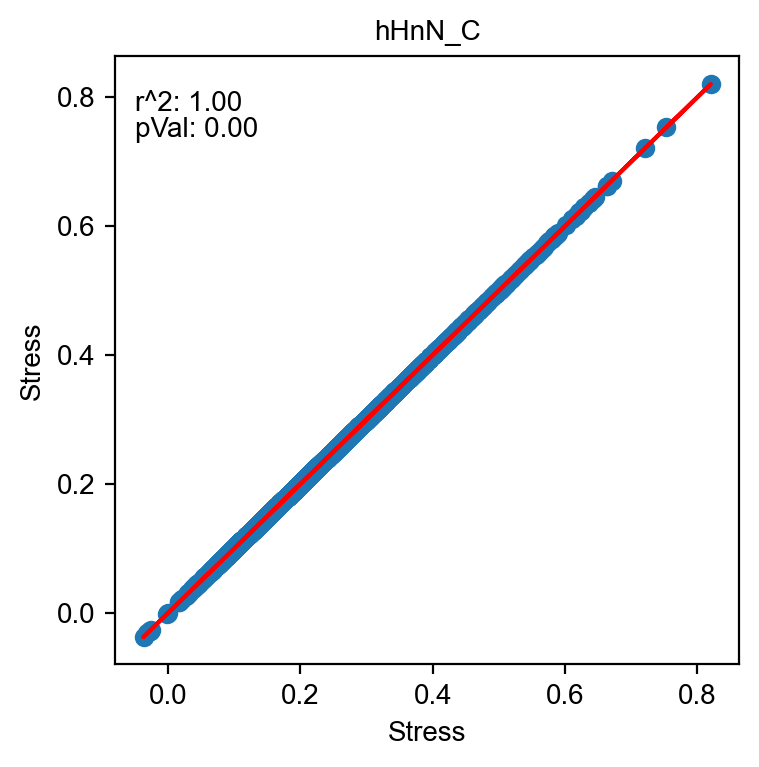

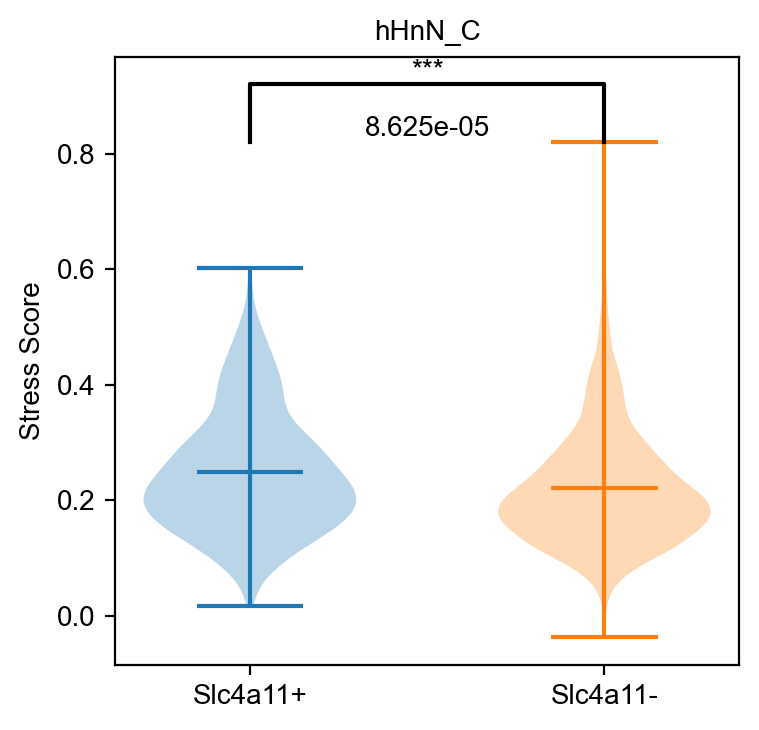

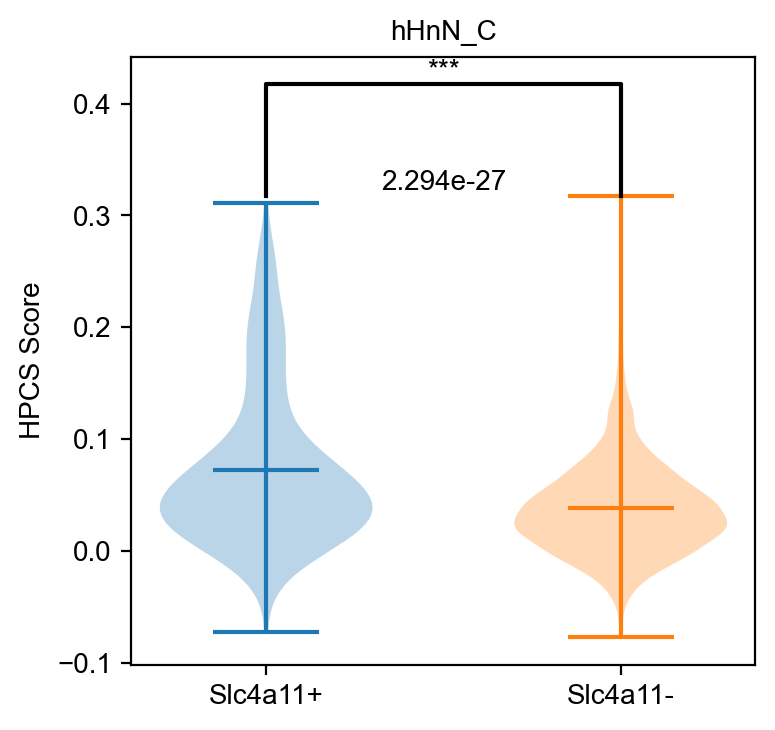

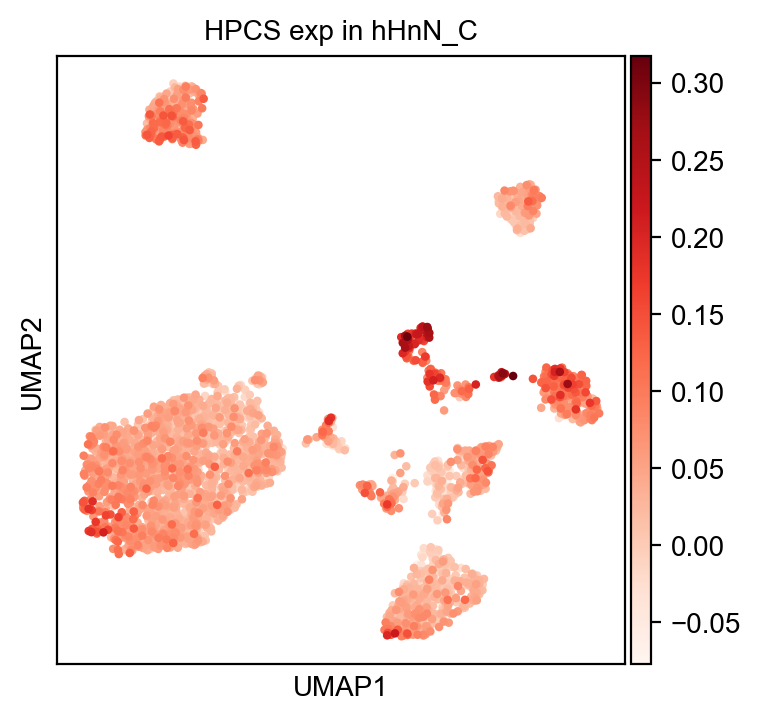

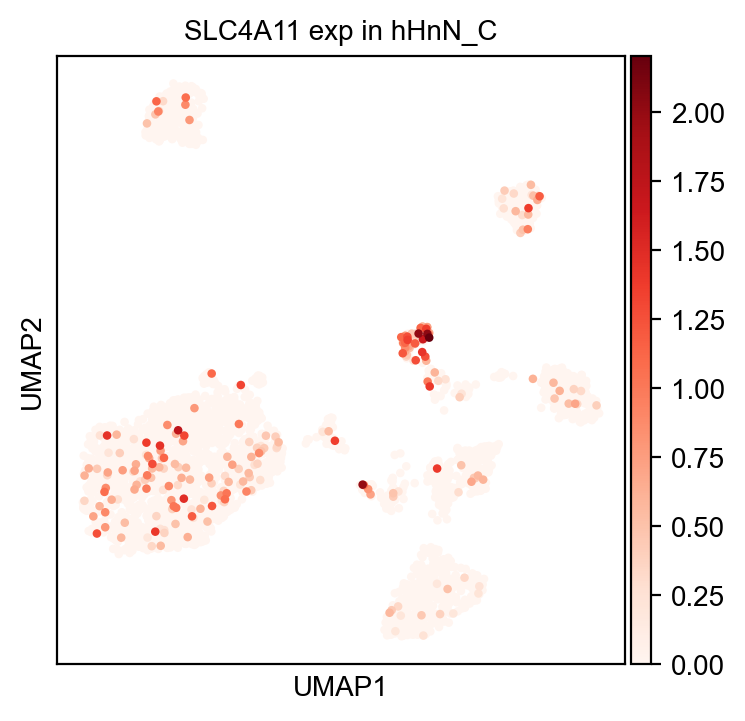

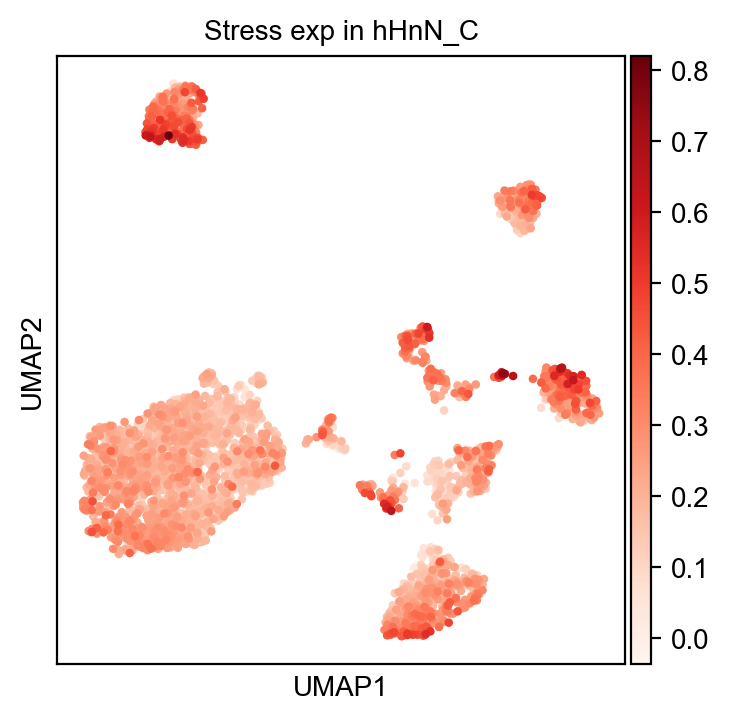

hOvar


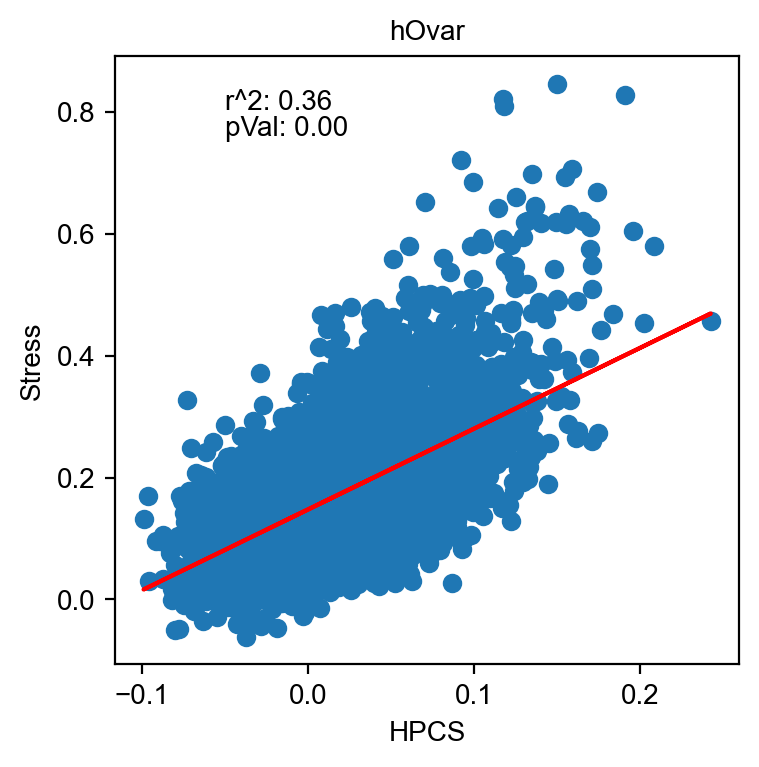

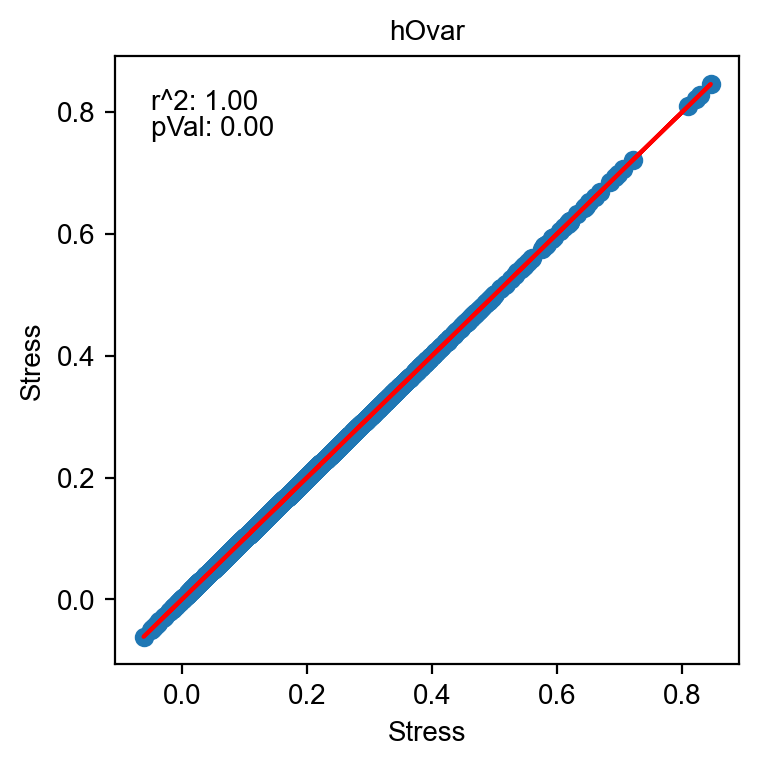

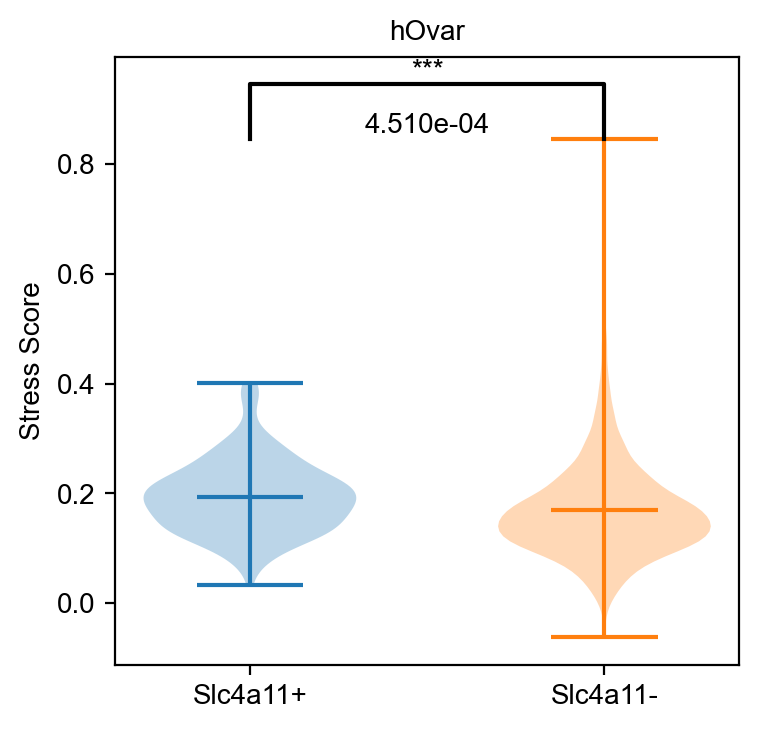

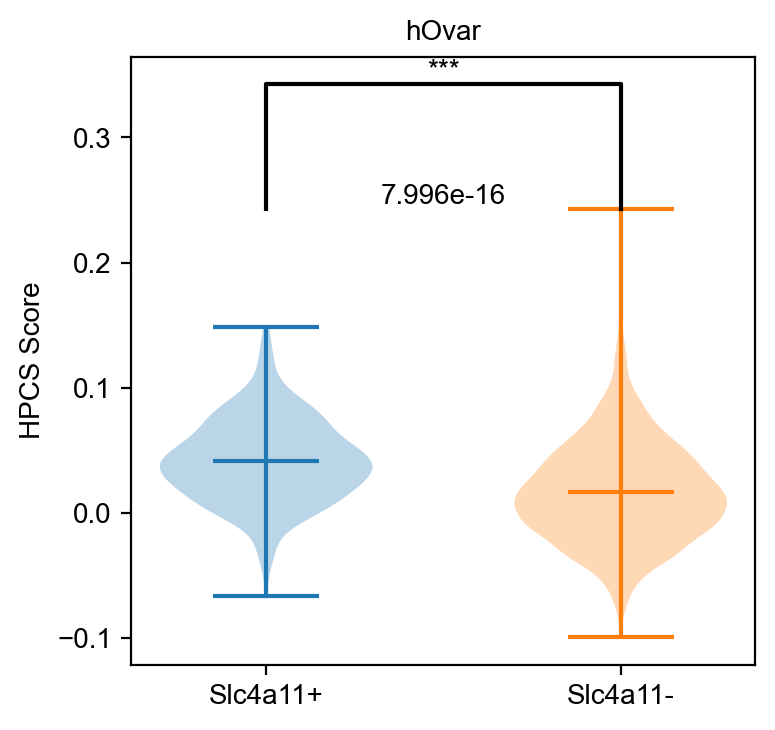

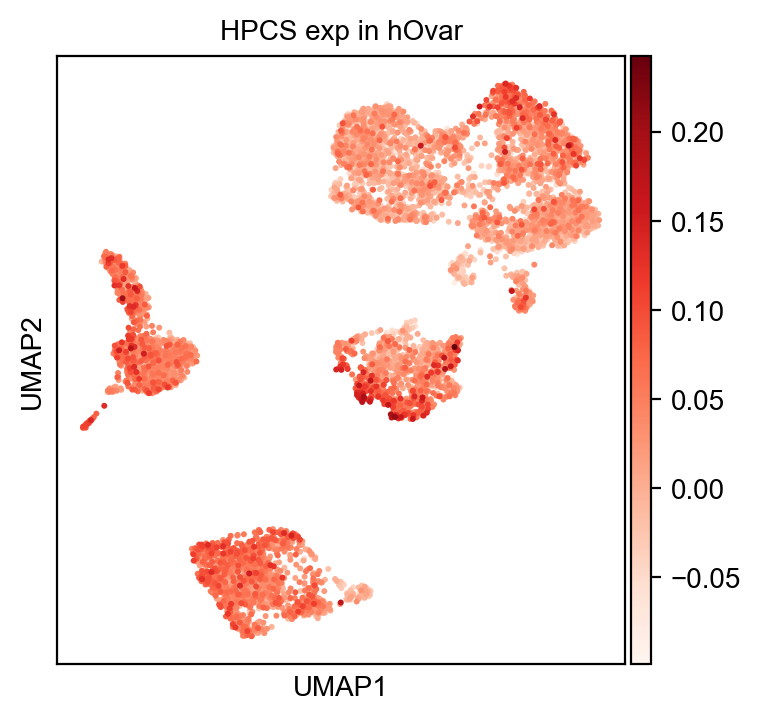

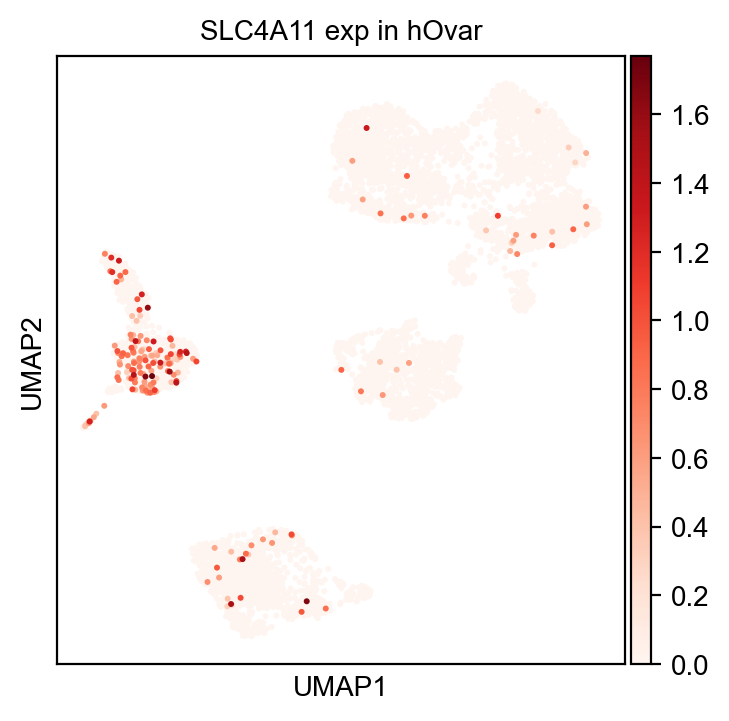

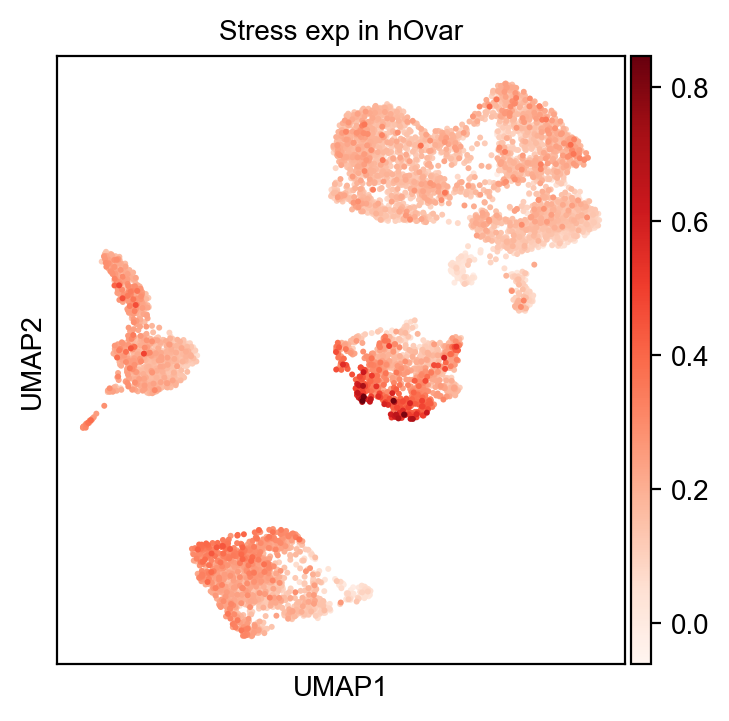

hcALL_C


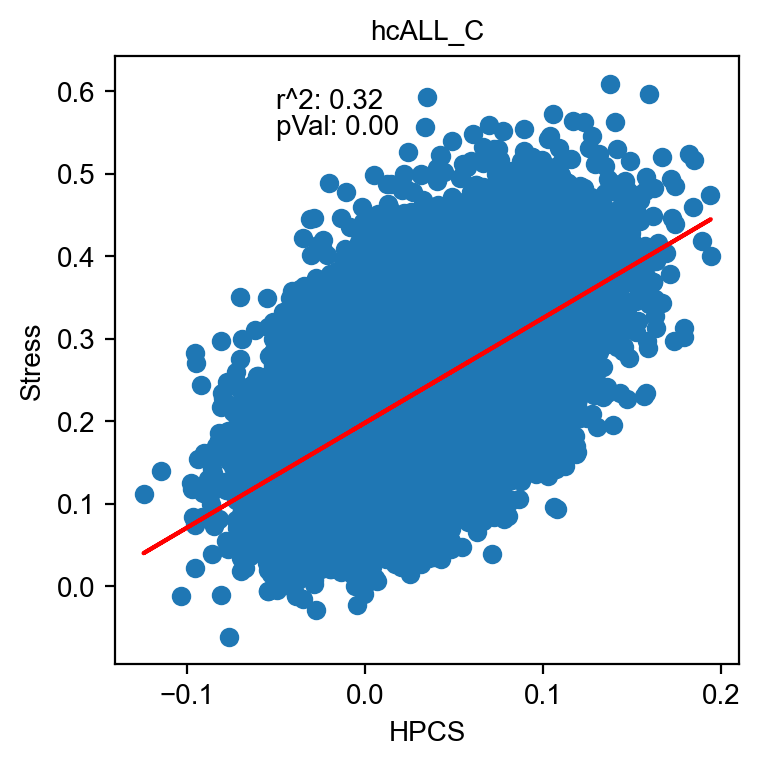

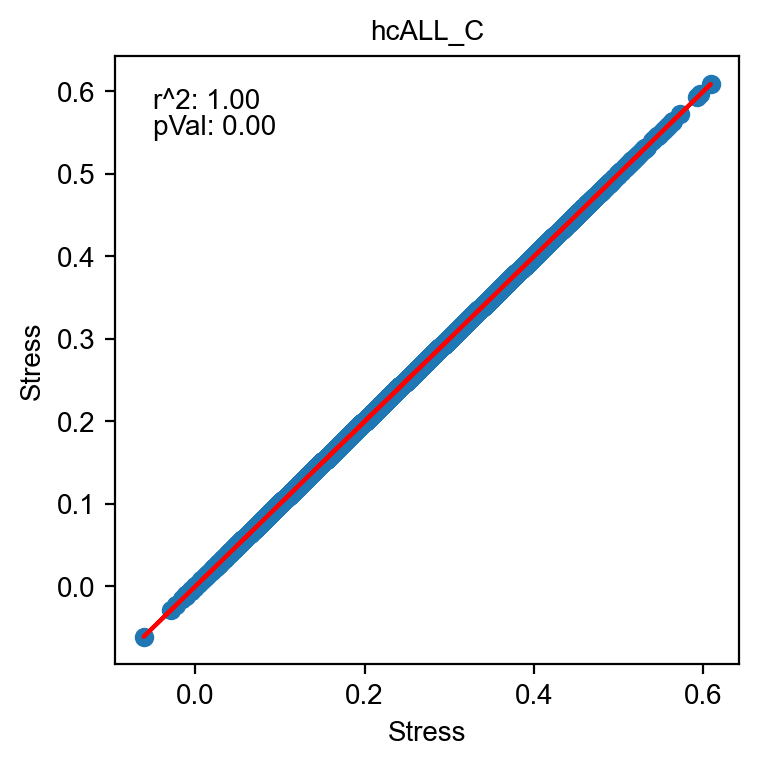

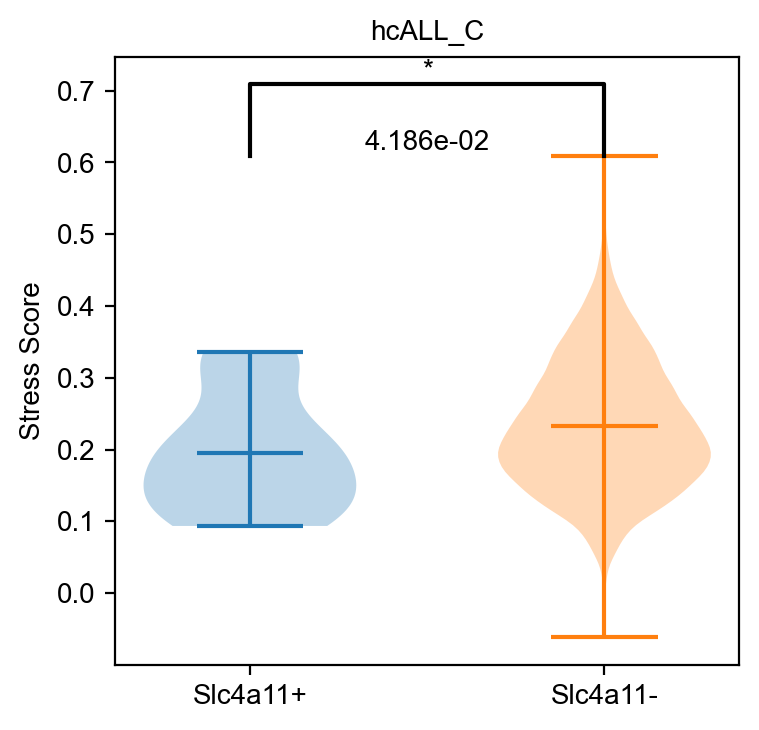

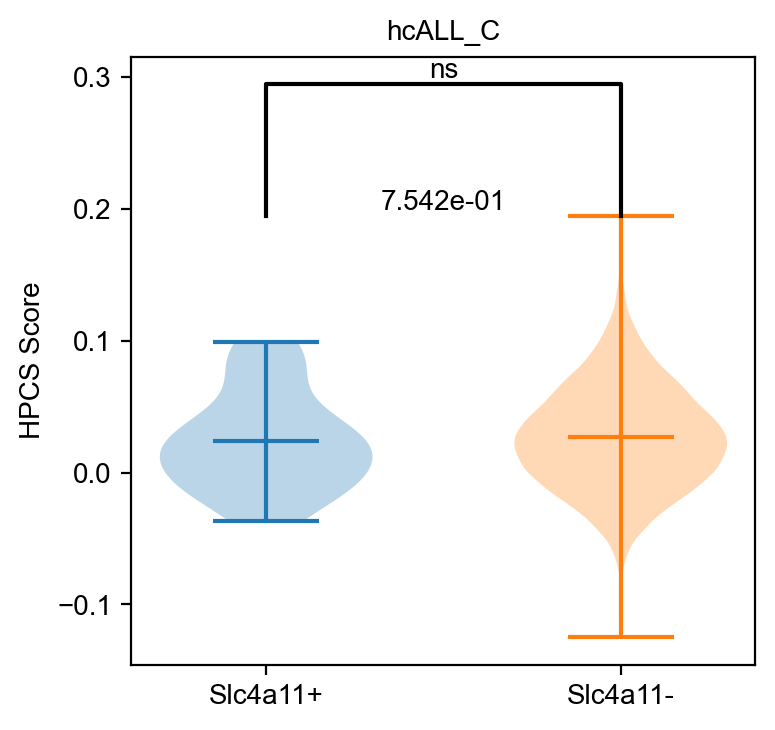

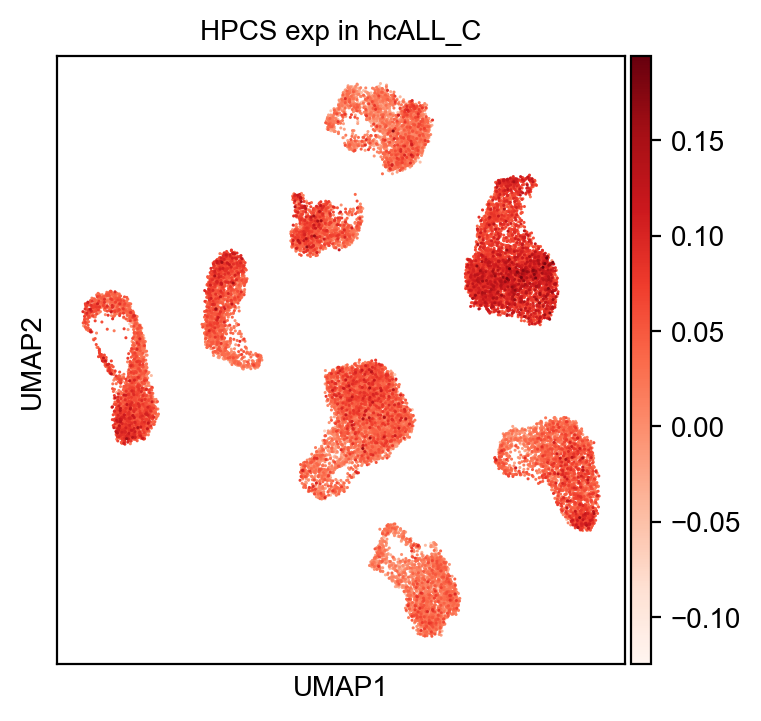

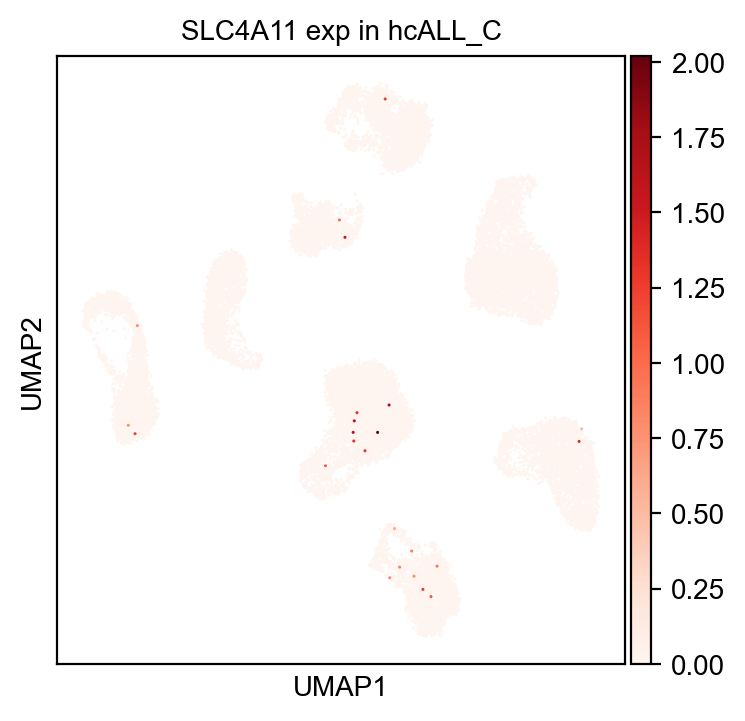

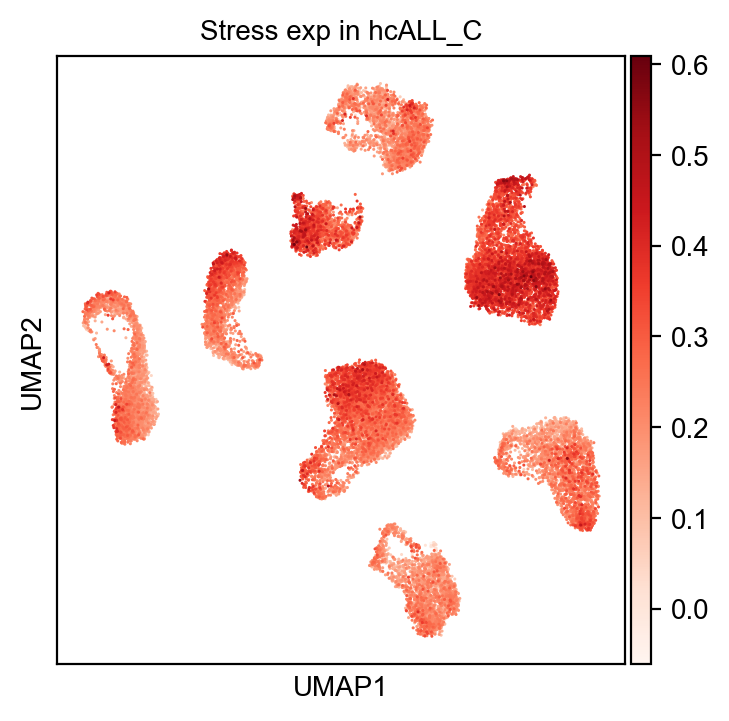

hMM_L


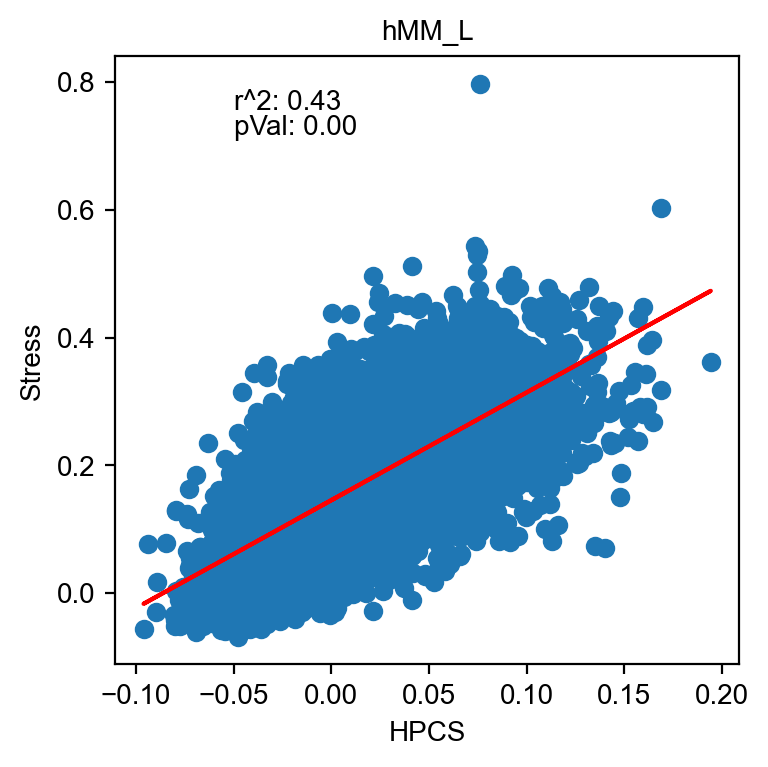

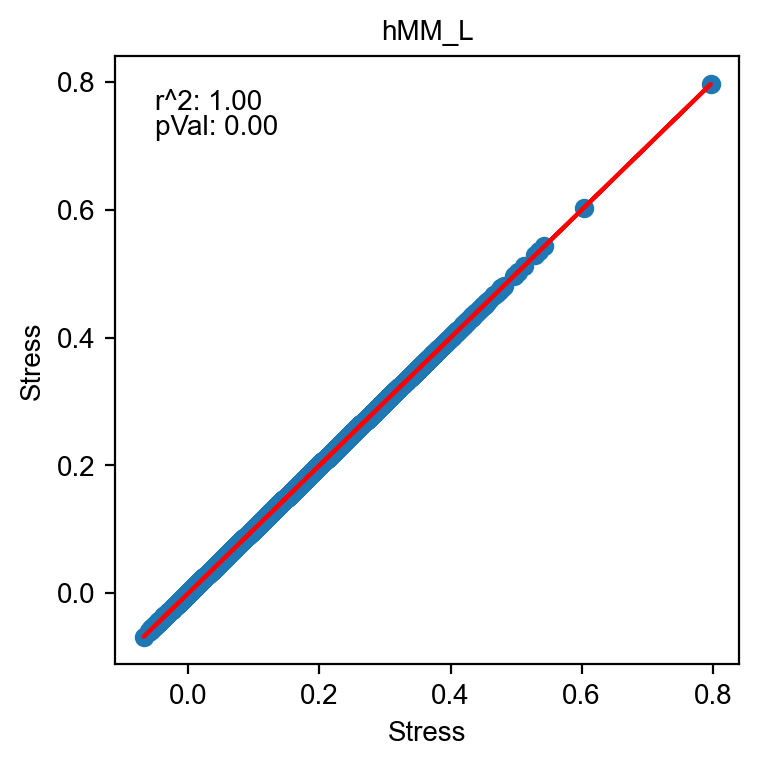

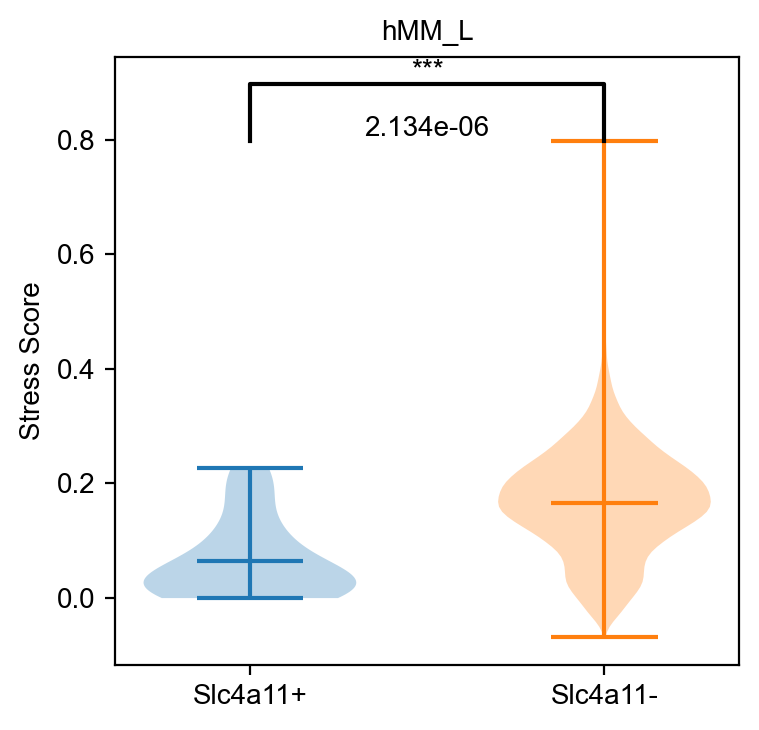

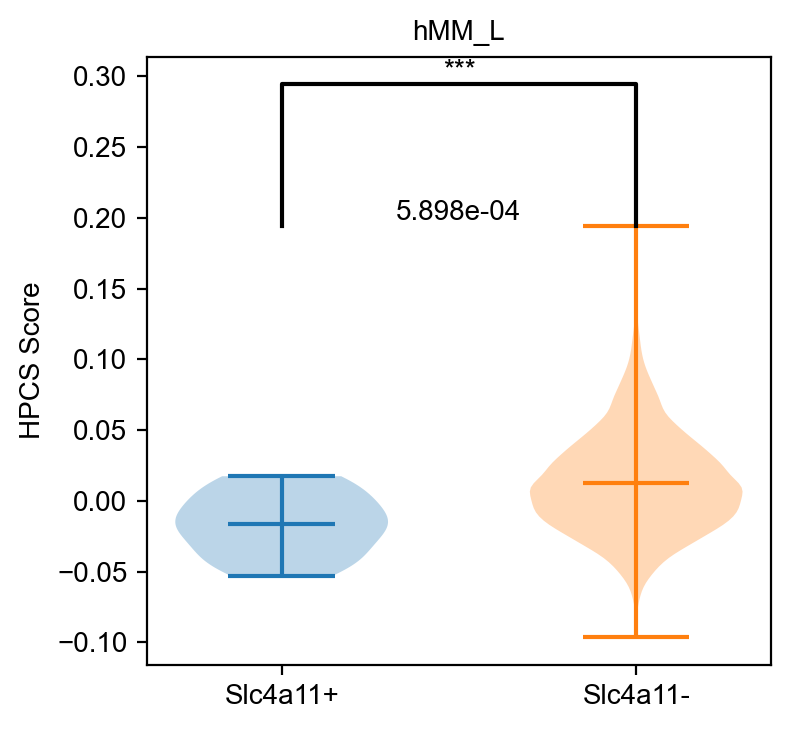

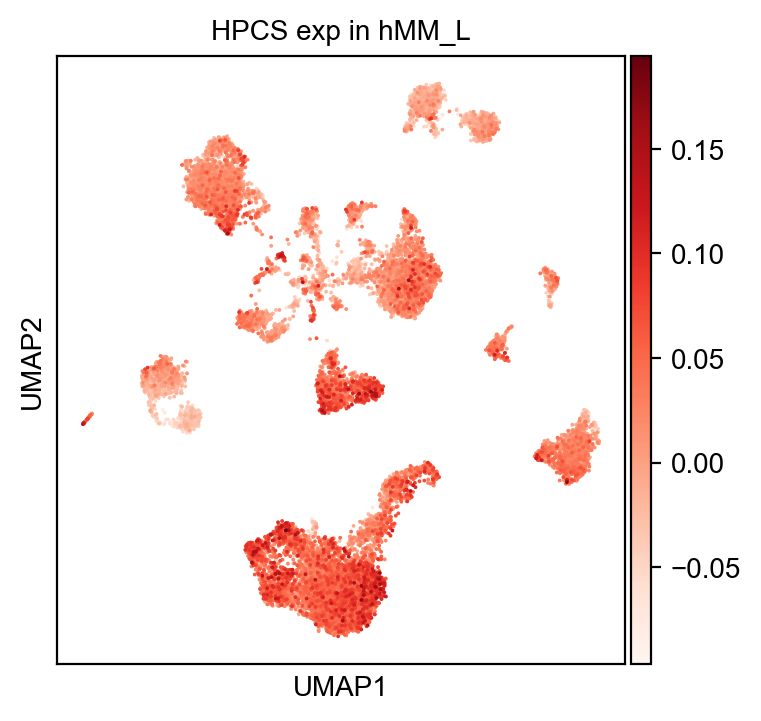

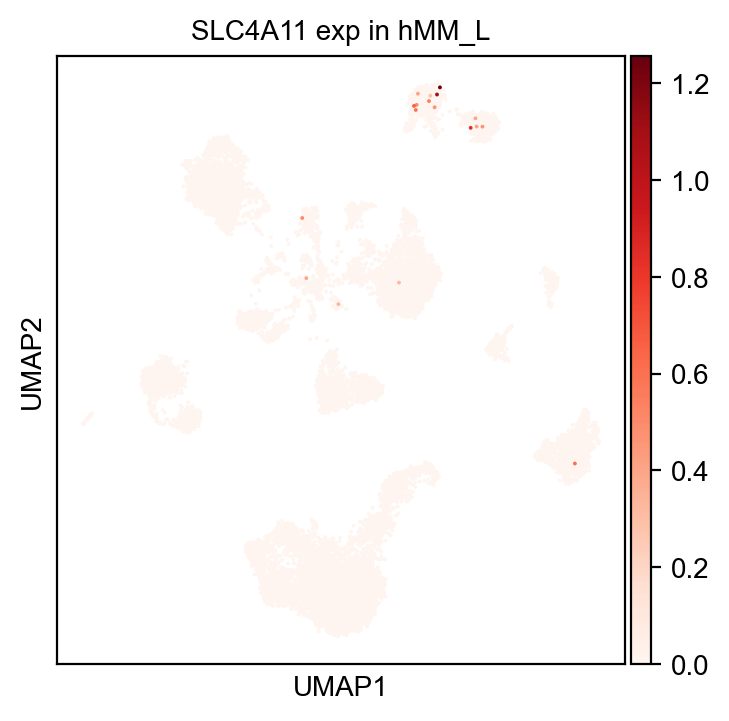

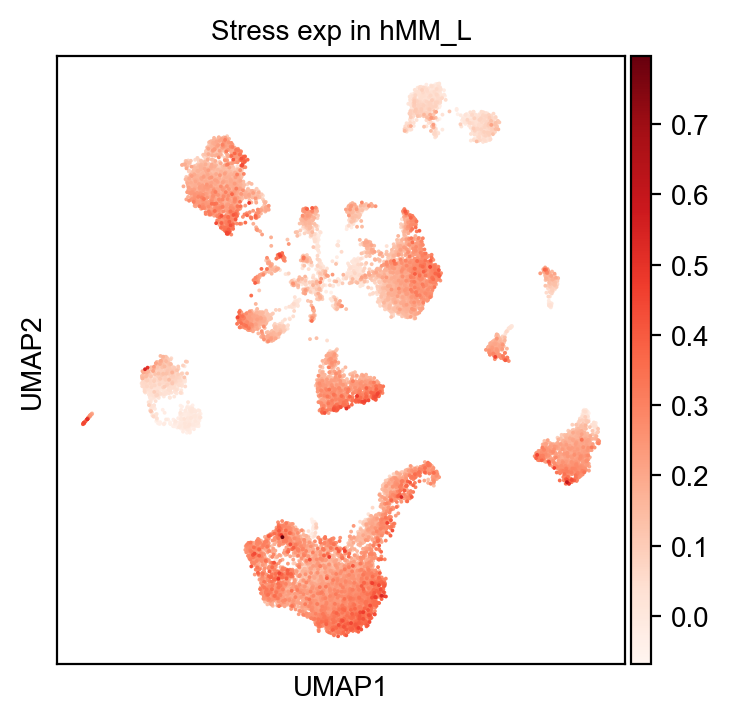

In [44]:
saveDir = "figures/revisions3"
for key in infoLabels:
    print(key)
    adataFile = infoDict[key]["file"][0]
    dfGS = infoDict[key]["gs"]
    hpcsList = infoDict[key]["hpcs"]
    adata = sc.read_h5ad(f"write/{adataFile}")
    gSig = dfGS.columns[0]
    stress = mStressGS.dropna().values.flatten()
    human=sum([g==g.upper() for g in adata.var_names])>100
    slc="Slc4a11"
    if(human):
        sc.tl.score_genes(adata, [str(gene).upper() for gene in hpcs], score_name="HPCS")
        sc.tl.score_genes(adata, [str(gene).upper() for gene in stress], score_name="Stress")
        sc.tl.score_genes(adata, [str(gene).upper() for gene in dfGS.iloc[:,0].values], score_name=gSig)
        slc="SLC4A11"
    else:
        sc.tl.score_genes(adata, hpcs, score_name="HPCS")
        sc.tl.score_genes(adata, stress, score_name="Stress")
        sc.tl.score_genes(adata, dfGS.iloc[:,0].values, score_name=gSig)
    
    plotScatter(adata.obs, "HPCS", gSig, key, save=saveDir)
    plotScatter(adata.obs, "Stress", gSig, key, save=saveDir)
    rdata = adata.raw.to_adata()
    
    if(isinstance(rdata.X, np.ndarray)):
        slcScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
    else:
        slcScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0

    plotBoxPlot(adata.obs, gSig, slcScore, key, save=saveDir)
    plotBoxPlot(adata.obs, "HPCS", slcScore, key, save=saveDir)

    colorPlot=["HPCS",slc,gSig]
    for geneSig in colorPlot:
        fig, ax = plt.subplots()
        sc.pl.umap(adata, color=[geneSig], cmap="Reds", ax=ax, title=f"{geneSig} exp in {key}")
        if(saveDir):
            fig.savefig(f"{saveDir}/{key}umap_{geneSig}.svg")


In [45]:
def getCorrDataGS(adataFiles, dfGS, hpcs=False, gene=False):
    corrScore = np.zeros((2,len(adataFiles),len(dfGS.columns)))
    cosScore = np.zeros((len(adataFiles),len(dfGS.columns)))
        
    for j,adataFile in enumerate(adataFiles):
        print(adataFile)
        adata = sc.read_h5ad(f"write/{adataFile}")
        human = sum([g == g.upper() for g in adata.var_names])>100
        if(gene):
            if(human):
                gene = gene.upper()
            rdata = adata.raw.to_adata()
            if(isinstance(rdata.X, np.ndarray)):
                geneScore = np.array(rdata[:,rdata.var_names==gene].X).flatten() 
            else:
                geneScore = np.array(rdata[:,rdata.var_names==gene].X.todense()).flatten() 
        elif(isinstance(hpcs, np.ndarray)):
            if(human):
                hpcs = np.array([str(gen).upper() for gen in hpcs])
            else:
                hpcs = np.array([gene[0]+gene[1:].lower() for gene in hpcs])
            #if(adataFile=="mouse_Pancreas_Burdziak.h5ad"):
            #    import pdb; pdb.set_trace()
            sc.tl.score_genes(adata, hpcs, score_name="HPCS")
            #print("made hpcs")
        #
        for gs in dfGS:
            gsList = dfGS[gs].dropna().values
            if(human):
                gsList = [str(gene).upper() for gene in gsList]
            sc.tl.score_genes(adata, gsList, score_name=gs)

        #import pdb;
        for i,gs in enumerate(dfGS):
            if(gene):
                corrScore[0,j,i], corrScore[1,j,i] = stats.pearsonr(geneScore, adata.obs[gs].values)
                cosScore[j,i] = cosine_similarity(geneScore.reshape(1, -1), adata.obs[gs].values.reshape(1, -1))[0][0]
            else:
                corrScore[0,j,i], corrScore[1,j,i] = stats.pearsonr(adata.obs["HPCS"].values, adata.obs[gs].values)
                cosScore[j,i] = cosine_similarity(adata.obs["HPCS"].values.reshape(1, -1), adata.obs[gs].values.reshape(1, -1))[0][0]
        #break
        
    adataNames = [adataFile.split(".")[0] for adataFile in adataFiles]
    
    corrScorePear = pd.DataFrame(corrScore[0,:,:].T, columns = adataNames, index=dfGS.columns)
    corrScoreSign = corrScore[1,:,:].T
    return(corrScorePear, corrScoreSign)

In [46]:
saveDir = "figures/revisions5"

mAllTirosh
mouse_BreastPyMT.h5ad
mouseColon11302.h5ad
mouse_Prostate.h5ad
mouse_Pancreas_Burdziak.h5ad
mouse_Pancreas_TT.h5ad
mouse_Skin_GSE261766_Pap.h5ad


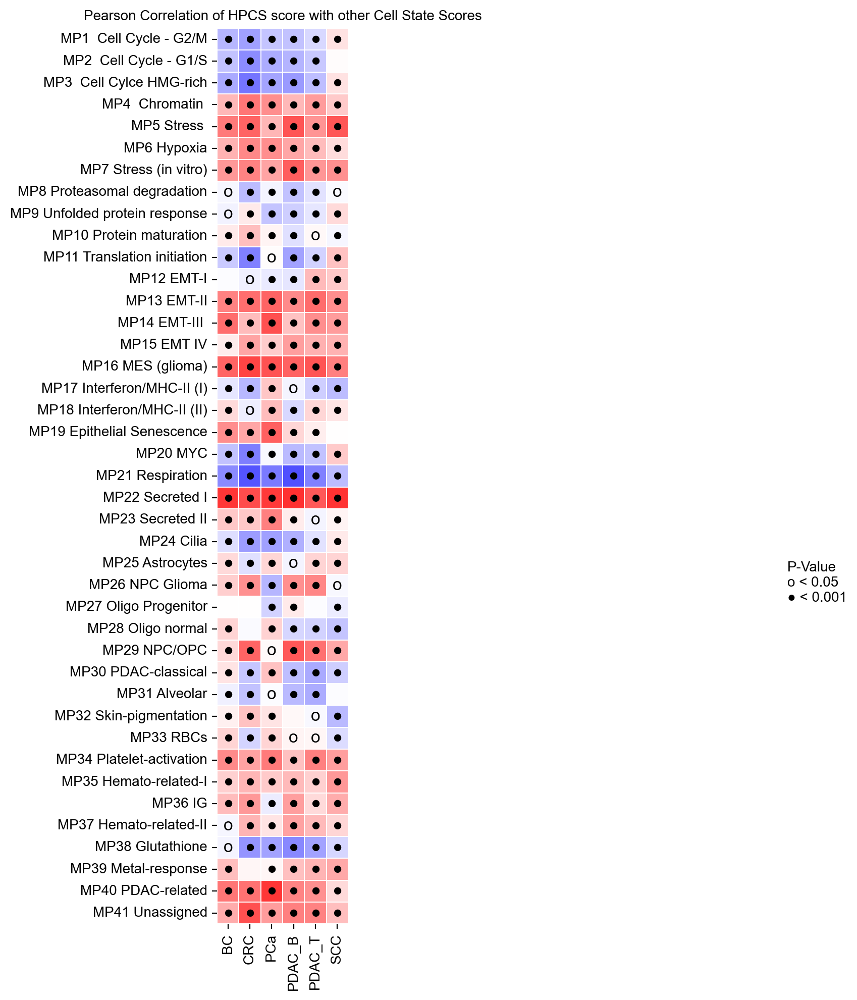

mAllYeni
mouse_BreastPyMT.h5ad
mouseColon11302.h5ad
mouse_Prostate.h5ad
mouse_Pancreas_Burdziak.h5ad
mouse_Pancreas_TT.h5ad
mouse_Skin_GSE261766_Pap.h5ad


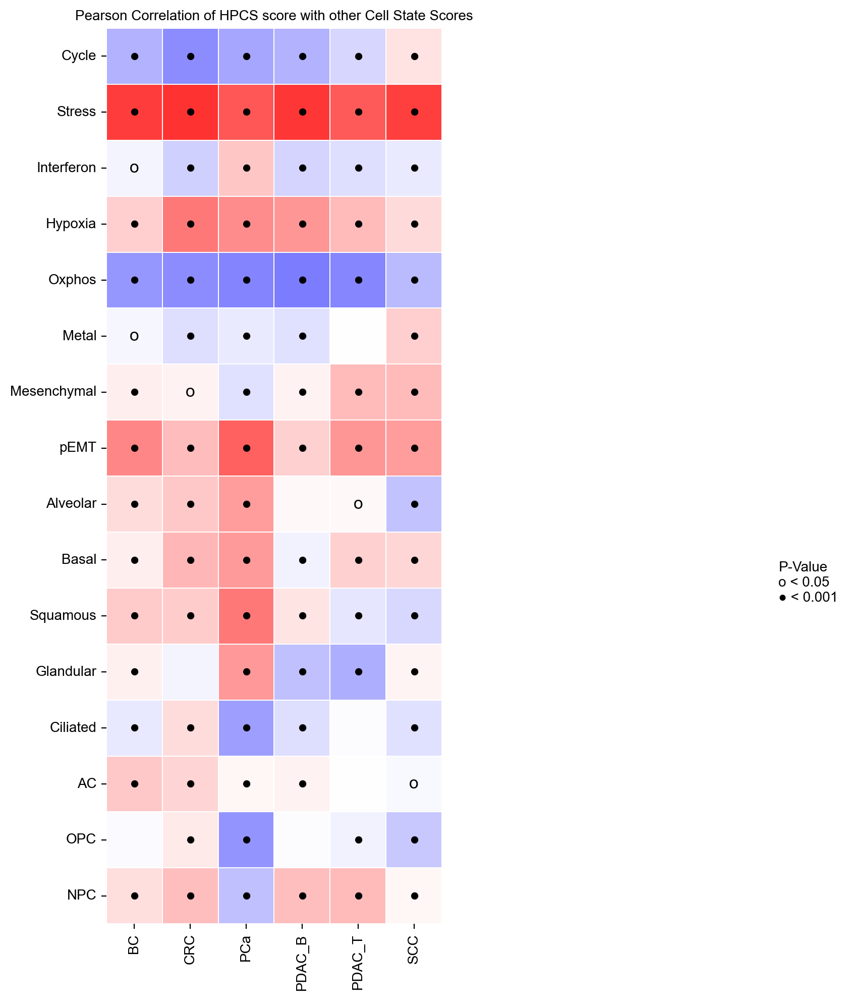

hAllTirosh
Pal2021_Breast.h5ad
Pelka2021_Colorectal.h5ad
Data_Chen2020_Head-and-Neck.h5ad
Kürten2021_Head-and-Neck.h5ad
luadBischoff.h5ad
luadDost.h5ad
luadKim.h5ad
luadMDA.h5ad
Qian2020_Ovarian.h5ad
Dong2020_Prostate.h5ad
Steele2020_Pancreas.h5ad
Ji2020_Skin.h5ad
Data_Caron2020_Hematologic.h5ad
Liu2021_Hematologic.h5ad


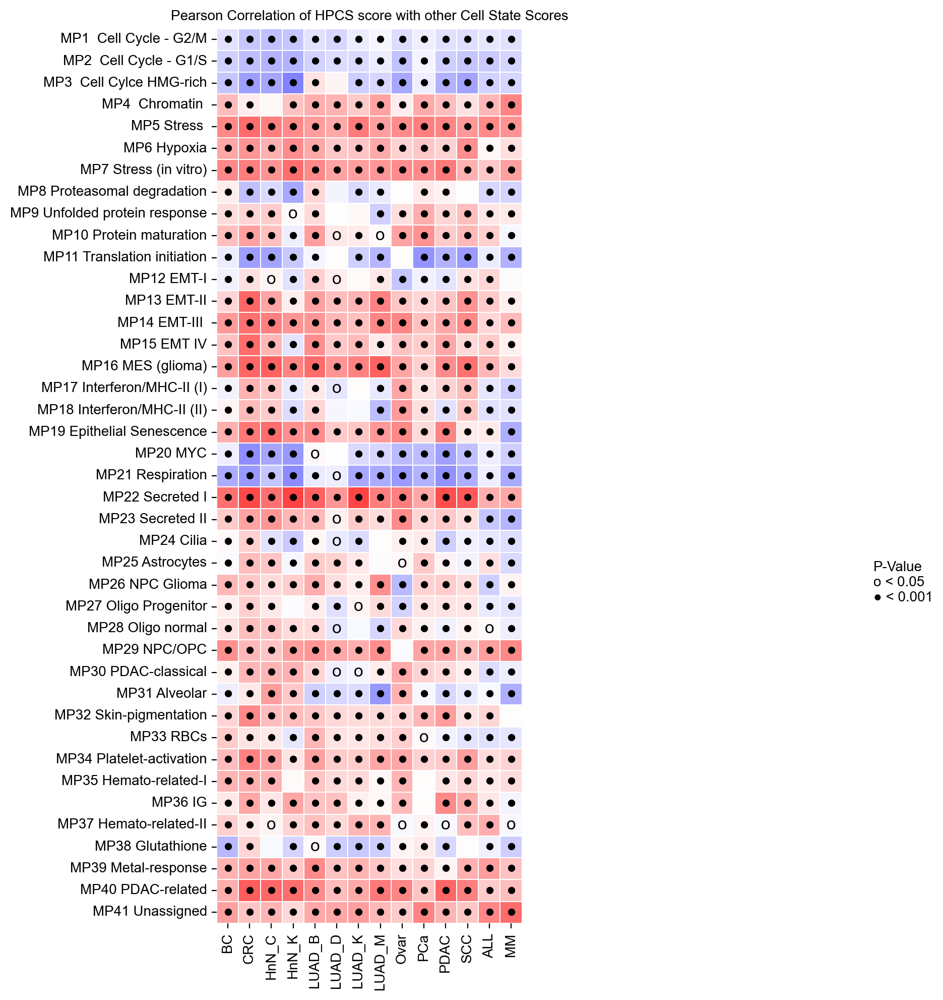

hAllYeni
Pal2021_Breast.h5ad
Pelka2021_Colorectal.h5ad
Data_Chen2020_Head-and-Neck.h5ad
Kürten2021_Head-and-Neck.h5ad
luadBischoff.h5ad
luadDost.h5ad
luadKim.h5ad
luadMDA.h5ad
Qian2020_Ovarian.h5ad
Dong2020_Prostate.h5ad
Steele2020_Pancreas.h5ad
Ji2020_Skin.h5ad
Data_Caron2020_Hematologic.h5ad
Liu2021_Hematologic.h5ad


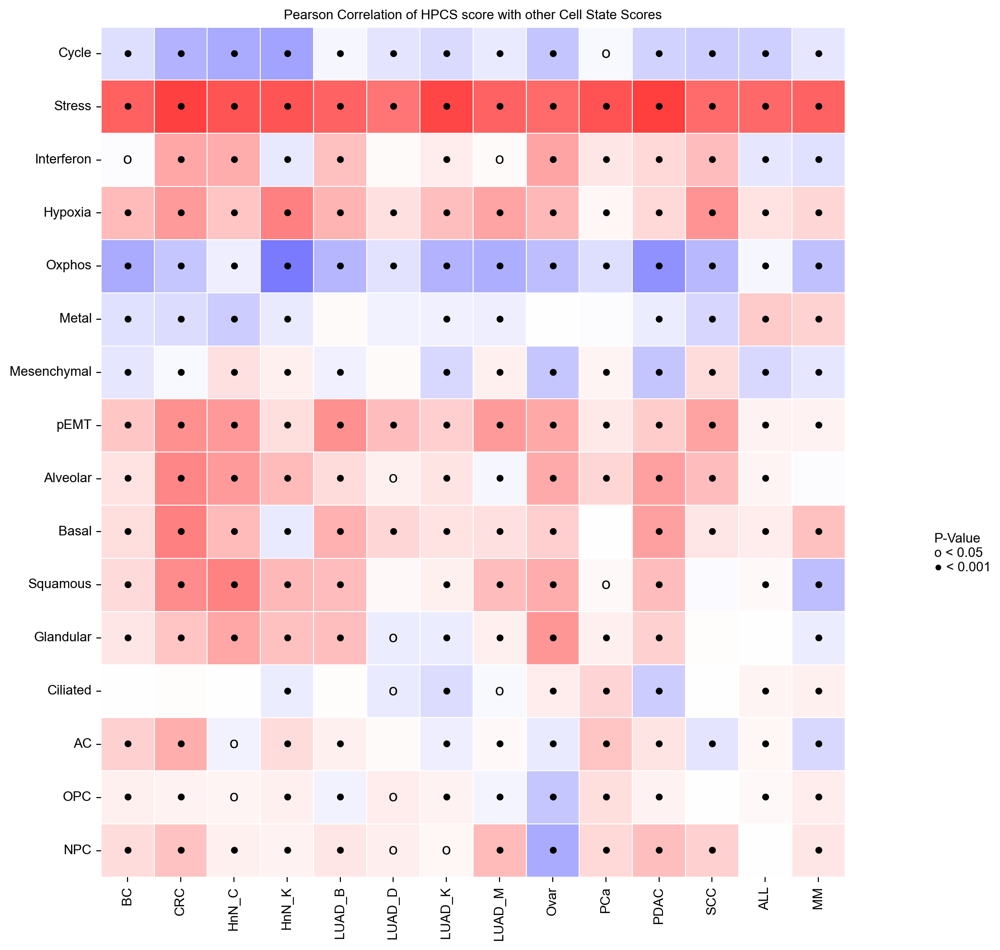

In [48]:
for i, key in enumerate(manyGS):
    print(key)
    adataFiles = infoDict[key]["file"]
    dfGS = infoDict[key]["gs"]
    hpcsList = infoDict[key]["hpcs"]
    corrScorePear, corrScoreSign = getCorrDataGS(adataFiles, dfGS, hpcsList)
    corrScorePear.columns = colNames[i]
    plotCorr(key, corrScorePear, corrScoreSign,figsize=(10,10), save=saveDir)

    

In [49]:
genes = ["Slc4a11","Plaur"]
perScores = np.zeros((2,len(infoLabels)*3,2))
avgScores = np.zeros((len(infoLabels)*3,len(genes)*2))
pvalScores = np.zeros((len(infoLabels)*3,len(genes)))

datasetNames = []
for ki, key in enumerate(infoLabels):
    genes = ["Slc4a11","Plaur"]
    print(key)
    adataFiles = infoDict[key]["file"]
    dfGS = infoDict[key]["gs"]
    hpcsList = infoDict[key]["hpcs"]
    datasetNames.append(f"{key}-{dfGS.columns[0]}")
    datasetNames.append(f"{key}-HPCS")
    datasetNames.append(f"{key}-stress")

    adata = sc.read_h5ad(f"write/{adataFiles[0]}")
    human=sum([g==g.upper() for g in adata.var_names])>100
    rdata = adata.raw.to_adata()
    
    gSig = dfGS.columns[0]
    
    if(human):
        sc.tl.score_genes(adata, [str(gene).upper() for gene in hpcs], score_name="HPCS")
        sc.tl.score_genes(adata, [str(gene).upper() for gene in stress], score_name="Stress")
        sc.tl.score_genes(adata, [str(gene).upper() for gene in dfGS.iloc[:,0].values], score_name=gSig)
        genes = [g.upper() for g in genes]
    else:
        sc.tl.score_genes(adata, hpcs, score_name="HPCS")
        sc.tl.score_genes(adata, stress, score_name="Stress")
        sc.tl.score_genes(adata, dfGS.iloc[:,0].values, score_name=gSig)
    
    if("HPCS" not in dfGS.columns):
        dfGS = dfGS.join(pd.DataFrame(hpcsList, columns=["HPCS"]))    
    if("stress" not in dfGS.columns):
        dfGS = dfGS.join(pd.DataFrame(stress, columns=["stress"]))

    for gi, gene in enumerate(genes):
        corrOut = getCorrDataGS(adataFiles, dfGS, hpcs=False, gene=gene)
        
        perScores[0,ki*3,gi], perScores[1,ki*3,gi] = corrOut[0].values[0][0], corrOut[1][0][0]
        perScores[0,ki*3+1,gi], perScores[1,ki*3+1,gi] = corrOut[0].values[1][0], corrOut[1][1][0]
        perScores[0,ki*3+2,gi], perScores[1,ki*3+2,gi] = corrOut[0].values[2][0], corrOut[1][2][0]

        if(isinstance(rdata.X, np.ndarray)):
            geneExp = np.array(rdata[:,rdata.var_names==gene].X).flatten() > 0
        else:
            geneExp = np.array(rdata[:,rdata.var_names==gene].X.todense()).flatten() > 0

        for gsi,gs in enumerate([gSig, "HPCS", "Stress"]):
        
            geneExpPos = adata.obs[gs][geneExp]
            geneExpNeg = adata.obs[gs][np.logical_not(geneExp)]
            
            avgScores[ki*3+gsi,gi*2] = np.mean(geneExpPos)
            avgScores[ki*3+gsi,gi*2+1] = np.mean(geneExpNeg)
    
            t_stat, p_val = stats.ttest_ind(geneExpPos, geneExpNeg)
            pvalScores[ki*3+gsi,gi] = p_val

        

        #avgScores[ki*3+1,gi*2] = np.mean(adata.obs["HPCS"][geneExp])
        #avgScores[ki*3+1,gi*2+1] = np.mean(adata.obs["HPCS"][np.logical_not(geneExp)])

        #avgScores[ki*3+2,gi*2] = np.mean(adata.obs["Stress"][geneExp])
        #avgScores[ki*3+2,gi*2+1] = np.mean(adata.obs["Stress"][np.logical_not(geneExp)])

        
perCorrs = pd.DataFrame(perScores[0,:,:], index=datasetNames, columns=genes)

mColon
mouseColon11302.h5ad
mouseColon11302.h5ad
mSkin
mouse_Skin_GSE261766_Pap.h5ad
mouse_Skin_GSE261766_Pap.h5ad
mProstate
mouse_Prostate.h5ad
mouse_Prostate.h5ad
mPancreas
mouse_Pancreas_TT.h5ad
mouse_Pancreas_TT.h5ad
mPancreasB
mouse_Pancreas_Burdziak.h5ad
mouse_Pancreas_Burdziak.h5ad
hColon
Pelka2021_Colorectal.h5ad
Pelka2021_Colorectal.h5ad
hSkin
Ji2020_Skin.h5ad
Ji2020_Skin.h5ad
hProstate
Dong2020_Prostate.h5ad
Dong2020_Prostate.h5ad
hPancreas
Steele2020_Pancreas.h5ad
Steele2020_Pancreas.h5ad
hLungM
luadMDA.h5ad
luadMDA.h5ad
hLungK
luadKim.h5ad
luadKim.h5ad
hLungB
luadBischoff.h5ad
luadBischoff.h5ad
hLungD
luadDost.h5ad
luadDost.h5ad
hHnN_K
Kürten2021_Head-and-Neck.h5ad
Kürten2021_Head-and-Neck.h5ad
hHnN_C
Data_Chen2020_Head-and-Neck.h5ad
Data_Chen2020_Head-and-Neck.h5ad
hOvar
Qian2020_Ovarian.h5ad
Qian2020_Ovarian.h5ad
hcALL_C
Data_Caron2020_Hematologic.h5ad
Data_Caron2020_Hematologic.h5ad
hMM_L
Liu2021_Hematologic.h5ad
Liu2021_Hematologic.h5ad


/tmp/ipykernel_1574964/505867060.py:15: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


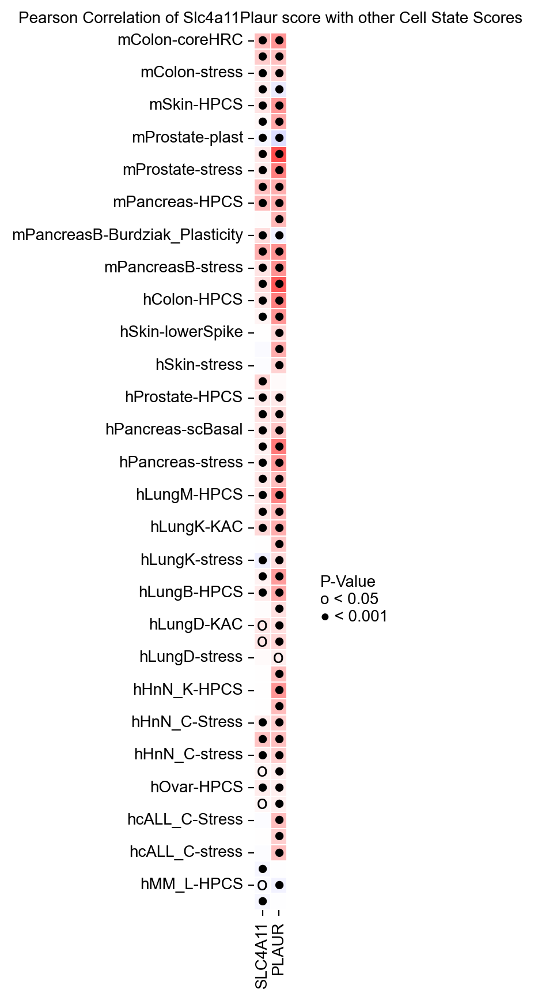

In [50]:
plotCorr("PearCorrGenesFull", perCorrs, perScores[1,:,:], corrName="Slc4a11Plaur", figsize=(1,10), save=saveDir)

In [51]:
from sklearn import preprocessing

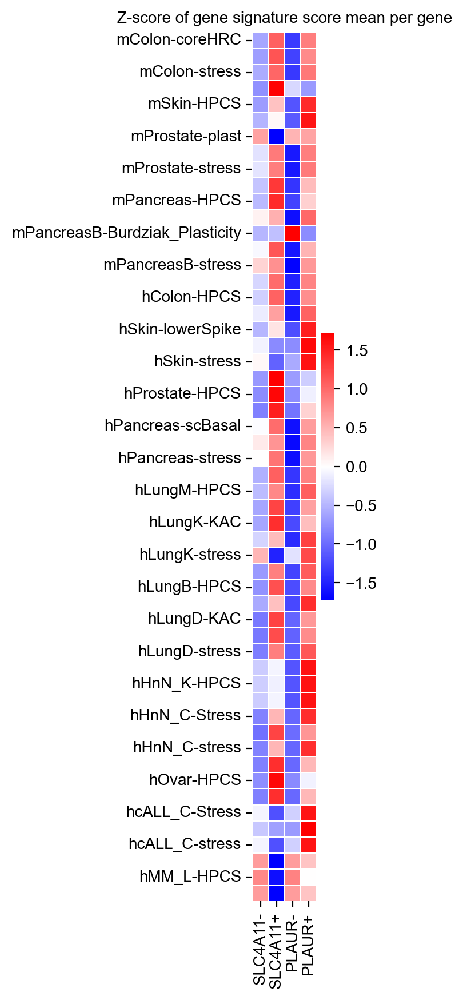

In [52]:
scaler = preprocessing.StandardScaler().fit_transform(avgScores.T)
avgScoresDF = pd.DataFrame(scaler[[1,0,3,2]].T, index=datasetNames, columns=['SLC4A11-', 'SLC4A11+', 'PLAUR-','PLAUR+']) #

fig, ax = plt.subplots(figsize=(1,10)) 
plt.grid(False)
sns.heatmap(avgScoresDF, cmap="bwr", xticklabels=True, ax=ax, square=True, linewidths=0.1, cbar=True)#, vmax=-1*np.min(scaler))

ax.set_title(f"Z-score of gene signature score mean per gene")
ax.tick_params(axis='y', labelrotation=0)
#fig.tight_layout()
plt.show()
fig.savefig(f"{saveDir}/zscoreGsSlc4a11Palur.svg")

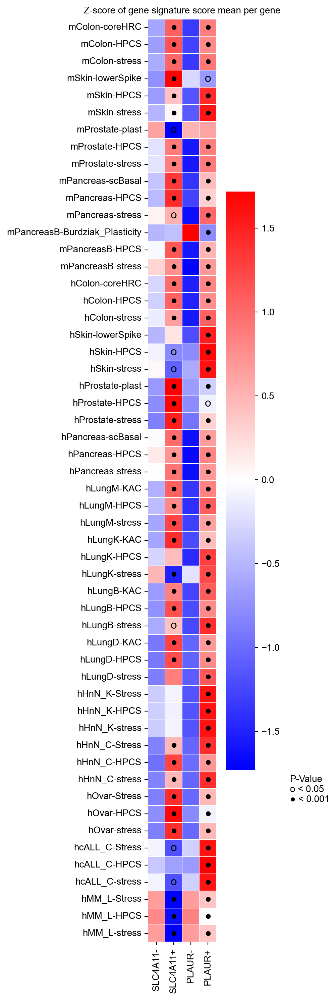

In [53]:
scaler = preprocessing.StandardScaler().fit_transform(avgScores.T)
avgScoresDF = pd.DataFrame(scaler[[1,0,3,2]].T, index=datasetNames, columns=['SLC4A11-', 'SLC4A11+', 'PLAUR-','PLAUR+']) #

fig, ax = plt.subplots(figsize=(4,15)) 
plt.grid(False)
sns.heatmap(avgScoresDF, cmap="bwr", xticklabels=True, ax=ax, square=True, linewidths=0.1, cbar=True)#, vmax=-1*np.min(scaler))

for (i, j), significant in np.ndenumerate(pvalScores):
    #print(i,j)
    if significant < 0.001:
        plt.text(j*2 + 1.5, i + 0.5, "●", color='black', ha='center', va='center', fontsize=12)
    elif significant < 0.05:
        plt.text(j*2 + 1.5, i + 0.5, 'o', color='black', ha='center', va='center', fontsize=12)
    
ax.set_title(f"Z-score of gene signature score mean per gene")
ax.tick_params(axis='y', labelrotation=0)
fig.text(1, 0.2, f"P-Value\no < 0.05\n● < 0.001")
fig.tight_layout()
plt.show()
fig.savefig(f"{saveDir}/zscoreGsSlc4a11PalurPval.svg")

In [54]:
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["font.family"] = "Arial"

In [55]:
key = "mProstate"
adataFile = infoDict[key]["file"][0]
dfGS = infoDict[key]["gs"]
hpcsList = infoDict[key]["hpcs"]

In [56]:
adata = sc.read_h5ad(f"write/{adataFile}")
gSig = dfGS.columns[0]

sc.tl.score_genes(adata, hpcs, score_name="HPCS")
sc.tl.score_genes(adata, dfGS.iloc[:,0].values, score_name=gSig)
sc.tl.score_genes(adata, [g.upper() for g in stress], score_name="Stress")

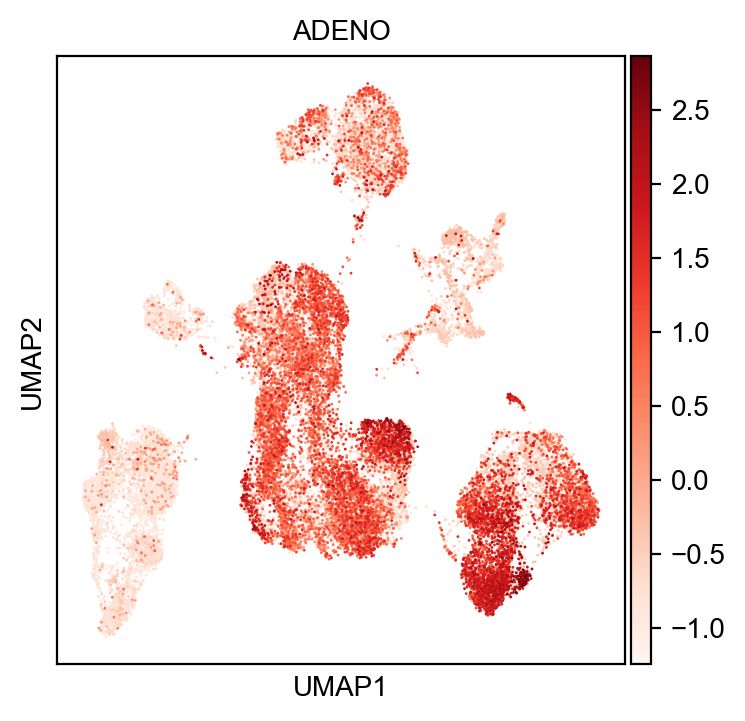

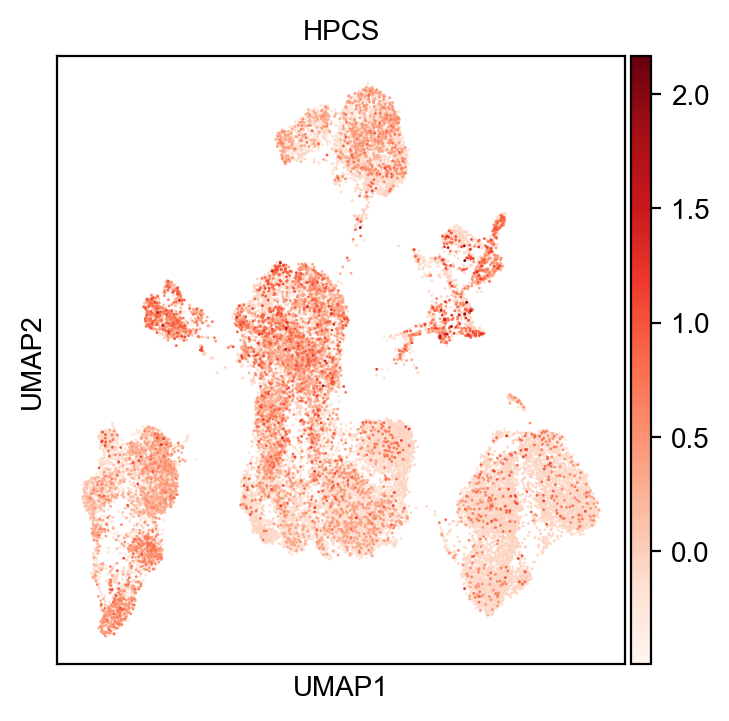

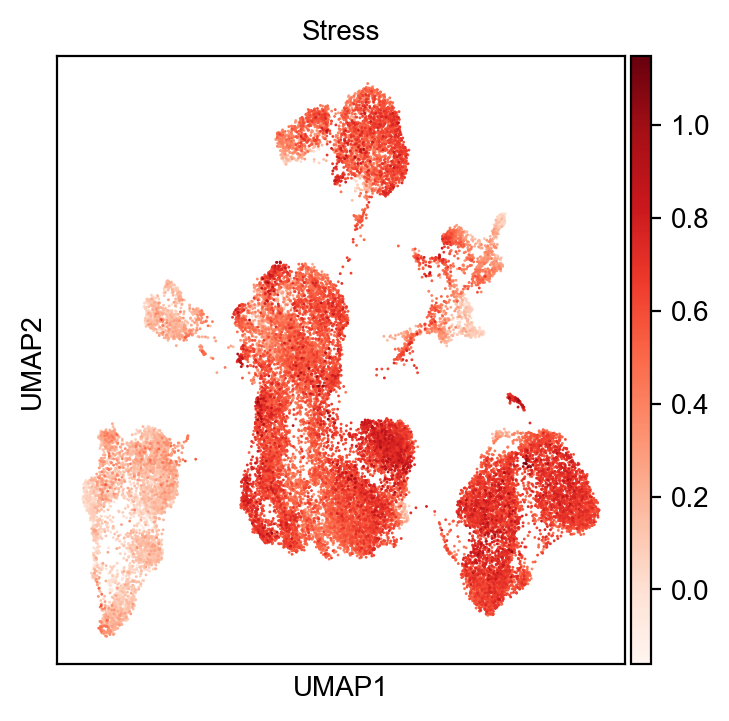

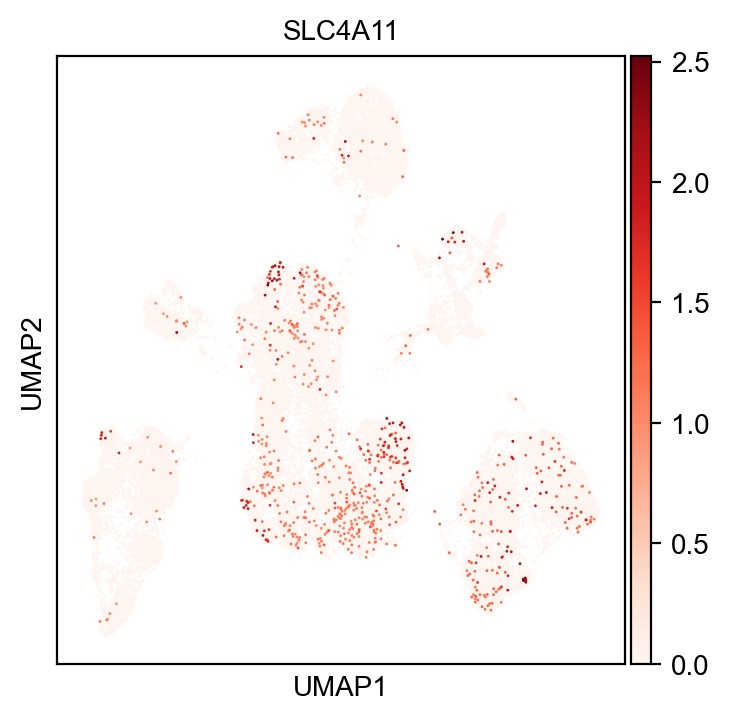

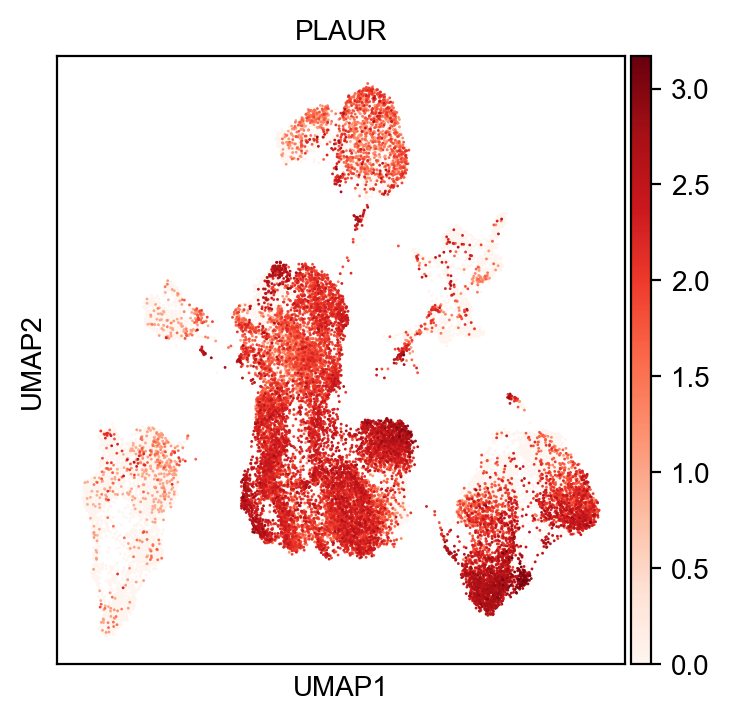

In [316]:
gene = "Slc4a11"
#plotScatter(adata.obs, "HPCS", gSig, gene)
rdata = adata.raw.to_adata()
#geneScore = np.array(rdata[:,rdata.var_names==gene].X).flatten() > 0
#print(geneScore)
#plotBoxPlot(adata.obs, gSig, slcScore, gene)
sc.pl.umap(adata, color=[gSig], cmap="Reds",save="mProstateAdeno.svg")
sc.pl.umap(adata, color=["HPCS"], cmap="Reds",save="mProstateHPCS.svg")
sc.pl.umap(adata, color=["Stress"], cmap="Reds",save="mProstateStress.svg")
sc.pl.umap(adata, color=["SLC4A11"], cmap="Reds",save="mProstateSlc4a11.svg")
sc.pl.umap(adata, color=["PLAUR"], cmap="Reds",save="mProstatePlaur.svg")

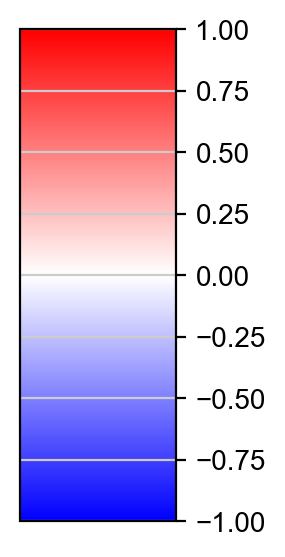

In [317]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and axis for the colorbar
fig, ax = plt.subplots(figsize=(1, 6))
fig.subplots_adjust(bottom=0.5)

# Create a colormap
cmap = plt.get_cmap('bwr')

# Create a colorbar with the colormap from -1 to 1
norm = plt.Normalize(vmin=-1, vmax=1)
cb = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='vertical')

fig.savefig(f"figures/Final/colorbar.svg")
# Display the colorbar
plt.show()